# **Core**

# **Config**

In [ ]:
import json

config = {}
config['Setup'] = {'Header':  ['Test', 'Model Name', 'Variable', 'Time', 'Memory Usage', 'Loss', 'Accuracy', 'Batch', 'Epochs'],
                   'Dir': 'Total Dataset',
                   'Features1': '/content/drive/MyDrive/Feature_extractor/ViT_features_extracted_32.npy',
                   'Features2':'/content/drive/MyDrive/Feature_extractor/ResNet50_features_extracted_32.npy',
                   'Features3':'/content/drive/MyDrive/Feature_extractor/ResNet50_features_extracted_Dense_32.npy',
                   'Features4':'/content/drive/MyDrive/Feature_extractor/ResNet50_features_extracted_32_768.npy',

                   'Features100':'/content/drive/MyDrive/Feature_extractor_101/features.npy',

                   'Features5': '/content/drive/MyDrive/Feature_extractor_HMDB51/ViT_features_extracted_32.npy',
                   'Features6':'/content/drive/MyDrive/Feature_extractor_HMDB51/ResNet50_features_extracted_32.npy',
                   'Features7':'/content/drive/MyDrive/Feature_extractor_HMDB51/ResNet50_features_extracted_Dense_32.npy',
                   'Features8':'/content/drive/MyDrive/Feature_extractor_HMDB51/ResNet50_features_extracted_32_768.npy',

                   'Features9': '/content/drive/MyDrive/Feature_extractor_101/ViT_features_extracted_32.npy',
                   'Features10':'/content/drive/MyDrive/Feature_extractor_101/ResNet50_features_extracted_32.npy',
                   'Features11':'/content/drive/MyDrive/Feature_extractor_101/ResNet50_features_extracted_Dense_32.npy',
                   'Features12':'/content/drive/MyDrive/Feature_extractor/ResNet50_features_extracted_32_768.npy',

                   'Labels': '/content/drive/MyDrive/Feature_extractor/labels.npy',
                   'Labels2': '/content/drive/MyDrive/Feature_extractor_HMDB51/labels.npy',
                   'Labels3': '/content/drive/MyDrive/Feature_extractor_101/labels.npy',


                   'Categories': 50,
                   'Categories2': 51,
                   'Categories3': 101,

                   'Epochs': 50,
                   'Batch': 4,
                   'Save': False}

config['Tests1'] = {}
config['Tests2'] = {}
config['Tests3'] = {}
config['Tests4'] = {}

config['Tests1']['LSTM'] = {'Layers': [1,2,4],
                           'Units': [128, 256, 512]}

config['Tests2']['Transformer'] = {'Layers': [1, 2, 4],
                                  'Input': [256, 512],
                                  'Internal': [256, 512],
                                  'Attention': [1, 2, 4]}

config['Tests3']['Transformer_FeatureResnet_Dense'] = {


                                  'Attention': [2,4]}

config['Tests4']['Transformer_Dense_FeatureResnet'] = {'Layers': [1,2,4],
                                  'Input': [256, 512],
                                  'Internal': [256, 512],
                                  'Attention': [1,2,4]}

config['Defaults'] = {}
config['Defaults']['LSTM'] = {'Layers': 1, 'Units': 128}
config['Defaults']['Transformer'] = {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2} #def Transformer_Model(sequence_length, input_size, categories, transformer_layers, feature_embedding_dim, dense_dim, num_attention_heads):
config['Defaults']['Transformer_FeatureResnet_Dense'] = {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2} #def Transformer_Model(sequence_length, input_size, categories, transformer_layers, feature_embedding_dim, dense_dim, num_attention_heads):
config['Defaults']['Transformer_Dense_FeatureResnet'] = {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2} #def Transformer_Model(sequence_length, input_size, categories, transformer_layers, feature_embedding_dim, dense_dim, num_attention_heads):


#internal là dense_dim

json_string = json.dumps(config)

with open('tests.json', 'w') as outfile:
    json.dump(json_string, outfile)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Dataset UCF50**

In [ ]:
from IPython.display import clear_output
!wget --no-check-certificate "https://www.crcv.ucf.edu/data/UCF50.rar"
!mkdir /content/UCF50
!unrar x UCF50.rar

# !unrar e UCF50.rar /content/UCF50/videos/


# !wget "https://raw.githubusercontent.com/temur-kh/video-classification-cv/master/data/classInd.txt" -O /content/data/classInd.txt
# !wget "https://raw.githubusercontent.com/temur-kh/video-classification-cv/master/data/testlist.txt" -O /content/data/testlist.txt
# !wget "https://raw.githubusercontent.com/temur-kh/video-classification-cv/master/data/trainlist.txt" -O /content/data/trainlist.txt
# clear_output()

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
Extracting  UCF50/HorseRace/v_HorseRace_g16_c03.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g16_c04.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g16_c05.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c01.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c02.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c03.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c04.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c05.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g18_c01.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g18_c02.avi                       23%  OK 
Extracting  UCF50/Horse

In [ ]:
import os
folder_name = 'Total Dataset'
os.makedirs(folder_name, exist_ok=True)

folder_name1 = 'Models_Tests'
os.makedirs(folder_name, exist_ok=True)

folder_name1 = 'Predicts'
os.makedirs(folder_name, exist_ok=True)

**Config**

**Format Video**

In [ ]:
import os
import sys
import csv
import cv2
import time
import psutil
import random
import numpy as np

DATASET_DIR = '/content/UCF50'#"UCF 101"

IMAGE_HEIGHT , IMAGE_WIDTH = 256, 256 #224, 224

SEQUENCE_LENGTH = 20

# Directory to output Processed Numpy Array to
OUTPUT_DIR = "Total Dataset"
OUTPUT_DIR_label = "/content/drive/MyDrive/Feature_extractor_dc"

# Name of all classes in video directory
all_classes_names = sorted(os.listdir(DATASET_DIR))

# Specify the list containing the names of the classes used for training. Feel free to choose any set of classes.
CLASSES_LIST = all_classes_names
print('CLASSES_LIST', CLASSES_LIST)
#CLASSES_LIST = random.sample(all_classes_names, 50)
#CLASSES_LIST = ["WalkingWithDog", "TaiChi", "Swing", "HorseRace"]
#CLASSES_LIST = ["PushUps"]

def frames_extraction(video_path):
    '''
    This function will extract the required frames from a video after resizing and normalizing them.
    Args:
        video_path: The path of the video in the disk, whose frames are to be extracted.
    Returns:
        frames_list: A list containing the resized and normalized frames of the video.
    '''

    # Declare a numpy array to store video frames.
    frames_list = []

    # Read the Video File using the VideoCapture object.
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1) #tính toán các khoảng frame để bỏ qua, ít nhất 1 frame trở lên

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window) #đọc video và chọn đến 1 khung hình cụ thể vd: video có 64 frame, skip_frames_window = 4, frame_count*skip_frames_window trong for lần lượt 1*4, 2*4, ... => nó chọn ra các vị trí các frame theo bước nhảy 4

        # Reading the frame from the video.
        success, frame = video_reader.read()

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Convert the resized frame from int to float, then normalize by dividing by 255 so each pixel is between 0
        # and 1, then finally add a dimension so it can be appended to frames_list
        #normalized_frame = np.divide(resized_frame.astype('float16'), 255)

        # Append the normalized frame into the frames list
        #frames_list.append(normalized_frame)
        frames_list.append(resized_frame)

    # Release the VideoCapture object.
    video_reader.release()

    # Return the frames list.
    return frames_list


def create_dataset():
    '''
    This function will extract the data of the selected classes and create the required dataset.
    Returns:
        features:          A list containing the extracted frames of the videos.
        labels:            A list containing the indexes of the classes associated with the videos.
        video_files_paths: A list containing the paths of the videos in the disk.
    '''
    # Declared Empty Numpy Arrays to store the features, labels and List to store video file path values.
    features = []
    labels = []
    video_files_paths = []

    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):

        # Display the name of the class whose data is being extracted.
        # if output.log_level > 1:
        #     print('Extracting Data of Class Number {}: {}'.format(class_index + 1, class_name))


        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name)) #lấy tên các file trong folder
        print('files_list', len(files_list))

        # Iterate through all the files present in the files list.
        for i, file_name in enumerate(files_list):
            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name) #láy full đường dẫn đến video
            print('video_file_path', video_file_path)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path) #list các frame đã được xử lý

            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified above.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

                # Print progress of current class
                print(f"Class {class_name} Progress: {i+1}/{len(files_list)}")
                # printProgressBar(i+1, len(files_list), prefix=class_name, suffix='Complete')
                #break;

    # else:
        # Create np array if there is enough memory for it
    features = np.asarray(features, dtype='uint8')
    # Return the frames, class index, and video file path.
    return features, labels, video_files_paths

# Add start data for creating the dataset

# Create the dataset.
features, labels, video_files_paths = create_dataset()

# Add output data for creating the dataset

# Print summary of processed array sizes
#f_size = sys.getsizeof(features) / 1024**3
f_size = (features.size * features.itemsize) / 1024**3
l_size = sys.getsizeof(labels) / 1024
p_size = sys.getsizeof(video_files_paths) / 1024

print("Numpy Array Sizes: ")
print("    {}: {:.4f}GB".format("Features", f_size))
print("    {}: {:.4f}KB".format("Labels", l_size))
print("    {}: {:.4f}KB".format("Video File Paths", p_size))
print("    {}: {:.4f}GB\n".format("Total size", f_size + (l_size / 1024**2) + (p_size / 1024**2)))

# Print array shapes
print("{} Shape: {}".format("Features", features.shape))
print("{} Shape: {}\n".format("Labels", (np.shape(labels))))

# Save features, labels, and video_file_paths to OUTPUT_DIR
np.save(os.path.join(OUTPUT_DIR_label, "features"), features)
np.save(os.path.join(OUTPUT_DIR_label,"labels"), labels)
np.save(os.path.join(OUTPUT_DIR,"video_file_paths"), video_files_paths)

# If we created a temporary save array to clear space in RAM, delete it
if os.path.exists("temp.npy"):
    os.remove("temp.npy")




Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
Class Biking Progress: 24/145
video_file_path /content/UCF50/Biking/v_Biking_g02_c06.avi
Class Biking Progress: 25/145
video_file_path /content/UCF50/Biking/v_Biking_g20_c07.avi
Class Biking Progress: 26/145
video_file_path /content/UCF50/Biking/v_Biking_g16_c04.avi
Class Biking Progress: 27/145
video_file_path /content/UCF50/Biking/v_Biking_g18_c02.avi
Class Biking Progress: 28/145
video_file_path /content/UCF50/Biking/v_Biking_g01_c04.avi
Class Biking Progress: 29/145
video_file_path /content/UCF50/Biking/v_Biking_g24_c03.avi
Class Biking Progress: 30/145
video_file_path /content/UCF50/Biking/v_Biking_g12_c04.avi
Class Biking Progress: 31/145
video_file_path /content/UCF50/Biking/v_Biking_g02_c04.avi
Class Biking Progress: 32/145
video_file_path /content/UCF50/Biking/v_Biking_g24_c06.avi
Class Biking Progress: 33/145
video_file_path /content/UCF50/Biking/v_Biking_g17_c03.avi
Class Biking Progress: 34/145
video_file_path /conten

# **Dataset UCF101**

In [ ]:
from IPython.display import clear_output
!wget --no-check-certificate "https://www.crcv.ucf.edu/data/UCF101/UCF101.rar" #https://www.crcv.ucf.edu/data/UCF101.php/UCF101/UCF101.rar #https://www.crcv.ucf.edu/data/UCF50.rar
!mkdir /content/UCF101
!unrar x UCF101.rar

# !unrar e UCF50.rar /content/UCF50/videos/


# !wget "https://raw.githubusercontent.com/temur-kh/video-classification-cv/master/data/classInd.txt" -O /content/data/classInd.txt
# !wget "https://raw.githubusercontent.com/temur-kh/video-classification-cv/master/data/testlist.txt" -O /content/data/testlist.txt
# !wget "https://raw.githubusercontent.com/temur-kh/video-classification-cv/master/data/trainlist.txt" -O /content/data/trainlist.txt
# clear_output()

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g06_c05.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g06_c06.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g06_c07.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c01.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c02.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c03.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c04.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c05.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c06.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c07.avi             62%  OK 
Extracting  UCF-101/Pla

In [ ]:
import os
folder_name = 'Total Dataset'
os.makedirs(folder_name, exist_ok=True)

folder_name1 = 'Models_Tests'
os.makedirs(folder_name, exist_ok=True)

folder_name1 = 'Predicts'
os.makedirs(folder_name, exist_ok=True)

In [ ]:
import os
import sys
import csv
import cv2
import time
import psutil
import random
import numpy as np

DATASET_DIR = '/content/UCF-101'#"UCF 101"

# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 32, 32 #224, 224

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 20

# Directory to output Processed Numpy Array to
OUTPUT_DIR = "Total Dataset"
OUTPUT_DIR_label = "/content/drive/MyDrive/Feature_extractor_101"

# Name of all classes in video directory
all_classes_names = sorted(os.listdir(DATASET_DIR))

# Specify the list containing the names of the classes used for training. Feel free to choose any set of classes.
CLASSES_LIST = all_classes_names
print('CLASSES_LIST', CLASSES_LIST)
#CLASSES_LIST = random.sample(all_classes_names, 50)
#CLASSES_LIST = ["WalkingWithDog", "TaiChi", "Swing", "HorseRace"]
#CLASSES_LIST = ["PushUps"]

def frames_extraction(video_path):
    '''
    This function will extract the required frames from a video after resizing and normalizing them.
    Args:
        video_path: The path of the video in the disk, whose frames are to be extracted.
    Returns:
        frames_list: A list containing the resized and normalized frames of the video.
    '''

    # Declare a numpy array to store video frames.
    frames_list = []

    # Read the Video File using the VideoCapture object.
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1) #tính toán các khoảng frame để bỏ qua, ít nhất 1 frame trở lên

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window) #đọc video và chọn đến 1 khung hình cụ thể vd: video có 64 frame, skip_frames_window = 4, frame_count*skip_frames_window trong for lần lượt 1*4, 2*4, ... => nó chọn ra các vị trí các frame theo bước nhảy 4

        # Reading the frame from the video.
        success, frame = video_reader.read()

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Convert the resized frame from int to float, then normalize by dividing by 255 so each pixel is between 0
        # and 1, then finally add a dimension so it can be appended to frames_list
        #normalized_frame = np.divide(resized_frame.astype('float16'), 255)

        # Append the normalized frame into the frames list
        #frames_list.append(normalized_frame)
        frames_list.append(resized_frame)

    # Release the VideoCapture object.
    video_reader.release()

    # Return the frames list.
    return frames_list


def create_dataset():
    '''
    This function will extract the data of the selected classes and create the required dataset.
    Returns:
        features:          A list containing the extracted frames of the videos.
        labels:            A list containing the indexes of the classes associated with the videos.
        video_files_paths: A list containing the paths of the videos in the disk.
    '''
    # Declared Empty Numpy Arrays to store the features, labels and List to store video file path values.
    features = []
    labels = []
    video_files_paths = []

    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):

        # Display the name of the class whose data is being extracted.
        # if output.log_level > 1:
        #     print('Extracting Data of Class Number {}: {}'.format(class_index + 1, class_name))


        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name)) #lấy tên các file trong folder
        print('files_list', len(files_list))

        # Iterate through all the files present in the files list.
        for i, file_name in enumerate(files_list):
            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name) #láy full đường dẫn đến video
            print('video_file_path', video_file_path)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path) #list các frame đã được xử lý

            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified above.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

                # Print progress of current class
                print(f"Class {class_name} Progress: {i+1}/{len(files_list)}")
                # printProgressBar(i+1, len(files_list), prefix=class_name, suffix='Complete')
                #break;
    # else:
        # Create np array if there is enough memory for it
    features = np.asarray(features, dtype='uint8')
    # Return the frames, class index, and video file path.
    return features, labels, video_files_paths

# Add start data for creating the dataset

# Create the dataset.
features, labels, video_files_paths = create_dataset()

# Add output data for creating the dataset

# Print summary of processed array sizes
#f_size = sys.getsizeof(features) / 1024**3
f_size = (features.size * features.itemsize) / 1024**3
l_size = sys.getsizeof(labels) / 1024
p_size = sys.getsizeof(video_files_paths) / 1024

print("Numpy Array Sizes: ")
print("    {}: {:.4f}GB".format("Features", f_size))
print("    {}: {:.4f}KB".format("Labels", l_size))
print("    {}: {:.4f}KB".format("Video File Paths", p_size))
print("    {}: {:.4f}GB\n".format("Total size", f_size + (l_size / 1024**2) + (p_size / 1024**2)))

# Print array shapes
print("{} Shape: {}".format("Features", features.shape))
print("{} Shape: {}\n".format("Labels", (np.shape(labels))))

# Save features, labels, and video_file_paths to OUTPUT_DIR
np.save(os.path.join(OUTPUT_DIR, "features"), features)
np.save(os.path.join(OUTPUT_DIR_label,"labels"), labels)
np.save(os.path.join(OUTPUT_DIR,"video_file_paths"), video_files_paths)

# If we created a temporary save array to clear space in RAM, delete it
if os.path.exists("temp.npy"):
    os.remove("temp.npy")




Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
video_file_path /content/UCF-101/Skijet/v_Skijet_g04_c04.avi
Class Skijet Progress: 38/100
video_file_path /content/UCF-101/Skijet/v_Skijet_g07_c03.avi
Class Skijet Progress: 39/100
video_file_path /content/UCF-101/Skijet/v_Skijet_g12_c03.avi
Class Skijet Progress: 40/100
video_file_path /content/UCF-101/Skijet/v_Skijet_g14_c01.avi
Class Skijet Progress: 41/100
video_file_path /content/UCF-101/Skijet/v_Skijet_g08_c04.avi
Class Skijet Progress: 42/100
video_file_path /content/UCF-101/Skijet/v_Skijet_g05_c02.avi
Class Skijet Progress: 43/100
video_file_path /content/UCF-101/Skijet/v_Skijet_g11_c01.avi
Class Skijet Progress: 44/100
video_file_path /content/UCF-101/Skijet/v_Skijet_g02_c03.avi
Class Skijet Progress: 45/100
video_file_path /content/UCF-101/Skijet/v_Skijet_g06_c01.avi
Class Skijet Progress: 46/100
video_file_path /content/UCF-101/Skijet/v_Skijet_g04_c01.avi
Class Skijet Progress: 47/100
video_file_path /content/UCF-101/

# **Dataset HMDB51**

In [ ]:
from IPython.display import clear_output
!wget --no-check-certificate "http://serre-lab.clps.brown.edu/wp-content/uploads/2013/10/hmdb51_org.rar" #https://www.crcv.ucf.edu/data/UCF101.php/UCF101/UCF101.rar #https://www.crcv.ucf.edu/data/UCF50.rar
!mkdir /content/HMDB51
!unrar x HMDB51.rar

# !unrar e UCF50.rar /content/UCF50/videos/


# !wget "https://raw.githubusercontent.com/temur-kh/video-classification-cv/master/data/classInd.txt" -O /content/data/classInd.txt
# !wget "https://raw.githubusercontent.com/temur-kh/video-classification-cv/master/data/testlist.txt" -O /content/data/testlist.txt
# !wget "https://raw.githubusercontent.com/temur-kh/video-classification-cv/master/data/trainlist.txt" -O /content/data/trainlist.txt
# clear_output()


--2024-07-21 16:15:56--  http://serre-lab.clps.brown.edu/wp-content/uploads/2013/10/hmdb51_org.rar
Resolving serre-lab.clps.brown.edu (serre-lab.clps.brown.edu)... 128.148.254.114
Connecting to serre-lab.clps.brown.edu (serre-lab.clps.brown.edu)|128.148.254.114|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://serre-lab.clps.brown.edu/wp-content/uploads/2013/10/hmdb51_org.rar [following]
--2024-07-21 16:15:57--  https://serre-lab.clps.brown.edu/wp-content/uploads/2013/10/hmdb51_org.rar
Connecting to serre-lab.clps.brown.edu (serre-lab.clps.brown.edu)|128.148.254.114|:443... 

In [ ]:
import os
import sys
import csv
import cv2
import time
import psutil
import random
import numpy as np

# from output import Output
# from output import printProgressBar

# Specify the directory containing the UCF101 dataset.
DATASET_DIR = '/content/HMDB51'#"UCF 101"

# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 32, 32 #224, 224

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 20

# Directory to output Processed Numpy Array to
OUTPUT_DIR = "Total Dataset"
OUTPUT_DIR_label = "/content/drive/MyDrive/Feature_extractor_HMDB51"

# Name of all classes in video directory
all_classes_names = sorted(os.listdir(DATASET_DIR))

# Specify the list containing the names of the classes used for training. Feel free to choose any set of classes.
CLASSES_LIST = all_classes_names
print('CLASSES_LIST', CLASSES_LIST)
#CLASSES_LIST = random.sample(all_classes_names, 50)
#CLASSES_LIST = ["WalkingWithDog", "TaiChi", "Swing", "HorseRace"]
#CLASSES_LIST = ["PushUps"]

def frames_extraction(video_path):
    '''
    This function will extract the required frames from a video after resizing and normalizing them.
    Args:
        video_path: The path of the video in the disk, whose frames are to be extracted.
    Returns:
        frames_list: A list containing the resized and normalized frames of the video.
    '''

    # Declare a numpy array to store video frames.
    frames_list = []

    # Read the Video File using the VideoCapture object.
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1) #tính toán các khoảng frame để bỏ qua, ít nhất 1 frame trở lên

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window) #đọc video và chọn đến 1 khung hình cụ thể vd: video có 64 frame, skip_frames_window = 4, frame_count*skip_frames_window trong for lần lượt 1*4, 2*4, ... => nó chọn ra các vị trí các frame theo bước nhảy 4

        # Reading the frame from the video.
        success, frame = video_reader.read()

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Convert the resized frame from int to float, then normalize by dividing by 255 so each pixel is between 0
        # and 1, then finally add a dimension so it can be appended to frames_list
        #normalized_frame = np.divide(resized_frame.astype('float16'), 255)

        # Append the normalized frame into the frames list
        #frames_list.append(normalized_frame)
        frames_list.append(resized_frame)

    # Release the VideoCapture object.
    video_reader.release()

    # Return the frames list.
    return frames_list


def create_dataset():
    '''
    This function will extract the data of the selected classes and create the required dataset.
    Returns:
        features:          A list containing the extracted frames of the videos.
        labels:            A list containing the indexes of the classes associated with the videos.
        video_files_paths: A list containing the paths of the videos in the disk.
    '''
    # Declared Empty Numpy Arrays to store the features, labels and List to store video file path values.
    features = []
    labels = []
    video_files_paths = []

    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):

        # Display the name of the class whose data is being extracted.
        # if output.log_level > 1:
        #     print('Extracting Data of Class Number {}: {}'.format(class_index + 1, class_name))


        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name)) #lấy tên các file trong folder
        print('files_list', len(files_list))

        # Iterate through all the files present in the files list.
        for i, file_name in enumerate(files_list):
            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name) #láy full đường dẫn đến video
            print('video_file_path', video_file_path)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path) #list các frame đã được xử lý

            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified above.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

                # Print progress of current class
                print(f"Class {class_name} Progress: {i+1}/{len(files_list)}")
                # printProgressBar(i+1, len(files_list), prefix=class_name, suffix='Complete')
                #break;
    # else:
        # Create np array if there is enough memory for it
    features = np.asarray(features, dtype='uint8')
    # Return the frames, class index, and video file path.
    return features, labels, video_files_paths

# Add start data for creating the dataset

# Create the dataset.
features, labels, video_files_paths = create_dataset()

# Add output data for creating the dataset

# Print summary of processed array sizes
#f_size = sys.getsizeof(features) / 1024**3
f_size = (features.size * features.itemsize) / 1024**3
l_size = sys.getsizeof(labels) / 1024
p_size = sys.getsizeof(video_files_paths) / 1024

print("Numpy Array Sizes: ")
print("    {}: {:.4f}GB".format("Features", f_size))
print("    {}: {:.4f}KB".format("Labels", l_size))
print("    {}: {:.4f}KB".format("Video File Paths", p_size))
print("    {}: {:.4f}GB\n".format("Total size", f_size + (l_size / 1024**2) + (p_size / 1024**2)))

# Print array shapes
print("{} Shape: {}".format("Features", features.shape))
print("{} Shape: {}\n".format("Labels", (np.shape(labels))))

# Save features, labels, and video_file_paths to OUTPUT_DIR
np.save(os.path.join(OUTPUT_DIR, "features"), features)
np.save(os.path.join(OUTPUT_DIR_label,"labels"), labels)
np.save(os.path.join(OUTPUT_DIR,"video_file_paths"), video_files_paths)

# If we created a temporary save array to clear space in RAM, delete it
if os.path.exists("temp.npy"):
    os.remove("temp.npy")




CLASSES_LIST []
Numpy Array Sizes: 
    Features: 0.0000GB
    Labels: 0.0547KB
    Video File Paths: 0.0547KB
    Total size: 0.0000GB

Features Shape: (0,)
Labels Shape: (0,)



FileNotFoundError: [Errno 2] No such file or directory: 'Total Dataset/features.npy'

# **DataGenerator**

In [ ]:
import math
import numpy as np

from tensorflow.keras.utils import Sequence

class DataGenerator(Sequence):

    def __init__(self, x, y, batch_size=32):
        self.x = np.asarray(x)
        self.y = np.asarray(y)
        self.batch_size = batch_size
        self.indices = np.arange(self.x.shape[0]) #mảng số chứa video
        np.random.default_rng().shuffle(self.indices)

    def __len__(self):
        return math.ceil(self.x.shape[0]/self.batch_size) #math.ceil làm tròn lên, trả về số lượng batch mỗi epoch

    def __getitem__(self, idx):
        ind = self.indices[idx*self.batch_size:(idx+1)*self.batch_size] #lấy batch trong khoảng [start : end]

        batch_x = self.x[ind]
        batch_y = self.y[ind]
        return batch_x, batch_y

    def on_epoch_end(self):
        np.random.shuffle(self.indices)


class PredictGenerator(Sequence):

    def __init__(self, x, batch_size=32):
        self.x = np.asarray(x)
        self.batch_size = batch_size
        self.indices = np.arange(self.x.shape[0])

    def __len__(self):
        return math.ceil(self.x.shape[0]/self.batch_size)

    def __getitem__(self, idx):
        ind = self.indices[idx*self.batch_size:(idx+1)*self.batch_size]

        batch_x = self.x[ind]
        return batch_x

# **Model**

# **ResNet LSTM**

In [ ]:
from tensorflow import keras
import tensorflow as tf
import tensorflow.keras.layers as layers
from tensorflow.keras.layers import Input


def LSTM_Model(sequence_length, input_size, categories, LSTM_layers, LSTM_units):
  inputs = keras.Input(shape=(sequence_length, input_size))
  lstm = layers.LSTM(LSTM_units, return_sequences = (LSTM_layers > 1))(inputs) #return_sequence: True là trả về đầu ra của một chuỗi (một đầu ra ở mỗi bước thời gian) => đầu ra độc lập ở mỗi bước thời gian , False là đầu ra chỉ ở bước thời gian cuối cùng
  lstm = layers.Dropout(0.2)(lstm)
  for i in range(LSTM_layers-1):
    lstm = layers.LSTM(LSTM_units, return_sequences = (i != LSTM_layers - 2))(lstm) #vì đk ở return_sequence nên 2 lớp LSTM cuối không trả về đầu ra ở 2 bước thời gian mà gộp lại ở lớp Dense bên dưới
    lstm = layers.Dropout(0.2)(lstm)
  outputs = layers.Dense(categories, activation = 'softmax')(lstm)
  model = keras.Model(inputs, outputs, name="LSTM_Model")
  model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])
  return model

# model = LSTM_Model(sequence_length=100, input_size=50, categories=10, LSTM_layers=5, LSTM_units=64)
# print(model.summary())


# **ViT pretrain**

In [ ]:
# prompt: hạ thấp phiên bản tensorflow

!pip install tensorflow==2.13.0
!pip install vit_keras
# !pip install tensorflow_addons
!pip install tensorflow-addons==0.22.0
# !pip install -q -U tensorflow-addons
# pip install --user tensorflow-addons==0.8.3
# pip install --user tensorflow==2.2.0-rc3

  Using cached vit_keras-0.1.2-py3-none-any.whl.metadata (4.0 kB)
  Using cached validators-0.33.0-py3-none-any.whl.metadata (3.8 kB)
Using cached vit_keras-0.1.2-py3-none-any.whl (24 kB)
Using cached validators-0.33.0-py3-none-any.whl (43 kB)


In [ ]:
# !pip install vit_keras
# !pip install tensorflow_addons

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from vit_keras import vit, utils

vit_types = {'b16': vit.vit_b16, 'b32': vit.vit_b32, 'l16': vit.vit_l16, 'l32': vit.vit_l32}

class ViT(layers.Layer):
    """
    PositionalEncoding Layer applies Input Embedding and Positional Encoding to initial Inputs of the Transformer
    *Extends tensorflow.keras.layers.Layer

    Attributes
    ----------
        vit_type: String
            vit implimentation to use for feature extraction
        activation: String
            activation fuction to use for training
        pretrained: bool
            use pretrained implementaion or randomly generated weights
        include_top: bool
            include top dense layer for classification
        classes: bool
            total number of dense node in top layer

    Methods
    -------
        call(inputs: tensor (None, sequence_length, projection_dim):
            Applies layer to inputs
        compute_output_shape(inputs_shape):
            Returns the output shape of layer
    """
    def __init__(self, vit_type, image_size, activation, pretrained, include_top, pretrained_top, classes=1024, **kwargs):
        super(ViT, self).__init__(**kwargs)

        self.classes = classes

        # Layer to compute positional data
        self.vision_t = vit_types[vit_type](image_size=image_size, activation=activation, pretrained=pretrained, classes=classes, include_top=include_top, pretrained_top=pretrained_top)

    def call(self, inputs):
        t = self.vision_t(inputs)
        return t

    def compute_output_shape(self, input_shape):
        return (None, self.classes)

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:
def Vision_Transformer_Model(vit_type, sequence_length, image_size):
    """
    Creates a Vision Transformer using Google's pretrained implementation converted to TensorFlow found at https://github.com/faustomorales/vit-keras

    Attributes
    ----------
        vit_type: String
            vit implimentation to use for feature extraction
        sequence_length: int
            length of the input sequence to the vision transformer
        image_size: int
            size of height and width of images used

    Returns
    -------
        model: keras.Model
            Vision Transformer Model accoring to input specifications
    """
    # Define input layer of model
    inputs = keras.Input(shape=(sequence_length, image_size, image_size,3))

    # Create Vit Layer using base or large # chỗ này là ViT_extension
    vision_t = ViT(vit_type=vit_type, image_size=image_size, activation='sigmoid', pretrained=True, include_top=False, pretrained_top=False)

    # Apply Vision Transformer to inputs
    outputs = layers.TimeDistributed(vision_t)(inputs)

    # Create model with input and output as defined above
    model = keras.Model(inputs, outputs, name="Vision_Transformer_Model")

    # Compile the created model with loss function, optimizer, and metrics to use when training
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

    return model

# **Recurrent Transformer**

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

class Patches(layers.Layer):
    """
    Patches takes an input image and breaks it into patches of size patch_size x patch_size. Changes
    input tensor shape to be (batch_size, # patches, patch_data) where patch data is patch_size *
    patch_size * 3 (to conserve RGB data of each pixel in the patch)
    *Extends tensorflow.keras.layers.Layer

    Attributes
    ----------
        patch_size: int
            Length of one side of patch (patch will be patch_size by patch_size)


    Methods
    -------
        call(inputs):
            Applies layer to inputs
        compute_output_shape(inputs_shape):
            Returns the output shape of layer
    """
    def __init__(self, patch_size, **kwargs):
        super(Patches, self).__init__( **kwargs)
        # Save initial parameters
        self.patch_size = patch_size

    def call(self, images):
        # Get batch_size of tensor for reshaping of final tensor
        batch_size = tf.shape(images)[0]

        # Create patches from images, will be size self.patch_size x self.patch_size. Use strides =
        # [1,1,1,1] to not skip any section of the image
        patches = tf.image.extract_patches(
            images = images,
            sizes=[1,self.patch_size, self.patch_size, 1],
            strides=[1,self.patch_size, self.patch_size, 1],
            rates=[1,1,1,1],
            padding="VALID",
        )

        # Get size of patch data, will be patch_size x patch_size * 3 (3 values for each pixel in patch)
        patch_dims = patches.shape[-1]

        # Reshape patch for future layers, will be (batch_size, number_of_patches, patch_dims)
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])

        return patches

    def compute_output_shape(self, input_shape):
        return (None, None, (self.patch_size**2) * 3)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

class PositionalEncoding(layers.Layer):
    """
    PositionalEncoding Layer applies Input Embedding and Positional Encoding to initial Inputs of the Transformer
    *Extends tensorflow.keras.layers.Layer

    Attributes
    ----------
        sequence_length: int
            Length of the input sequence. Also used as the size of the vocabulary of the encoding
            since we are encoding the positon data of the sequence, which is a fixed sized.
        projection_dim: int
            Dimensionality of dense projection output

    Methods
    -------
        call(inputs: tensor (None, sequence_length, projection_dim):
            Applies layer to inputs
        compute_output_shape(inputs_shape):
            Returns the output shape of layer
    """
    def __init__(self, sequence_length, projection_dim, **kwargs):
        super(PositionalEncoding, self).__init__(**kwargs)
        # Layer to compute positional data
        self.position_embeddings = layers.Embedding(input_dim=sequence_length, output_dim=projection_dim)

        # Linear project layer for input
        self.projection = layers.Dense(units=projection_dim)

        # Save initialization parameters
        self.sequence_length = sequence_length
        self.projection_dim = projection_dim

    def call(self, inputs):
        # Create tensor of length position
        positions = tf.range(start=0, limit=self.sequence_length, delta=1)

        # Apply embedding to each position
        encoded_positions = self.position_embeddings(positions)

        # Apply linear projection to input
        projection = self.projection(inputs)

        # Combine input with positional information
        encoding = projection + encoded_positions

        return encoding

    def compute_output_shape(self, input_shape):
        return (None, self.sequence_length, self.projection_dim)

class Encoder(layers.Layer):
    """
    Encoder Layer applies multihead attention to inputs (using inputs as Query, Keys, and Values), as well as layer
    normalization and dense projection according to transformer designed by Vaswani et al. (Note: Mask not implemented)
    *Extends tensorflow.keras.layers.Layer

    Attributes
    ----------
        embed_dim: int
            Dimensionality of the input embedding (conserved throughout)
        dense_dim: int
            Dimensionality of the first dense projection hidden layer
        num_heads: int
            Number of attention heads (for multi-head attention)
        activation: string
            Activation function for dense layer (default=relu)

    Methods
    -------
        call(inputs):
            Applies layer to inputs
        compute_output_shape(inputs_shape):
            Returns the output shape of layer
    """
    def __init__(self, embed_dim, dense_dim, num_heads, activation='relu', **kwargs):
        super(Encoder, self).__init__(**kwargs)
        # Attention layer with num_head heads and embed_dim output dimension
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim, dropout=0.25)

        # Linear projection layers for input with 2 hidden layers, first uses dense_dim layers then transforms back to
        # embed_dim to keep shape the same
        self.dense_proj = keras.Sequential([layers.Dense(dense_dim, activation=activation), layers.Dense(embed_dim),])

        # Normalization layer
        self.layernorm = layers.LayerNormalization()

        # Save initial parameters
        self.embed_dim = embed_dim
        self.dense_dim = dense_dim
        self.num_heads = num_heads

    def call(self, inputs):
        # Compute attention matrix using Multi-Head Attention (inputs is Q, K, and V)
        # Attention(Q,K,V) = softmax([Q dot K transpose] / sqrt(dk)) * V
        inputs_reshaped = tf.reshape(inputs, [tf.shape(inputs)[0], -1])  # Flatten the last two dimensions
        attention_matrix = self.attention(inputs_reshaped, inputs_reshaped, attention_mask=None)
        # attention_matrix = self.attention(inputs, inputs, attention_mask=None)

        # Apply attention matrix to input and normalize (Risidual Connection)
        normalized_attention_output = self.layernorm(inputs + attention_matrix)

        # Apply linear projection (feed forward network) to normalized result of attention layer
        projection = self.dense_proj(normalized_attention_output)

        # Add feed forward projection results to intial inputs and normalize one more time (Risidual Connection)
        normalized_projection = self.layernorm(normalized_attention_output + projection)

        return normalized_projection

    def compute_output_shape(self, input_shape):
        return input_shape

def BuildEncoder(sequence_length, input_dim, embed_dim, dense_dim, num_heads, model_name="transformer"):
    """
    BuildEncoder will build a model that applies PositionalEncoding to inputs, then feeds those
    inputs to a transformer encoder

    Parameters
    ----------
    sequence_length: int
        length of the input sequence of the transformer
    input_dim: int
        dimensionality of the input tensor
    embed_dim: int
        output dimension of the embedding layer
    dense_dim: int
        number of hidden units of first hidden layer of linear projection in the Encoder
    num_heads: int
        number of attention heads
    model_name: string
        name of the resulting model (default="transformer") *Must be changed if using multiple transformer layers

    Returns
    -------
    model: keras.Model
        a transformer model with input layer=keras.Input with shape (sequence_length, embed_dim), and output layer=Encoder
    """
    # Input of model, tensor will be of shape (Batch_size, sequence_length, None) where None is the dimensionality of the
    # input data
    inputs = keras.Input(shape=(sequence_length, input_dim))

    # Embedding layer, will return an embedding with embed_dim dimensionality that maintains sequence_length
    embeded = PositionalEncoding(sequence_length, embed_dim)(inputs)

    # Encoder layer, will maintain input_shape. Will have num_heads attention heads, and the linear projection will have
    # 2 hidden layers, first with dense_dim units and second with embed_dim units to maintain input_shape
    encoded = Encoder(embed_dim, dense_dim, num_heads)(embeded)

    # Create the model as described
    model = keras.Model(inputs, encoded, name=model_name)

    return model

In [ ]:
# resnet = np.load('/content/drive/MyDrive/Feature_extractor/ResNet50_features_extracted.npy')

def Transformer_Model(sequence_length, input_size, categories, transformer_layers, feature_embedding_dim, dense_dim, num_attention_heads):
    """
    Creates a Transformer Model by first applying a positional embedding to the input, then passing the combined tensor to an encoding layer
    that applies multi-headed self attention to make predctions.

    Arguments
    ---------
        sequence_length: int
            Length of the input sequence of the model
        input_size: int
            Size of the last dimension of the input tensor
        categories: int
            Number of classification categories possible in the output (also number of units of final dense prediction layer
        transformer_layers:
            Number of transformer layers to add to the model
        feature_embedding_dim: int
            Dimensionality of the output of the embedding layer of the transformer (will be output dimensionality of the transformer)
        dense_dim: int
            Dimensionality of the intermediate hidden dense layer in the encoder
        num_attention_heads: int
            Number of heads of attention used in the multi-headed attention section of the transformer

    Returns
    -------
        model: keras.Model
            Transformer Model according to input specifications
    """
    # Define input layer of model
    inputs = keras.Input(shape=(sequence_length, input_size))

    # Create first transformer layer with input values = model input
    trans = BuildEncoder(sequence_length, input_size, feature_embedding_dim, dense_dim, num_attention_heads, "transformer")(inputs)

    # Create remaining transformer layers with input values = transformer outputs
    for i in range(transformer_layers-1):
        trans = BuildEncoder(sequence_length, feature_embedding_dim, feature_embedding_dim, dense_dim, num_attention_heads, "transformer" + str(i+2))(trans)

#  # Can use pooling instead of flatten for quicker computation
    pool = layers.GlobalMaxPooling1D()(trans)

#     # Flatten final output for dense layer
    # pool = layers.Flatten()(trans)

#     # # Add dropout layer
    dropout = layers.Dropout(0.1)(pool)

#     # Creates final layer of the model, a dense prediction layer
    outputs = layers.Dense(categories, activation="softmax")(dropout)

    # Create model with input and output as defined above
    model = keras.Model(inputs, outputs, name="Transformer")

    # Compile the created model with loss function, optimizer, and metrics to use when training
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

    return model

test model

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

class PositionalEncoding(layers.Layer):
    def __init__(self, sequence_length, projection_dim, **kwargs):
        super(PositionalEncoding, self).__init__(**kwargs)
        self.position_embeddings = layers.Embedding(input_dim=sequence_length, output_dim=projection_dim)
        self.projection = layers.Dense(units=projection_dim)
        self.sequence_length = sequence_length
        self.projection_dim = projection_dim

    def call(self, inputs):
        positions = tf.range(start=0, limit=self.sequence_length, delta=1)
        encoded_positions = self.position_embeddings(positions)
        projection = self.projection(inputs)
        encoding = projection + encoded_positions
        return encoding

    def compute_output_shape(self, input_shape):
        return (None, self.sequence_length, self.projection_dim)

class Encoder(layers.Layer):
    def __init__(self, embed_dim, dense_dim, num_heads, activation='relu', **kwargs):
        super(Encoder, self).__init__(**kwargs)
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim, dropout=0.25)
        self.dense_proj = keras.Sequential([
            layers.Dense(dense_dim, activation=activation),
            layers.Dense(embed_dim),
        ])
        self.layernorm = layers.LayerNormalization()
        self.embed_dim = embed_dim
        self.dense_dim = dense_dim
        self.num_heads = num_heads

    def call(self, inputs):
        attention_matrix = self.attention(inputs, inputs, attention_mask=None)
        normalized_attention_output = self.layernorm(inputs + attention_matrix)
        projection = self.dense_proj(normalized_attention_output)
        normalized_projection = self.layernorm(normalized_attention_output + projection)
        return normalized_projection

    def compute_output_shape(self, input_shape):
        return input_shape

def BuildEncoder(sequence_length, input_dim, embed_dim, dense_dim, num_heads, model_name="transformer"):
    inputs = keras.Input(shape=(sequence_length, input_dim))
    embeded = PositionalEncoding(sequence_length, embed_dim)(inputs)
    encoded = Encoder(embed_dim, dense_dim, num_heads)(embeded)
    model = keras.Model(inputs, encoded, name=model_name)
    return model

def Transformer_Model(sequence_length, input_size, categories, transformer_layers, feature_embedding_dim, dense_dim, num_attention_heads):
    inputs = keras.Input(shape=(sequence_length, input_size))
    trans = BuildEncoder(sequence_length, input_size, feature_embedding_dim, dense_dim, num_attention_heads, "transformer")(inputs)

    for i in range(transformer_layers-1):
        trans = Encoder(feature_embedding_dim, dense_dim, num_attention_heads)(trans)

    pool = layers.GlobalMaxPooling1D()(trans)
    dropout = layers.Dropout(0.1)(pool)
    outputs = layers.Dense(categories, activation="softmax")(dropout)

    model = keras.Model(inputs, outputs, name="Transformer")
    model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=["accuracy"])

    return model

sequence_length = 20
input_size = 32
categories = 50
transformer_layers = 2
feature_embedding_dim = 256
dense_dim = 256
num_attention_heads = 4

model = Transformer_Model(sequence_length, input_size, categories, transformer_layers, feature_embedding_dim, dense_dim, num_attention_heads)
model.summary()


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 20, 32)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │       1,197,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_1 (Encoder)                  │ (None, 20, 256)             │       1,184,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d                 │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 50)                  │          12,850 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,394,418 (9.13 MB)

 Trainable params: 2,394,418 (9.13 MB)

 Non-trainable params: 0 (0.00 B)

# **ReT-ResNet50**

In [ ]:
from tensorflow import keras
keras.utils.get_custom_objects().clear()

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
# @keras.utils.register_keras_serializable(package="PositionalEncoding")
class PositionalEncoding(layers.Layer):
    """
    PositionalEncoding Layer applies Input Embedding and Positional Encoding to initial Inputs of the Transformer
    *Extends tensorflow.keras.layers.Layer

    Attributes
    ----------
        sequence_length: int
            Length of the input sequence. Also used as the size of the vocabulary of the encoding
            since we are encoding the positon data of the sequence, which is a fixed sized.
        projection_dim: int
            Dimensionality of dense projection output

    Methods
    -------
        call(inputs: tensor (None, sequence_length, projection_dim):
            Applies layer to inputs
        compute_output_shape(inputs_shape):
            Returns the output shape of layer
    """
    def __init__(self, sequence_length, projection_dim, **kwargs):
        super(PositionalEncoding, self).__init__(**kwargs)
        # Layer to compute positional data
        self.position_embeddings = layers.Embedding(input_dim=sequence_length, output_dim=projection_dim)

        # Linear project layer for input
        self.projection = layers.Dense(units=projection_dim)

        # Save initialization parameters
        self.sequence_length = sequence_length
        self.projection_dim = projection_dim
    # def build(self, input_shape):
    #     # Không cần định nghĩa lại position_embeddings hoặc projection ở đây
    #     pass

    def call(self, inputs):
        # Create tensor of length position
        positions = tf.range(start=0, limit=self.sequence_length, delta=1)

        # Apply embedding to each position
        encoded_positions = self.position_embeddings(positions)

        # Apply linear projection to input
        projection = self.projection(inputs)

        # Combine input with positional information
        encoding = projection + encoded_positions

        return encoding

    def compute_output_shape(self, input_shape):
        return (None, self.sequence_length, self.projection_dim)





# @keras.utils.register_keras_serializable(package="Encoder")
class Encoder(layers.Layer):
    """
    Encoder Layer applies multihead attention to inputs (using inputs as Query, Keys, and Values), as well as layer
    normalization and dense projection according to transformer designed by Vaswani et al. (Note: Mask not implemented)
    *Extends tensorflow.keras.layers.Layer

    Attributes
    ----------
        embed_dim: int
            Dimensionality of the input embedding (conserved throughout)
        dense_dim: int
            Dimensionality of the first dense projection hidden layer
        num_heads: int
            Number of attention heads (for multi-head attention)
        activation: string
            Activation function for dense layer (default=relu)

    Methods
    -------
        call(inputs):
            Applies layer to inputs
        compute_output_shape(inputs_shape):
            Returns the output shape of layer
    """
    def __init__(self, embed_dim, dense_dim, num_heads, activation='relu', **kwargs):
        super(Encoder, self).__init__(**kwargs)
        # Attention layer with num_head heads and embed_dim output dimension
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim, dropout=0.25)

        # Linear projection layers for input with 2 hidden layers, first uses dense_dim layers then transforms back to
        # embed_dim to keep shape the same
        self.dense_proj = keras.Sequential([layers.Dense(dense_dim, activation=activation), layers.Dense(embed_dim),])

        # Normalization layer
        self.layernorm = layers.LayerNormalization()

        # Save initial parameters
        self.embed_dim = embed_dim
        self.dense_dim = dense_dim
        self.num_heads = num_heads
    # def build(self, input_shape):
    #     # Không cần định nghĩa lại position_embeddings hoặc projection ở đây
    #     pass

    def call(self, inputs):
        # Compute attention matrix using Multi-Head Attention (inputs is Q, K, and V)
        # Attention(Q,K,V) = softmax([Q dot K transpose] / sqrt(dk)) * V
        attention_matrix = self.attention(inputs, inputs, attention_mask=None)

        # Apply attention matrix to input and normalize (Risidual Connection)
        normalized_attention_output = self.layernorm(inputs + attention_matrix)

        # Apply linear projection (feed forward network) to normalized result of attention layer
        projection = self.dense_proj(normalized_attention_output)

        # Add feed forward projection results to intial inputs and normalize one more time (Risidual Connection)
        normalized_projection = self.layernorm(normalized_attention_output + projection)

        return normalized_projection

    def compute_output_shape(self, input_shape):
        return input_shape


def BuildEncoder(sequence_length, input_dim, embed_dim, dense_dim, num_heads, model_name="transformer"):
    """
    BuildEncoder will build a model that applies PositionalEncoding to inputs, then feeds those
    inputs to a transformer encoder

    Parameters
    ----------
    sequence_length: int
        length of the input sequence of the transformer
    input_dim: int
        dimensionality of the input tensor
    embed_dim: int
        output dimension of the embedding layer
    dense_dim: int
        number of hidden units of first hidden layer of linear projection in the Encoder
    num_heads: int
        number of attention heads
    model_name: string
        name of the resulting model (default="transformer") *Must be changed if using multiple transformer layers

    Returns
    -------
    model: keras.Model
        a transformer model with input layer=keras.Input with shape (sequence_length, embed_dim), and output layer=Encoder
    """
    # Input of model, tensor will be of shape (Batch_size, sequence_length, None) where None is the dimensionality of the
    # input data
    inputs = keras.Input(shape=(sequence_length, input_dim))

    # Embedding layer, will return an embedding with embed_dim dimensionality that maintains sequence_length
    embeded = PositionalEncoding(sequence_length, embed_dim)(inputs)

    # Encoder layer, will maintain input_shape. Will have num_heads attention heads, and the linear projection will have
    # 2 hidden layers, first with dense_dim units and second with embed_dim units to maintain input_shape
    encoded = Encoder(embed_dim, dense_dim, num_heads)(embeded)

    # Create the model as described
    model = keras.Model(inputs, encoded, name=model_name)

    return model

In [ ]:
# resnet = np.load('/content/drive/MyDrive/Feature_extractor/ResNet50_features_extracted.npy')

def Transformer_FeatureResnet_Dense(sequence_length, input_size, categories, transformer_layers, feature_embedding_dim, dense_dim, num_attention_heads):
    """
    Creates a Transformer Model by first applying a positional embedding to the input, then passing the combined tensor to an encoding layer
    that applies multi-headed self attention to make predctions.

    Arguments
    ---------
        sequence_length: int
            Length of the input sequence of the model
        input_size: int
            Size of the last dimension of the input tensor
        categories: int
            Number of classification categories possible in the output (also number of units of final dense prediction layer
        transformer_layers:
            Number of transformer layers to add to the model
        feature_embedding_dim: int
            Dimensionality of the output of the embedding layer of the transformer (will be output dimensionality of the transformer)
        dense_dim: int
            Dimensionality of the intermediate hidden dense layer in the encoder
        num_attention_heads: int
            Number of heads of attention used in the multi-headed attention section of the transformer

    Returns
    -------
        model: keras.Model
            Transformer Model according to input specifications
    """
    # Define input layer of model
    inputs = keras.Input(shape=(sequence_length, input_size), name='input_vit')
    inputs2 = keras.Input(shape=(sequence_length, 2048), name='input_resnet')
    # inputs2 = keras.Input(shape=(sequence_length, 768), name='input resnet')
    dense = layers.Dense(units=feature_embedding_dim)(inputs2)

    # Create first transformer layer with input values = model input
    trans = BuildEncoder(sequence_length, input_size, feature_embedding_dim, dense_dim, num_attention_heads, "transformer")(inputs)

    # Create remaining transformer layers with input values = transformer outputs
    for i in range(transformer_layers-1):
        trans = BuildEncoder(sequence_length, feature_embedding_dim, feature_embedding_dim, dense_dim, num_attention_heads, "transformer" + str(i+2))(trans)

    concat = layers.Concatenate()([trans, dense])
    # add = layers.Add()([trans, dense])

    pool = layers.GlobalMaxPooling1D()(concat)
    # pool = layers.Flatten()(concat)


    dropout = layers.Dropout(0.1)(pool)
    outputs = layers.Dense(categories, activation="softmax")(dropout)

    model = keras.Model(inputs=[inputs, inputs2], outputs=outputs, name="Transformer_FeatureResnet_Dense")

    model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=["accuracy"])
    # model.summary()

    # Create model with input and output as defined above
    # model = keras.Model(inputs, trans, name="Transformer_Model")

    # # Compile the created model with loss function, optimizer, and metrics to use when training
    # model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

    return model

In [ ]:
# sequence_length = 10
# input_size = 768  # hoặc kích thước đầu vào tương ứng của bạn
# categories = 10   # số lượng phân loại
# transformer_layers = 2
# feature_embedding_dim = 512
# dense_dim = 256
# num_attention_heads = 8

# model = Transformer_FeatureResnet_Dense(sequence_length, input_size, categories, transformer_layers, feature_embedding_dim, dense_dim, num_attention_heads)
# print(model.summary())

**test**

# **ReTDense-ResNet50**

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

class Patches(layers.Layer):
    """
    Patches takes an input image and breaks it into patches of size patch_size x patch_size. Changes
    input tensor shape to be (batch_size, # patches, patch_data) where patch data is patch_size *
    patch_size * 3 (to conserve RGB data of each pixel in the patch)
    *Extends tensorflow.keras.layers.Layer

    Attributes
    ----------
        patch_size: int
            Length of one side of patch (patch will be patch_size by patch_size)


    Methods
    -------
        call(inputs):
            Applies layer to inputs
        compute_output_shape(inputs_shape):
            Returns the output shape of layer
    """
    def __init__(self, patch_size, **kwargs):
        super(Patches, self).__init__( **kwargs)
        # Save initial parameters
        self.patch_size = patch_size

    def call(self, images):
        # Get batch_size of tensor for reshaping of final tensor
        batch_size = tf.shape(images)[0]

        # Create patches from images, will be size self.patch_size x self.patch_size. Use strides =
        # [1,1,1,1] to not skip any section of the image
        patches = tf.image.extract_patches(
            images = images,
            sizes=[1,self.patch_size, self.patch_size, 1],
            strides=[1,self.patch_size, self.patch_size, 1],
            rates=[1,1,1,1],
            padding="VALID",
        )

        # Get size of patch data, will be patch_size x patch_size * 3 (3 values for each pixel in patch)
        patch_dims = patches.shape[-1]

        # Reshape patch for future layers, will be (batch_size, number_of_patches, patch_dims)
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])

        return patches

    def compute_output_shape(self, input_shape):
        return (None, None, (self.patch_size**2) * 3)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

class PositionalEncoding(layers.Layer):
    """
    PositionalEncoding Layer applies Input Embedding and Positional Encoding to initial Inputs of the Transformer
    *Extends tensorflow.keras.layers.Layer

    Attributes
    ----------
        sequence_length: int
            Length of the input sequence. Also used as the size of the vocabulary of the encoding
            since we are encoding the positon data of the sequence, which is a fixed sized.
        projection_dim: int
            Dimensionality of dense projection output

    Methods
    -------
        call(inputs: tensor (None, sequence_length, projection_dim):
            Applies layer to inputs
        compute_output_shape(inputs_shape):
            Returns the output shape of layer
    """
    def __init__(self, sequence_length, projection_dim, **kwargs):
        super(PositionalEncoding, self).__init__(**kwargs)
        # Layer to compute positional data
        self.position_embeddings = layers.Embedding(input_dim=sequence_length, output_dim=projection_dim)

        # Linear project layer for input
        self.projection = layers.Dense(units=projection_dim)

        # Save initialization parameters
        self.sequence_length = sequence_length
        self.projection_dim = projection_dim

    def call(self, inputs):
        # Create tensor of length position
        positions = tf.range(start=0, limit=self.sequence_length, delta=1)

        # Apply embedding to each position
        encoded_positions = self.position_embeddings(positions)

        # Apply linear projection to input
        projection = self.projection(inputs)

        # Combine input with positional information
        encoding = projection + encoded_positions

        return encoding

    def compute_output_shape(self, input_shape):
        return (None, self.sequence_length, self.projection_dim)

class Encoder(layers.Layer):
    """
    Encoder Layer applies multihead attention to inputs (using inputs as Query, Keys, and Values), as well as layer
    normalization and dense projection according to transformer designed by Vaswani et al. (Note: Mask not implemented)
    *Extends tensorflow.keras.layers.Layer

    Attributes
    ----------
        embed_dim: int
            Dimensionality of the input embedding (conserved throughout)
        dense_dim: int
            Dimensionality of the first dense projection hidden layer
        num_heads: int
            Number of attention heads (for multi-head attention)
        activation: string
            Activation function for dense layer (default=relu)

    Methods
    -------
        call(inputs):
            Applies layer to inputs
        compute_output_shape(inputs_shape):
            Returns the output shape of layer
    """
    def __init__(self, embed_dim, dense_dim, num_heads, activation='relu', **kwargs):
        super(Encoder, self).__init__(**kwargs)
        # Attention layer with num_head heads and embed_dim output dimension
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim, dropout=0.25)

        # Linear projection layers for input with 2 hidden layers, first uses dense_dim layers then transforms back to
        # embed_dim to keep shape the same
        self.dense_proj = keras.Sequential([layers.Dense(dense_dim, activation=activation), layers.Dense(embed_dim),])

        # Normalization layer
        self.layernorm = layers.LayerNormalization()

        # Save initial parameters
        self.embed_dim = embed_dim
        self.dense_dim = dense_dim
        self.num_heads = num_heads

    def call(self, inputs):
        # Compute attention matrix using Multi-Head Attention (inputs is Q, K, and V)
        # Attention(Q,K,V) = softmax([Q dot K transpose] / sqrt(dk)) * V
        attention_matrix = self.attention(inputs, inputs, attention_mask=None)

        # Apply attention matrix to input and normalize (Risidual Connection)
        normalized_attention_output = self.layernorm(inputs + attention_matrix)

        # Apply linear projection (feed forward network) to normalized result of attention layer
        projection = self.dense_proj(normalized_attention_output)

        # Add feed forward projection results to intial inputs and normalize one more time (Risidual Connection)
        normalized_projection = self.layernorm(normalized_attention_output + projection)

        return normalized_projection

    def compute_output_shape(self, input_shape):
        return input_shape

def BuildEncoder(sequence_length, input_dim, embed_dim, dense_dim, num_heads, model_name="transformer"):
    """
    BuildEncoder will build a model that applies PositionalEncoding to inputs, then feeds those
    inputs to a transformer encoder

    Parameters
    ----------
    sequence_length: int
        length of the input sequence of the transformer
    input_dim: int
        dimensionality of the input tensor
    embed_dim: int
        output dimension of the embedding layer
    dense_dim: int
        number of hidden units of first hidden layer of linear projection in the Encoder
    num_heads: int
        number of attention heads
    model_name: string
        name of the resulting model (default="transformer") *Must be changed if using multiple transformer layers

    Returns
    -------
    model: keras.Model
        a transformer model with input layer=keras.Input with shape (sequence_length, embed_dim), and output layer=Encoder
    """
    # Input of model, tensor will be of shape (Batch_size, sequence_length, None) where None is the dimensionality of the
    # input data
    inputs = keras.Input(shape=(sequence_length, input_dim))

    # Embedding layer, will return an embedding with embed_dim dimensionality that maintains sequence_length
    embeded = PositionalEncoding(sequence_length, embed_dim)(inputs)

    # Encoder layer, will maintain input_shape. Will have num_heads attention heads, and the linear projection will have
    # 2 hidden layers, first with dense_dim units and second with embed_dim units to maintain input_shape
    encoded = Encoder(embed_dim, dense_dim, num_heads)(embeded)

    # Create the model as described
    model = keras.Model(inputs, encoded, name=model_name)

    return model

In [ ]:
# resnet = np.load('/content/drive/MyDrive/Feature_extractor/ResNet50_features_extracted.npy')

def Transformer_Dense_FeatureResnet(sequence_length, input_size, categories, transformer_layers, feature_embedding_dim, dense_dim, num_attention_heads):
    """
    Creates a Transformer Model by first applying a positional embedding to the input, then passing the combined tensor to an encoding layer
    that applies multi-headed self attention to make predctions.

    Arguments
    ---------
        sequence_length: int
            Length of the input sequence of the model
        input_size: int
            Size of the last dimension of the input tensor
        categories: int
            Number of classification categories possible in the output (also number of units of final dense prediction layer
        transformer_layers:
            Number of transformer layers to add to the model
        feature_embedding_dim: int
            Dimensionality of the output of the embedding layer of the transformer (will be output dimensionality of the transformer)
        dense_dim: int
            Dimensionality of the intermediate hidden dense layer in the encoder
        num_attention_heads: int
            Number of heads of attention used in the multi-headed attention section of the transformer

    Returns
    -------
        model: keras.Model
            Transformer Model according to input specifications
    """
    # Define input layer of model
    inputs = keras.Input(shape=(sequence_length, input_size))
    inputs2 = keras.Input(shape=(categories,))

    # input2 = keras.Input(shape=(sequence_length, 2048))

    # time = layers.TimeDistributed(input2)(input2)
    # flatten()

    # Create first transformer layer with input values = model input
    trans = BuildEncoder(sequence_length, input_size, feature_embedding_dim, dense_dim, num_attention_heads, "transformer")(inputs)

    # Create remaining transformer layers with input values = transformer outputs
    for i in range(transformer_layers-1):
        trans = BuildEncoder(sequence_length, feature_embedding_dim, feature_embedding_dim, dense_dim, num_attention_heads, "transformer" + str(i+2))(trans)

#     concat = tf.keras.layers.Concatenate()([trans, input2])

#  # Can use pooling instead of flatten for quicker computation
    pool = layers.GlobalMaxPooling1D()(trans)

#     # Flatten final output for dense layer
#     # pool = layers.Flatten()(trans)

#     # # Add dropout layer
    dropout = layers.Dropout(0.1)(pool)

#     # Creates final layer of the model, a dense prediction layer
    dense_softmax = layers.Dense(categories, activation="softmax")(dropout)

# + feature resnet

    concat = layers.Concatenate()([dense_softmax, inputs2])
    outputs = layers.Dense(categories, activation='softmax')(concat)

    model = keras.Model(inputs=[inputs, inputs2], outputs=outputs, name="Transformer_Dense_FeatureResnet")

    # Create model with input and output as defined above
    # model = keras.Model(inputs, outputs, name="Transformer_Dense_FeatureResnet")

    # Compile the created model with loss function, optimizer, and metrics to use when training
    model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

    return model

# **Test Model**

# **Hàm Fit, Plot, Predict**

In [ ]:
from tensorflow.keras.utils import plot_model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle


import os
import time
import math
import psutil
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt


def FitModel(features, labels, model, model_name, model_type, test, arg, batch_size=20, epochs=50):
    oh_labels = to_categorical(labels)

    all_video, _, _ = features.shape
    print('all_video', all_video)

    split = 0.2
    count_test = int(all_video * 0.2)
    count_train = int(all_video - count_test)

    print('count_test', count_test)
    print('count_train', count_train)

    feat_train = features[:count_train]
    feat_test = features[:count_test]

    lab_train = oh_labels[:count_train]

    lab_test = oh_labels[:count_test]

    print('feat_train', feat_train.shape)
    print('lab_train', lab_train.shape)
    print('feat_test', feat_test.shape)
    print('lab_test', lab_test.shape)

    feat_train, lab_train = shuffle(feat_train, lab_train, random_state=0)
    feat_test, lab_test = shuffle(feat_test, lab_test, random_state=0)

    PlotWholeModel(model, model_name)

    model.summary()
    early_stopping_callback = EarlyStopping(monitor = 'loss', patience = 15, mode = 'min', restore_best_weights = True)

    checkpoint_path = f"/content/drive/MyDrive/all_model/{model_type}_{test}_{arg}.keras"
    checkpoint_dir = os.path.dirname(checkpoint_path)
    cp_callback = keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                              monitor='accuracy',
                              save_best_only=True,
                              verbose=1)

    # Train model
    #history = model.fit(feat_train, lab_train, batch_size=batch_size, validation_split=0.20, epochs=epochs, callbacks = [early_stopping_callback])
    # history = model.fit(x = training_generator, epochs=epochs)
    start_time = time.time()

    history = model.fit(x = feat_train,
                        y = lab_train,
                        epochs = 50,
                        batch_size = 4,
                        callbacks=[cp_callback],
                        validation_data = (feat_test, lab_test),
                        # validation_split = 0.2,
                        shuffle = True
                        )
    end_time = time.time()
    total_training_time = end_time - start_time
    hours = int(total_training_time // 3600)
    minutes = int((total_training_time % 3600) // 60)
    seconds = int(total_training_time % 60)
    print(f"Tổng thời gian huấn luyện: {hours} giờ, {minutes} phút, {seconds} giây")


    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].plot(history.history['loss'])
    axs[0].set_title(f"Model {arg} - Loss")
    axs[0].set_xlabel("epochs")
    axs[0].set_ylabel("loss")
    axs[0].legend(['loss'], loc='upper right')

    axs[1].plot(history.history['accuracy'])
    axs[1].set_title(f"Model {arg} - Accuracy")
    axs[1].set_xlabel("epochs")
    axs[1].set_ylabel("accuracy")
    axs[1].legend(['accuracy'], loc='upper right')

    plt.tight_layout()
    plt.show()

    #history = model.fit(training_generator, epochs=epochs, callbacks=[early_stopping_callback])
    #history = model.fit(training_generator, epochs=epochs, callbacks=[early_stopping_callback])

    print(50 * '_')
    print("Evaluate")
    eval_history = model.evaluate(feat_test, lab_test, batch_size=4)

    return PredictModel(feat_test, model, history), history, #eval_history #thêm feat_test2 thử

def FitModel2(features, features2, labels, model, model_name, model_type, test, arg, batch_size=128, epochs=50):
    oh_labels = to_categorical(labels)

    # feat_train, feat_test, lab_train, lab_test = train_test_split(features, oh_labels, test_size = 0.20, shuffle = False)
    # feat_train2, feat_test2, lab_train2, lab_test2 = train_test_split(features2, oh_labels, test_size = 0.20, shuffle = False)
    all_video, _, _ = features.shape
    print('all_video', all_video)

    split = 0.2
    count_test = int(all_video * 0.2)
    count_train = int(all_video - count_test)

    print('count_test', count_test)
    print('count_train', count_train)

    feat_train = features[:count_train]
    feat_train2 = features2[:count_train]

    feat_test = features[:count_test]
    feat_test2 = features2[:count_test]

    lab_train = oh_labels[:count_train]
    lab_train2 = oh_labels[:count_train]

    lab_test = oh_labels[:count_test]
    lab_test2 = oh_labels[:count_test]

    print('feat_train', feat_train.shape)
    print('feat_train2', feat_train2.shape)
    print('lab_train', lab_train.shape)
    print('lab_train2', lab_train2.shape)
    print('feat_test', feat_test.shape)
    print('feat_test2', feat_test2.shape)
    print('lab_test', lab_test.shape)
    print('lab_test2', lab_test2.shape)

    feat_train, lab_train = shuffle(feat_train, lab_train, random_state=0)
    feat_train2, lab_train2 = shuffle(feat_train2, lab_train2, random_state=0)
    feat_test, lab_test = shuffle(feat_test, lab_test, random_state=0)
    feat_test2, lab_test2 = shuffle(feat_test2, lab_test2, random_state=0)

    PlotWholeModel(model, model_name)

    model.summary()

    count = 0
    checkpoint_path = f"/content/drive/MyDrive/all_model/{model_type}_{test}_{arg}.keras"
    checkpoint_dir = os.path.dirname(checkpoint_path)

    cp_callback = keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                              monitor='accuracy',
                              save_best_only=True,

                              verbose=1)

    start_time = time.time()

    history = model.fit([feat_train, feat_train2],
                        y = lab_train,
                        epochs = 50,
                        batch_size = 4,
                        validation_data = ([feat_test, feat_test2], lab_test),
                        # validation_split = 0.2,
                        callbacks=[cp_callback],
                        shuffle=True
                        )
    end_time = time.time()
    total_training_time = end_time - start_time
    hours = int(total_training_time // 3600)
    minutes = int((total_training_time % 3600) // 60)
    seconds = int(total_training_time % 60)
    print(f"Tổng thời gian huấn luyện: {hours} giờ, {minutes} phút, {seconds} giây")

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].plot(history.history['loss'])
    axs[0].set_title(f"Model {arg} - Loss")
    axs[0].set_xlabel("epochs")
    axs[0].set_ylabel("loss")
    axs[0].legend(['loss'], loc='upper right')

    axs[1].plot(history.history['accuracy'])
    axs[1].set_title(f"Model {arg} - Accuracy")
    axs[1].set_xlabel("epochs")
    axs[1].set_ylabel("accuracy")
    axs[1].legend(['accuracy'], loc='upper right')

    plt.tight_layout()
    plt.show()

    print(50 * '_')
    print("Evaluate")
    eval_history = model.evaluate([feat_test, feat_test2], lab_test, batch_size=4)

    return PredictModel2(feat_test, feat_test2, model, history), history

def PlotWholeModel(model, model_name):
    plot_model(model, to_file = model_name, show_shapes = True, show_layer_names = True)

    for layer in model.layers:
        if layer.__class__.__name__ == 'Functional':
            PlotWholeModel(layer, model_name.split('.')[0] + '_' + layer.name + '.png')

def PredictModel(features, model, history=None):
    process = psutil.Process(os.getpid())

    print(10*'_')
    predictons = model.predict(features, verbose=1, batch_size=4)

    return model, predictons
def PredictModel2(features, features2, model, history=None):
    process = psutil.Process(os.getpid())

    print(10*'_')
    predictons = model.predict([features, features2], verbose=1, batch_size=4)

    return model, predictons


# **Feature Extractor**

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.utils import to_categorical

import os
import psutil
import time
import numpy as np
import tensorflow as tf

from tensorflow.keras.callbacks import EarlyStopping

# Dataset to load images from.
DIR = "/content/drive/MyDrive/Feature_extractor_dc"
DIR2 = "/content/drive/MyDrive/Feature_extractor_dc"

# Load features data to make predictions on
features = np.load(os.path.join(DIR,"features.npy"))

# Record time and print memory when loading finishes

# Get shape of features array to determine ResNet50 model input shape
# Should be in the form (Num Videos, SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3), type uint8
feat_shape = features.shape
print(f"Feature Shape: {feat_shape}")

# Image Dimension
IMAGE_HEIGHT, IMAGE_WIDTH = feat_shape[2], feat_shape[3]

# Number of images
SEQUENCE_LENGTH = feat_shape[1]

# Record time and print the memory used when model building starts

# Create Time Distributed ResNet50 model to apply same weights to all 20 images at the same time.
# We do not include top because this layer will be passed directly to an LSTM or transformer, so
# we do not need the final output dense layer.

# average 2048
# inputs = Input(shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3))
# res_model = ResNet50(include_top = False, weights = 'imagenet', pooling='avg')
# outputs = layers.TimeDistributed(res_model)(inputs)

# linear 2048 về 768
inputs = Input(shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3))
res_model = ResNet50(include_top = False, weights = 'imagenet', pooling='avg')
outputs = layers.TimeDistributed(res_model)(inputs) #res_model
outputs = layers.TimeDistributed(layers.Dense(units=1024))(outputs)
outputs = layers.TimeDistributed(layers.Dense(units=768))(outputs)

# Build the model
model = keras.Model(inputs, outputs)

# Record time and print memory used when model building finishes

# Show summary of modle
model.summary()

# Record time and print memory when model begins predicting

# Make predictions on feature data using data generator (save tf from loading all data at once)
# feature_generator = PredictGenerator(features, 20)
features = model.predict(features, verbose=1)

# Record time and print memory when model finishes prediciting

# Show changes from ResNet50
print("Predicted Features Shape: {}\n".format(features.shape))

# Record final data and write out saved data

# Save extracted features
# np.save(os.path.join(DIR2, "ResNet50_features_extracted_32.npy"), features)
np.save(os.path.join(DIR2, "ResNet50_features_extracted_32_768.npy"), features)

Feature Shape: (6681, 20, 32, 32, 3)
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 20, 32, 32, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 20, 2048)            │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_1 (TimeDistributed) │ (None, 20, 1024)            │       2,098,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_2 (TimeDistributed) │ (None, 20, 768)             │         787,200 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,473,088 (100.99 MB)

 Trainable params: 26,419,968 (100.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

209/209 ━━━━━━━━━━━━━━━━━━━━ 663s 3s/step
Predicted Features Shape: (6681, 20, 768)



# **ViT_feature_extractor**

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Input
from tensorflow.keras.utils import to_categorical

import os
import psutil
import time
import numpy as np
import tensorflow as tf

# Dataset to load images from
DIR = "/content/drive/MyDrive/Feature_extractor_dc"
DIR2 = "/content/drive/MyDrive/Feature_extractor_dc"

# Load features data to make predictions on
features = np.load(os.path.join(DIR,"features.npy"))
# labels = to_categorical(np.load(os.path.join(DIR2,"labels.npy")))

# Record time and print memory when loading finishes

# Get shape of features array to determine model input shape
# Should be in the form (Num Videos, SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3) type uint8
feat_shape = features.shape
print(f"Feature Shape: {feat_shape}")

# Image Dimensions
IMAGE_HEIGHT, IMAGE_WIDTH = feat_shape[2], feat_shape[3]

# Number of images per sample
SEQUENCE_LENGTH = feat_shape[1]

# Create Time Distributed Vit model to apply same weights to all SEQUENCE_LENGTH images at the same time.
# We do not include top because this layer will be passed directly to an LSTM or transformer, so
# we do not need the final output dense layer.
inputs = Input(shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3))
vit_model = Vision_Transformer_Model('b16', SEQUENCE_LENGTH, IMAGE_HEIGHT)
outputs = vit_model(inputs)

# Build the model
model = keras.Model(inputs, outputs)

# Record time and print memory used when model building finishes

# Show summary of modle
model.summary()

# Record time and print memory when model begins predicting

# Make predictions on feature data using data generator (save tf from loading all data at once)
# feature_generator = PredictGenerator(features, 20)
features = model.predict(features, verbose=1)

# Record time and print memory when model finishes prediciting

# Show changes from ResNet50
print("Predicted Features Shape: {}\n".format(features.shape))

# Record final data and write out saved data
# Save extracted features
np.save(os.path.join(DIR2, "ViT_features_extracted_32.npy"), features)

Feature Shape: (6681, 20, 32, 32, 3)
347502902/347502902 [==============================] - 4s 0us/step


/usr/local/lib/python3.10/dist-packages/vit_keras/utils.py:81: UserWarning: Resizing position embeddings from 24, 24 to 2, 2
  warnings.warn(


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 20, 32, 32, 3)]   0         
                                                                 
 Vision_Transformer_Model (  (None, 20, 768)           85651200  
 Functional)                                                     
                                                                 
Total params: 85651200 (326.73 MB)
Trainable params: 85651200 (326.73 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
209/209 [==============================] - 2372s 11s/step
Predicted Features Shape: (6681, 20, 768)



# **Feature Extractor Dense**

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.utils import to_categorical

import os
import psutil
import time
import numpy as np
import tensorflow as tf

# Personal File imports

from tensorflow.keras.callbacks import EarlyStopping

# Dataset to load images from.
DIR = "Total Dataset"
DIR2 = "/content/drive/MyDrive/Feature_extractor_HMDB51"

# Load features data to make predictions on
features = np.load(os.path.join(DIR,"features.npy"))

# Record time and print memory when loading finishes

# Get shape of features array to determine ResNet50 model input shape
# Should be in the form (Num Videos, SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3), type uint8
feat_shape = features.shape
print(f"Feature Shape: {feat_shape}")

# Image Dimension
IMAGE_HEIGHT, IMAGE_WIDTH = feat_shape[2], feat_shape[3]

# Number of images
SEQUENCE_LENGTH = feat_shape[1]

# Record time and print the memory used when model building starts

# Create Time Distributed ResNet50 model to apply same weights to all 20 images at the same time.
# We do not include top because this layer will be passed directly to an LSTM or transformer, so
# we do not need the final output dense layer.
inputs = Input(shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3))
res_model = ResNet50(include_top=False, weights='imagenet')
x = tf.keras.layers.TimeDistributed(res_model)(inputs)
x = tf.keras.layers.TimeDistributed(layers.GlobalAveragePooling2D())(x)
x = layers.GlobalAveragePooling1D()(x)  # Reduce to (None, 2048)
outputs = layers.Dense(51, activation='softmax')(x)

model = keras.Model(inputs, outputs, name="ResNet_Model_Dense")
# outputs = layers.TimeDistributed(res_model)(inputs)

# Build the model
model = keras.Model(inputs, outputs)

# Record time and print memory used when model building finishes

# Show summary of modle
model.summary()

# Record time and print memory when model begins predicting

# Make predictions on feature data using data generator (save tf from loading all data at once)
feature_generator = PredictGenerator(features, 4)
features = model.predict(feature_generator, verbose=1)

# Record time and print memory when model finishes prediciting

# Show changes from ResNet50
print("Predicted Features Shape: {}\n".format(features.shape))

# Record final data and write out saved data

# Save extracted features
np.save(os.path.join(DIR2, "ResNet50_features_extracted_Dense_32.npy"), features)

Feature Shape: (13320, 20, 32, 32, 3)
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 20, 32, 32, 3)]   0         
                                                                 
 time_distributed_1 (TimeDi  (None, 20, 1, 1, 2048)    23587712  
 stributed)                                                      
                                                                 
 time_distributed_2 (TimeDi  (None, 20, 2048)          0         
 stributed)                                                      
                                                                 
 global_average_pooling1d (  (None, 2048)              0         
 GlobalAveragePooling1D)                                         
                                                                 
 dense (Dense)               (None, 50)                102450    
                     

# **Run Model**

# **UCF50**

# **Test Model ViT-ReT**

Features: (6681, 20, 768)
Testing Transformer Layers.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 1
[20, 768, 50, 1, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_1               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 50)                  │          12,850 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 873,010 (3.33 MB)

 Trainable params: 873,010 (3.33 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1191 - loss: 3.6546
Epoch 1: accuracy improved from -inf to 0.16670, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 50, 1, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 22s 9ms/step - accuracy: 0.1191 - loss: 3.6543 - val_accuracy: 0.3638 - val_loss: 2.4008
Epoch 2/50
1323/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2399 - loss: 2.8275
Epoch 2: accuracy improved from 0.16670 to 0.25837, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 50, 1, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.2401 - loss: 2.8266 - val_accuracy: 0.4207 - val_loss: 2.0620
Epoch 3/50
1330/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2939 - loss: 2.4838
Epoch 3: accuracy improved from 0.25837 to 0.32030, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 50, 1, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 5

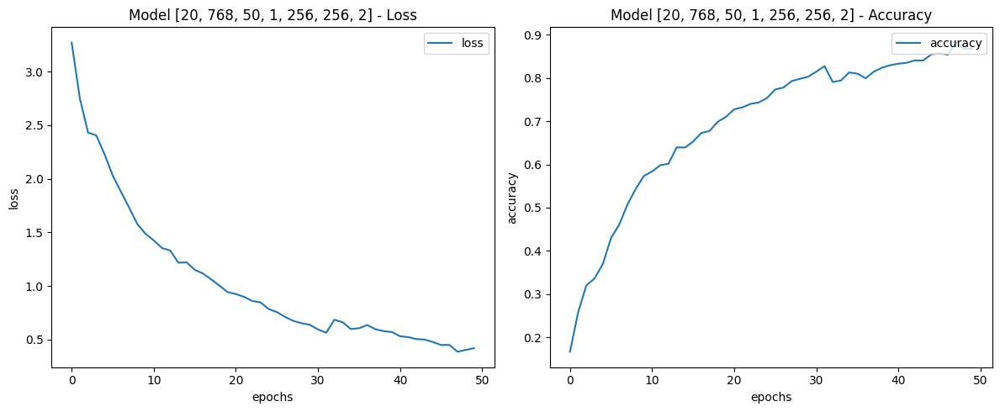

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6534 - loss: 1.4056
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
Testing Transformer Layers.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 2
[20, 768, 50, 2, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_4 (Encoder)                  │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_2               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 50)                  │          12,850 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,531,186 (5.84 MB)

 Trainable params: 1,531,186 (5.84 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0296 - loss: 4.0668
Epoch 1: accuracy improved from -inf to 0.03704, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 24s 10ms/step - accuracy: 0.0296 - loss: 4.0667 - val_accuracy: 0.0150 - val_loss: 3.9400
Epoch 2/50
1322/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0558 - loss: 3.6710
Epoch 2: accuracy improved from 0.03704 to 0.06155, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.0559 - loss: 3.6704 - val_accuracy: 0.0861 - val_loss: 3.2948
Epoch 3/50
1332/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0590 - loss: 3.5530
Epoch 3: accuracy improved from 0.06155 to 0.06268, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 

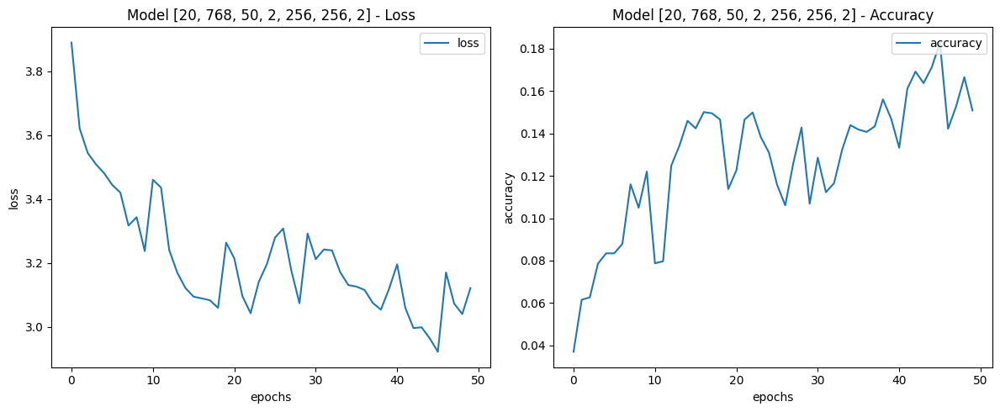

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1734 - loss: 3.7472
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Layers.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 4
[20, 768, 50, 4, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_6 (Encoder)                  │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_7 (Encoder)                  │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_8 (Encoder)                  │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_3               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 50)                  │          12,850 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,847,538 (10.86 MB)

 Trainable params: 2,847,538 (10.86 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.0221 - loss: 4.1307
Epoch 1: accuracy improved from -inf to 0.02226, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 50, 4, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 43s 18ms/step - accuracy: 0.0221 - loss: 4.1306 - val_accuracy: 0.0000e+00 - val_loss: 3.7022
Epoch 2/50
1336/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0314 - loss: 3.8263
Epoch 2: accuracy improved from 0.02226 to 0.02788, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 50, 4, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.0314 - loss: 3.8263 - val_accuracy: 0.0000e+00 - val_loss: 3.8268
Epoch 3/50
1336/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0270 - loss: 3.7647
Epoch 3: accuracy did not improve from 0.02788
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.0270 - loss: 3.7647 - val_accuracy: 0.0838 - val_loss: 3.6266
Epoch 4/50


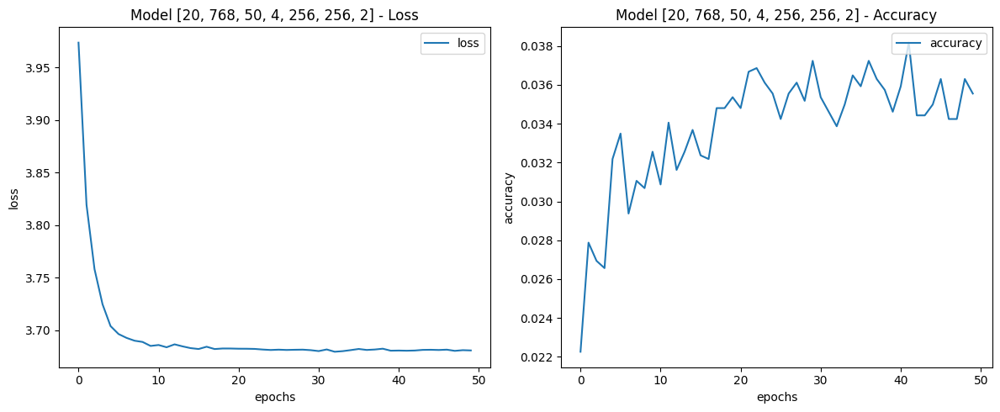

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.0000e+00 - loss: 3.6483
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
Testing Transformer Input.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 256
dong3 256
[20, 768, 50, 2, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_10 (Encoder)                 │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_4               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 50)                  │          12,850 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,531,186 (5.84 MB)

 Trainable params: 1,531,186 (5.84 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.0295 - loss: 4.1047
Epoch 1: accuracy improved from -inf to 0.03255, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 25s 11ms/step - accuracy: 0.0295 - loss: 4.1046 - val_accuracy: 0.0928 - val_loss: 3.4443
Epoch 2/50
1325/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0438 - loss: 3.7912
Epoch 2: accuracy improved from 0.03255 to 0.04284, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.0438 - loss: 3.7909 - val_accuracy: 0.0000e+00 - val_loss: 4.0113
Epoch 3/50
1333/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0434 - loss: 3.7493
Epoch 3: accuracy improved from 0.04284 to 0.04434, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━

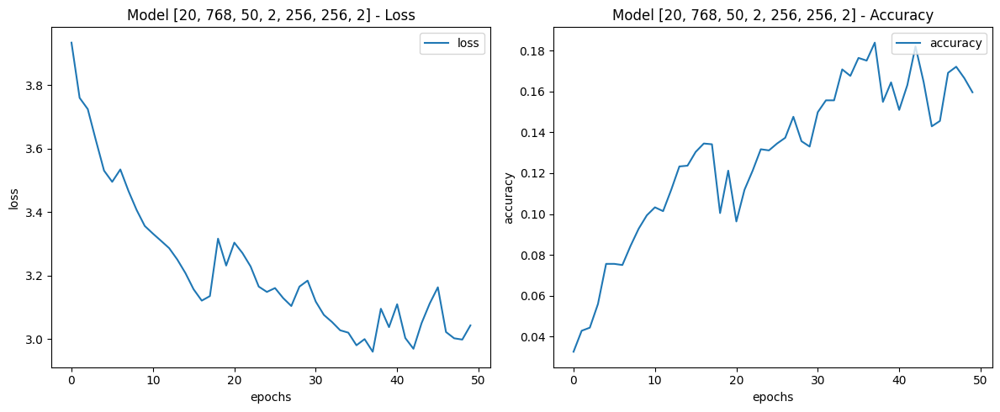

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1294 - loss: 3.2732
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Input.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 256
dong3 512
[20, 768, 50, 2, 512, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 512)             │       2,768,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_12 (Encoder)                 │ (None, 20, 512)             │       2,364,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_5               │ (None, 512)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_18 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_37 (Dense)                     │ (None, 50)                  │          25,650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,158,962 (19.68 MB)

 Trainable params: 5,158,962 (19.68 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.0227 - loss: 4.3300
Epoch 1: accuracy improved from -inf to 0.02844, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 50, 2, 512, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 29s 13ms/step - accuracy: 0.0227 - loss: 4.3298 - val_accuracy: 0.0000e+00 - val_loss: 3.5570
Epoch 2/50
1336/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0303 - loss: 3.8581
Epoch 2: accuracy did not improve from 0.02844
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 24s 5ms/step - accuracy: 0.0303 - loss: 3.8581 - val_accuracy: 0.0000e+00 - val_loss: 3.9797
Epoch 3/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0312 - loss: 3.7851
Epoch 3: accuracy improved from 0.02844 to 0.03162, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 50, 2, 512, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.0312 - loss: 3.7850 - val_accuracy: 0.0000e+00 - val_loss: 3.9919
Epoch 4/5

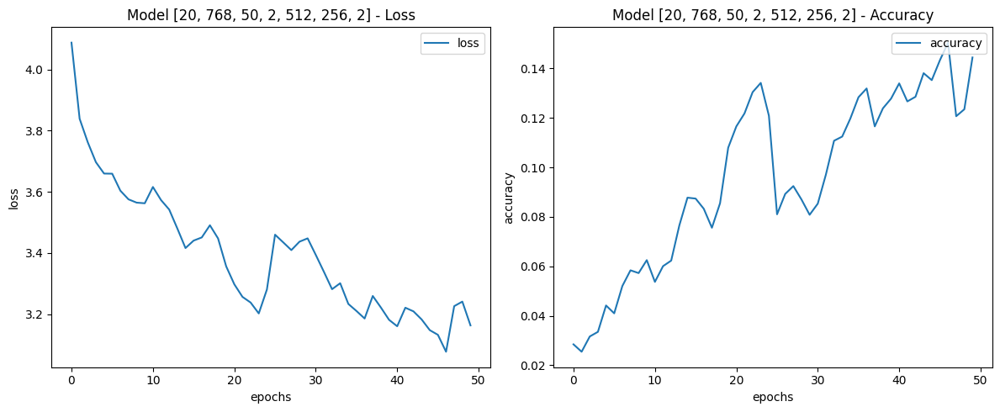

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.0882 - loss: 3.5178
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Internal.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 256
dong3 256
[20, 768, 50, 2, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_25 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_14 (Encoder)                 │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_6               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_21 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_43 (Dense)                     │ (None, 50)                  │          12,850 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,531,186 (5.84 MB)

 Trainable params: 1,531,186 (5.84 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.0388 - loss: 4.0208
Epoch 1: accuracy improved from -inf to 0.04902, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 27s 12ms/step - accuracy: 0.0388 - loss: 4.0206 - val_accuracy: 0.1707 - val_loss: 3.4929
Epoch 2/50
1332/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0499 - loss: 3.7034
Epoch 2: accuracy improved from 0.04902 to 0.05407, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.0499 - loss: 3.7032 - val_accuracy: 0.1385 - val_loss: 3.2593
Epoch 3/50
1333/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0690 - loss: 3.5263
Epoch 3: accuracy improved from 0.05407 to 0.07596, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━

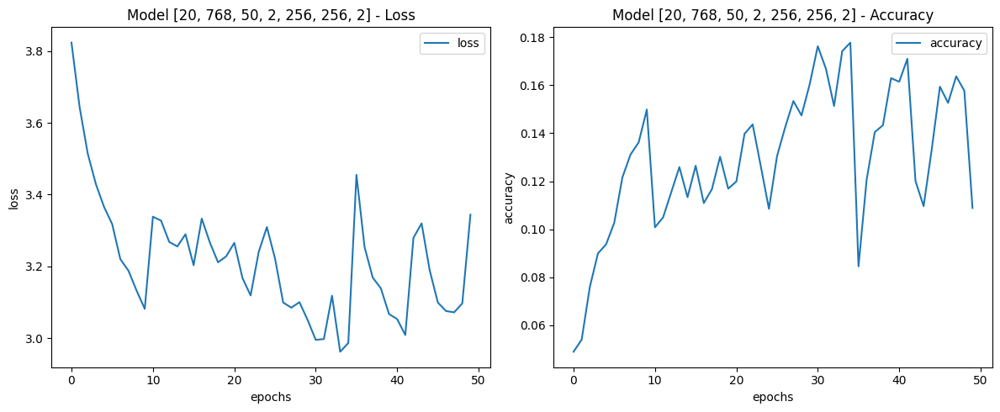

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.0170 - loss: 4.3457
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Internal.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 256
dong3 512
[20, 768, 50, 2, 256, 512, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_29 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         991,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_16 (Encoder)                 │ (None, 20, 256)             │         789,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_7               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_24 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_49 (Dense)                     │ (None, 50)                  │          12,850 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,793,842 (6.84 MB)

 Trainable params: 1,793,842 (6.84 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.0352 - loss: 4.0997
Epoch 1: accuracy improved from -inf to 0.03536, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 50, 2, 256, 512, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 27s 12ms/step - accuracy: 0.0352 - loss: 4.0996 - val_accuracy: 0.1639 - val_loss: 3.4457
Epoch 2/50
1334/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0450 - loss: 3.7078
Epoch 2: accuracy improved from 0.03536 to 0.04191, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 50, 2, 256, 512, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 26s 5ms/step - accuracy: 0.0450 - loss: 3.7078 - val_accuracy: 0.0045 - val_loss: 3.9432
Epoch 3/50
1335/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0457 - loss: 3.6044
Epoch 3: accuracy improved from 0.04191 to 0.05108, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 50, 2, 256, 512, 2].keras
1337/1337 ━━━━━━━━━━━━━━

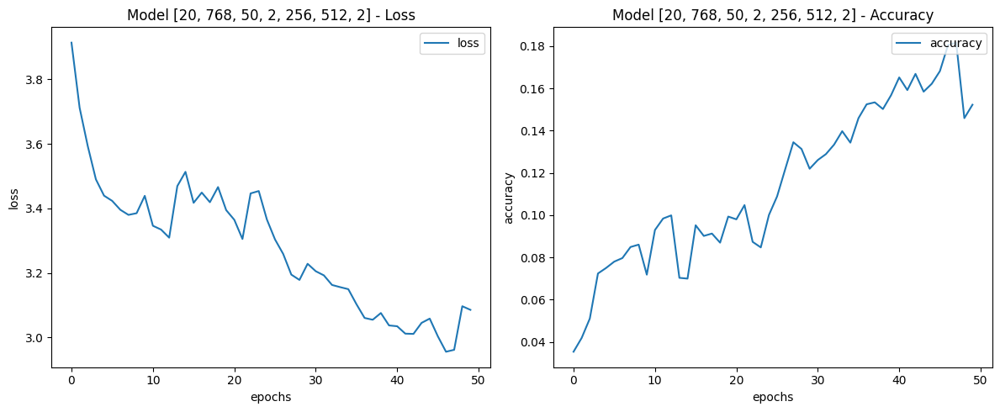

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1876 - loss: 2.8872
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Attention.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 1
[20, 768, 50, 2, 256, 256, 1]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_33 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         597,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_18 (Encoder)                 │ (None, 20, 256)             │         395,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_8               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_27 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_55 (Dense)                     │ (None, 50)                  │          12,850 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,005,362 (3.84 MB)

 Trainable params: 1,005,362 (3.84 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0527 - loss: 3.9638
Epoch 1: accuracy improved from -inf to 0.07297, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 50, 2, 256, 256, 1].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 26s 11ms/step - accuracy: 0.0527 - loss: 3.9636 - val_accuracy: 0.3278 - val_loss: 2.8473
Epoch 2/50
1333/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0964 - loss: 3.3608
Epoch 2: accuracy improved from 0.07297 to 0.10589, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 50, 2, 256, 256, 1].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 28s 5ms/step - accuracy: 0.0964 - loss: 3.3607 - val_accuracy: 0.2133 - val_loss: 3.0025
Epoch 3/50
1327/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1278 - loss: 3.2246
Epoch 3: accuracy improved from 0.10589 to 0.12367, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 50, 2, 256, 256, 1].keras
1337/1337 ━━━━━━━━━━━

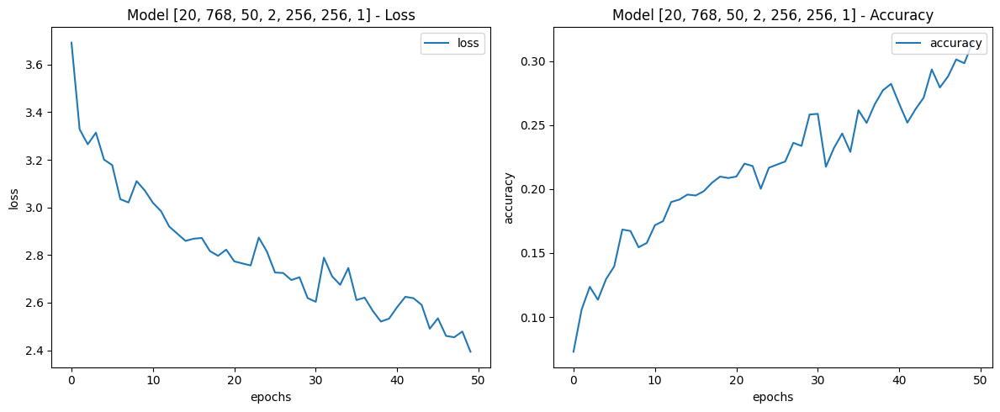

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4623 - loss: 2.0216
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Attention.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 2
[20, 768, 50, 2, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_37 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_20 (Encoder)                 │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_9               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_30 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_61 (Dense)                     │ (None, 50)                  │          12,850 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,531,186 (5.84 MB)

 Trainable params: 1,531,186 (5.84 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.0457 - loss: 4.0221
Epoch 1: accuracy improved from -inf to 0.05482, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 28s 13ms/step - accuracy: 0.0457 - loss: 4.0220 - val_accuracy: 0.1572 - val_loss: 3.4529
Epoch 2/50
1329/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0596 - loss: 3.6543
Epoch 2: accuracy improved from 0.05482 to 0.06417, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 25s 5ms/step - accuracy: 0.0596 - loss: 3.6541 - val_accuracy: 0.0419 - val_loss: 3.6556
Epoch 3/50
1333/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0757 - loss: 3.5228
Epoch 3: accuracy improved from 0.06417 to 0.08101, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━

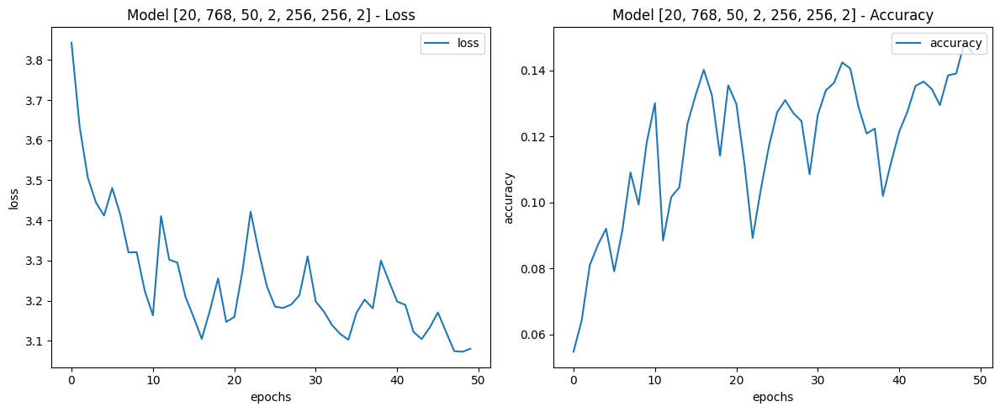

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.0432 - loss: 3.8894
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Attention.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 4
[20, 768, 50, 2, 256, 256, 4]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_41 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │       1,385,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_22 (Encoder)                 │ (None, 20, 256)             │       1,184,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_10              │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_33 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_67 (Dense)                     │ (None, 50)                  │          12,850 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,582,834 (9.85 MB)

 Trainable params: 2,582,834 (9.85 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.0328 - loss: 4.1103
Epoch 1: accuracy improved from -inf to 0.03068, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 50, 2, 256, 256, 4].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 28s 13ms/step - accuracy: 0.0328 - loss: 4.1102 - val_accuracy: 0.0000e+00 - val_loss: 3.9180
Epoch 2/50
1326/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0232 - loss: 3.8381
Epoch 2: accuracy did not improve from 0.03068
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.0232 - loss: 3.8379 - val_accuracy: 0.0000e+00 - val_loss: 3.7010
Epoch 3/50
1333/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0318 - loss: 3.7439
Epoch 3: accuracy did not improve from 0.03068
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0318 - loss: 3.7439 - val_accuracy: 0.1100 - val_loss: 3.4317
Epoch 4/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0360 - loss: 3.7131
Epoch 4: accuracy improved from

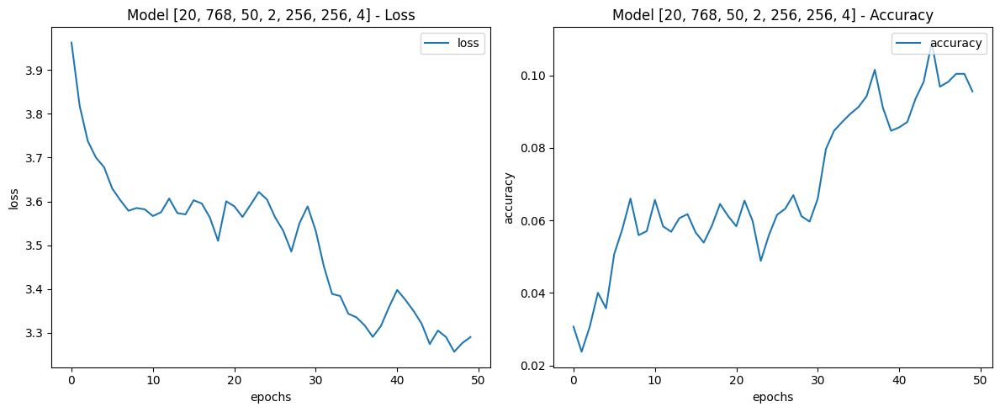

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1599 - loss: 3.2127
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


In [ ]:
import os
import time
import json
import psutil
import numpy as np

MODELS = {'Transformer': Transformer_Model}

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test(features, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel(features, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'Models/{model_test}')
        np.save(f'Predictions/{model_test}', predictions)

    del predictions
    return history

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features1']))
labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels']))
(_,sequence_length, image_size) = features.shape
print(f"Features: {features.shape}")

for model_type in config['Tests2']:
    for test in config['Tests2'][model_type]:
        for val in config['Tests2'][model_type][test]:
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            print('dong1', defaults)

            store_val = defaults[test]
            print('dong2', store_val)

            defaults[test] = val
            print('dong3', defaults[test])

            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print(args)

            model = MODELS[model_type](*args)

            history = run_test(features, labels, model, model_type, test, val, model_type, test, args) #end_time, mem,
            defaults[test] = store_val

            del model


# **Test Model Đề xuất**

core

Features: (6681, 20, 768)
Testing Transformer_FeatureResnet_Dense Layers.....
args:  [20, 768, 50, 1, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 20, 2048)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 20, 2048)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 20, 512)        │              0 │ transformer[0][0],     │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d      │ (None, 512)            │              0 │ concatenate[0][0]      │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 512)            │              0 │ global_max_pooling1d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 50)             │         25,650 │ dropout[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,194 (2.10 MB)

 Trainable params: 550,194 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3438 - loss: 5.3303
Epoch 1: accuracy improved from -inf to 0.47409, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 50, 1, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 24s 11ms/step - accuracy: 0.3439 - loss: 5.3291 - val_accuracy: 0.8196 - val_loss: 0.7896
Epoch 2/50
1327/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7070 - loss: 1.5801
Epoch 2: accuracy improved from 0.47409 to 0.71768, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 50, 1, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.7071 - loss: 1.5801 - val_accuracy: 0.7942 - val_loss: 1.1026
Epoch 3/50
1333/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7835 - loss: 1.2735
Epoch 3: accuracy improved from 0.71768 to 0.77717, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 76

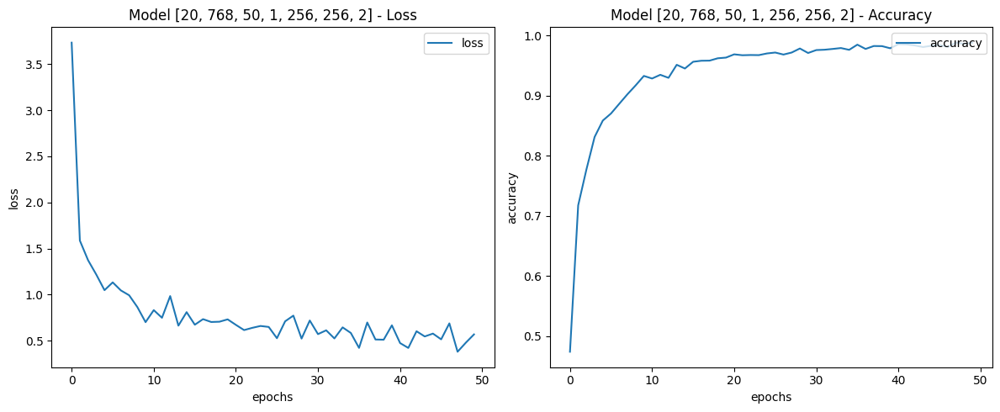

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9990 - loss: 0.0048
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Testing Transformer_FeatureResnet_Dense Layers.....
args:  [20, 768, 50, 2, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 20, 2048)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 20, 2048)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_5[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_1    │ (None, 512)            │              0 │ concatenate_1[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_12 (Dense)          │ (None, 50)             │         25,650 │ dropout_2[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,194 (2.10 MB)

 Trainable params: 550,194 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.3508 - loss: 5.4260
Epoch 1: accuracy improved from -inf to 0.47184, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 32s 15ms/step - accuracy: 0.3509 - loss: 5.4249 - val_accuracy: 0.7485 - val_loss: 1.5029
Epoch 2/50
1336/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7381 - loss: 1.3222
Epoch 2: accuracy improved from 0.47184 to 0.73096, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 24s 5ms/step - accuracy: 0.7381 - loss: 1.3224 - val_accuracy: 0.7725 - val_loss: 1.4499
Epoch 3/50
1328/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7754 - loss: 1.3098
Epoch 3: accuracy improved from 0.73096 to 0.77456, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 7

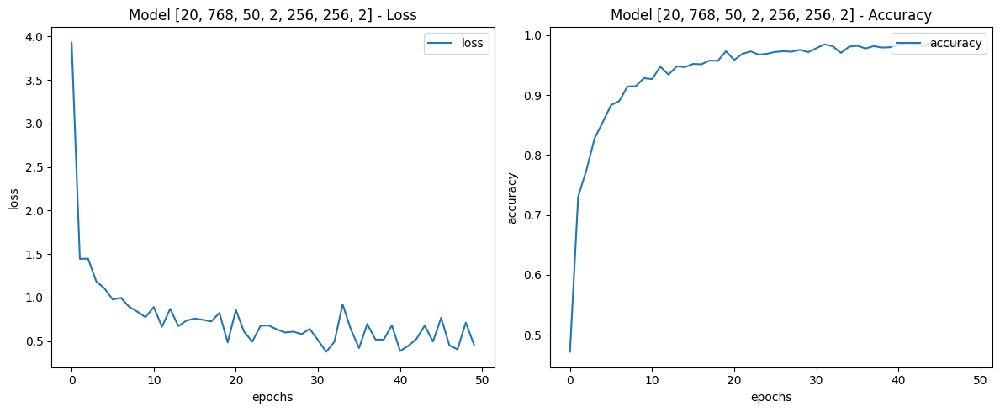

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9941 - loss: 0.2139
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer_FeatureResnet_Dense Layers.....
args:  [20, 768, 50, 4, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 20, 2048)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 20, 2048)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer3 (Functional) │ (None, 20, 256)        │              0 │ transformer2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer4 (Functional) │ (None, 20, 256)        │              0 │ transformer3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_13 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 20, 512)        │              0 │ transformer4[0][0],    │
│ (Concatenate)             │                        │                │ dense_13[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_2    │ (None, 512)            │              0 │ concatenate_2[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_5 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_26 (Dense)          │ (None, 50)             │         25,650 │ dropout_5[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,194 (2.10 MB)

 Trainable params: 550,194 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.3510 - loss: 5.3161
Epoch 1: accuracy improved from -inf to 0.46922, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 50, 4, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 56s 24ms/step - accuracy: 0.3510 - loss: 5.3150 - val_accuracy: 0.7972 - val_loss: 0.9132
Epoch 2/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7264 - loss: 1.4079
Epoch 2: accuracy improved from 0.46922 to 0.72666, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 50, 4, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - accuracy: 0.7264 - loss: 1.4080 - val_accuracy: 0.8578 - val_loss: 0.6376
Epoch 3/50
1334/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7847 - loss: 1.2299
Epoch 3: accuracy improved from 0.72666 to 0.78148, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20,

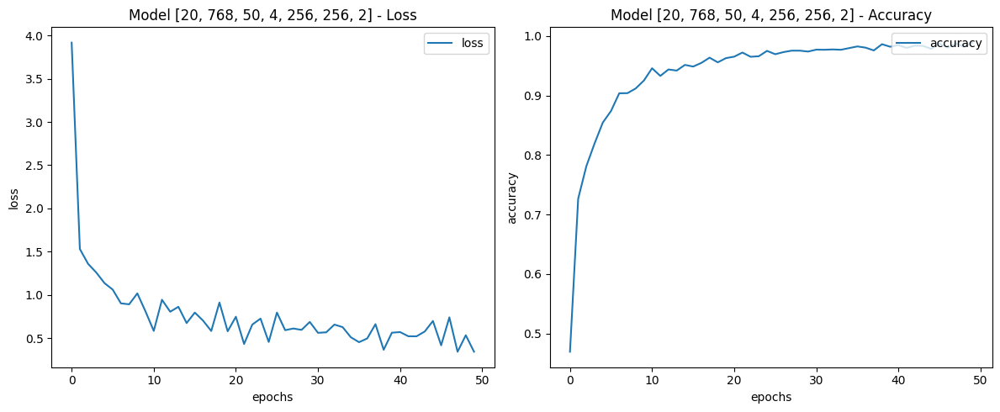

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9977 - loss: 0.0167
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
Testing Transformer_FeatureResnet_Dense Input.....
args:  [20, 768, 50, 2, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 20, 2048)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 20, 2048)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_27 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_3             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_27[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_3    │ (None, 512)            │              0 │ concatenate_3[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_10 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_34 (Dense)          │ (None, 50)             │         25,650 │ dropout_10[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,194 (2.10 MB)

 Trainable params: 550,194 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.3538 - loss: 5.2905
Epoch 1: accuracy improved from -inf to 0.48812, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 30s 13ms/step - accuracy: 0.3539 - loss: 5.2893 - val_accuracy: 0.7425 - val_loss: 1.1841
Epoch 2/50
1329/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7205 - loss: 1.5198
Epoch 2: accuracy improved from 0.48812 to 0.71918, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.7205 - loss: 1.5202 - val_accuracy: 0.7672 - val_loss: 1.3920
Epoch 3/50
1334/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7999 - loss: 1.2625
Epoch 3: accuracy improved from 0.71918 to 0.78578, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768, 

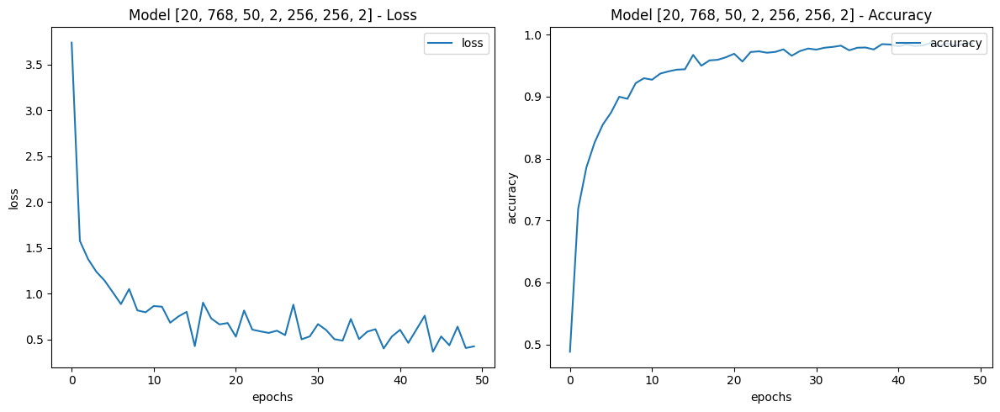

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9814 - loss: 0.5477
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
Testing Transformer_FeatureResnet_Dense Input.....
args:  [20, 768, 50, 2, 512, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 20, 2048)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 20, 2048)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 512)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 512)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_35 (Dense)          │ (None, 20, 512)        │      1,049,088 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_4             │ (None, 20, 1024)       │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_35[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_4    │ (None, 1024)           │              0 │ concatenate_4[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_13 (Dropout)      │ (None, 1024)           │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_42 (Dense)          │ (None, 50)             │         51,250 │ dropout_13[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,100,338 (4.20 MB)

 Trainable params: 1,100,338 (4.20 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.3594 - loss: 7.1787
Epoch 1: accuracy improved from -inf to 0.47203, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768, 50, 2, 512, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 39s 19ms/step - accuracy: 0.3595 - loss: 7.1773 - val_accuracy: 0.7335 - val_loss: 1.6192
Epoch 2/50
1335/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6986 - loss: 2.5125
Epoch 2: accuracy improved from 0.47203 to 0.69729, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768, 50, 2, 512, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.6986 - loss: 2.5127 - val_accuracy: 0.7530 - val_loss: 1.9395
Epoch 3/50
1334/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7612 - loss: 2.2098
Epoch 3: accuracy improved from 0.69729 to 0.74911, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768

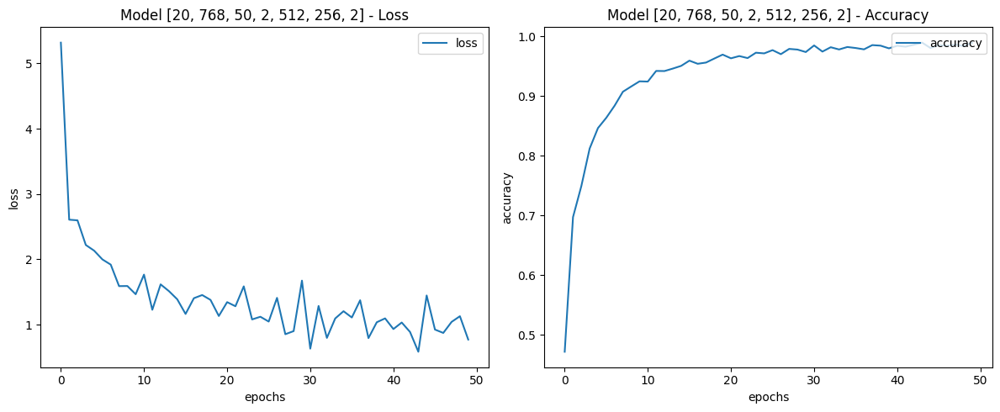

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9992 - loss: 0.0605
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer_FeatureResnet_Dense Internal.....
args:  [20, 768, 50, 2, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 20, 2048)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 20, 2048)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_43 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_5             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_43[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_5    │ (None, 512)            │              0 │ concatenate_5[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_16 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_50 (Dense)          │ (None, 50)             │         25,650 │ dropout_16[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,194 (2.10 MB)

 Trainable params: 550,194 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.3398 - loss: 5.2994
Epoch 1: accuracy improved from -inf to 0.46997, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 32s 15ms/step - accuracy: 0.3399 - loss: 5.2982 - val_accuracy: 0.8069 - val_loss: 0.8861
Epoch 2/50
1330/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7173 - loss: 1.4884
Epoch 2: accuracy improved from 0.46997 to 0.72797, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 25s 6ms/step - accuracy: 0.7174 - loss: 1.4889 - val_accuracy: 0.7418 - val_loss: 1.9831
Epoch 3/50
1329/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7916 - loss: 1.2032
Epoch 3: accuracy improved from 0.72797 to 0.79008, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_

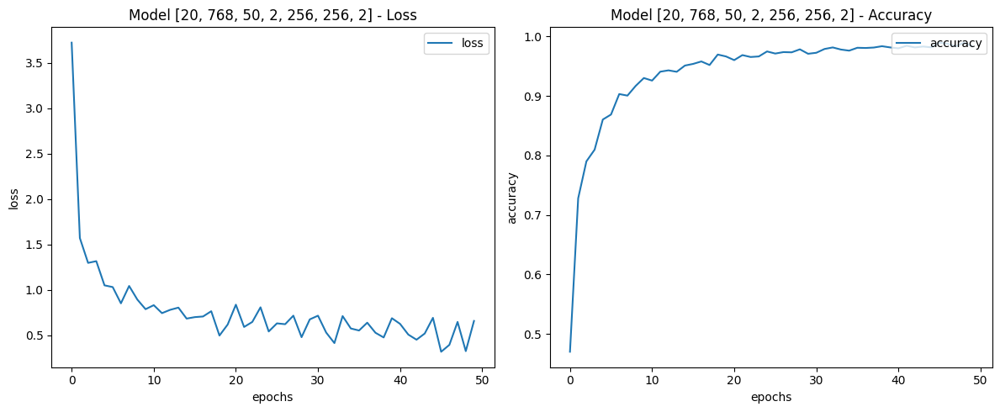

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9991 - loss: 0.0128
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer_FeatureResnet_Dense Internal.....
args:  [20, 768, 50, 2, 256, 512, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 20, 2048)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 20, 2048)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_51 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_6             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_51[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_6    │ (None, 512)            │              0 │ concatenate_6[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_19 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_58 (Dense)          │ (None, 50)             │         25,650 │ dropout_19[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,194 (2.10 MB)

 Trainable params: 550,194 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.3647 - loss: 5.2438
Epoch 1: accuracy improved from -inf to 0.48064, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[20, 768, 50, 2, 256, 512, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 32s 15ms/step - accuracy: 0.3648 - loss: 5.2428 - val_accuracy: 0.7672 - val_loss: 1.0338
Epoch 2/50
1326/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7254 - loss: 1.4257
Epoch 2: accuracy improved from 0.48064 to 0.73040, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[20, 768, 50, 2, 256, 512, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.7254 - loss: 1.4262 - val_accuracy: 0.8181 - val_loss: 0.9417
Epoch 3/50
1335/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8132 - loss: 1.0285
Epoch 3: accuracy improved from 0.73040 to 0.79326, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_

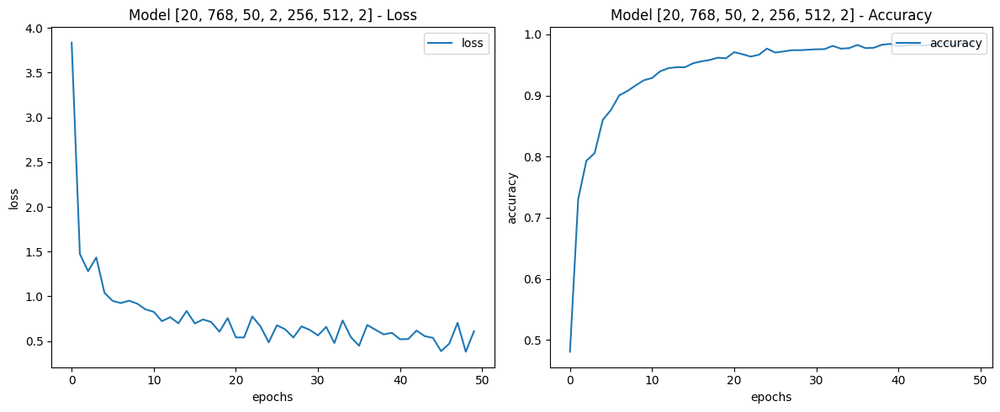

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9968 - loss: 0.0678
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer_FeatureResnet_Dense Attention.....
args:  [20, 768, 50, 2, 256, 256, 1]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 20, 2048)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 20, 2048)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_59 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_7             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_59[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_7    │ (None, 512)            │              0 │ concatenate_7[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_22 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_66 (Dense)          │ (None, 50)             │         25,650 │ dropout_22[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,194 (2.10 MB)

 Trainable params: 550,194 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.3454 - loss: 5.4347
Epoch 1: accuracy improved from -inf to 0.47297, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 50, 2, 256, 256, 1].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 30s 13ms/step - accuracy: 0.3455 - loss: 5.4336 - val_accuracy: 0.8376 - val_loss: 0.7232
Epoch 2/50
1335/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7158 - loss: 1.5596
Epoch 2: accuracy improved from 0.47297 to 0.73078, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 50, 2, 256, 256, 1].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.7158 - loss: 1.5594 - val_accuracy: 0.8181 - val_loss: 0.9740
Epoch 3/50
1336/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7658 - loss: 1.3767
Epoch 3: accuracy improved from 0.73078 to 0.76988, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attentio

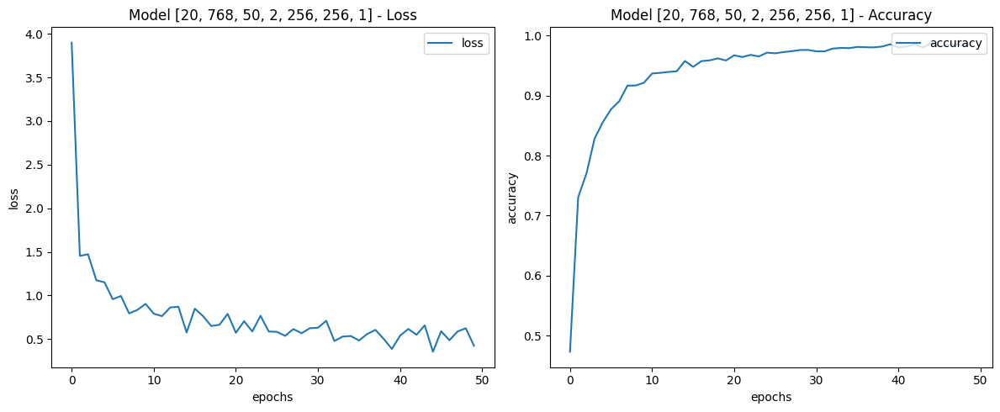

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9867 - loss: 0.3578
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer_FeatureResnet_Dense Attention.....
args:  [20, 768, 50, 2, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 20, 2048)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 20, 2048)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_67 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_8             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_67[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_8    │ (None, 512)            │              0 │ concatenate_8[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_25 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_74 (Dense)          │ (None, 50)             │         25,650 │ dropout_25[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,194 (2.10 MB)

 Trainable params: 550,194 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.3564 - loss: 5.3119
Epoch 1: accuracy improved from -inf to 0.47596, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 30s 13ms/step - accuracy: 0.3564 - loss: 5.3108 - val_accuracy: 0.6991 - val_loss: 1.4800
Epoch 2/50
1330/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7349 - loss: 1.4787
Epoch 2: accuracy improved from 0.47596 to 0.72442, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.7348 - loss: 1.4793 - val_accuracy: 0.7710 - val_loss: 1.3751
Epoch 3/50
1333/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7800 - loss: 1.2246
Epoch 3: accuracy improved from 0.72442 to 0.78466, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attentio

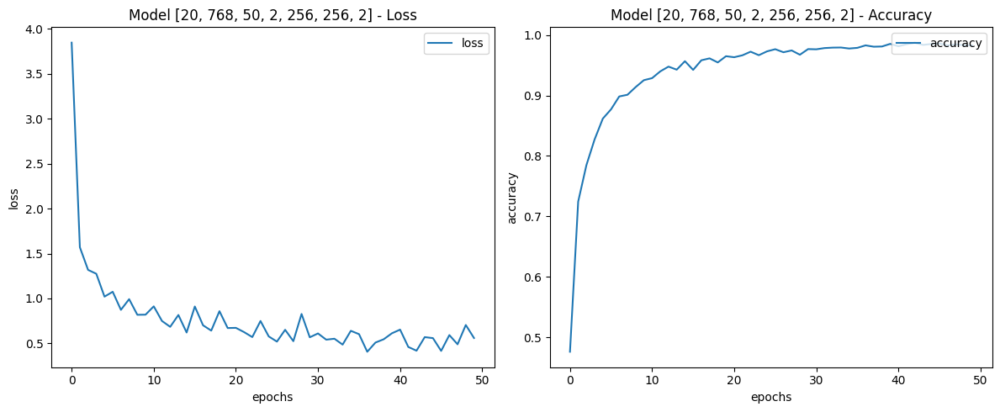

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9955 - loss: 0.1555
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer_FeatureResnet_Dense Attention.....
args:  [20, 768, 50, 2, 256, 256, 4]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 20, 2048)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 20, 2048)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_75 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_9             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_75[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_9    │ (None, 512)            │              0 │ concatenate_9[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_28 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_82 (Dense)          │ (None, 50)             │         25,650 │ dropout_28[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,194 (2.10 MB)

 Trainable params: 550,194 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.3458 - loss: 5.3391
Epoch 1: accuracy improved from -inf to 0.47858, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 50, 2, 256, 256, 4].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 33s 15ms/step - accuracy: 0.3459 - loss: 5.3379 - val_accuracy: 0.6961 - val_loss: 1.7988
Epoch 2/50
1335/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7235 - loss: 1.4598
Epoch 2: accuracy improved from 0.47858 to 0.71282, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 50, 2, 256, 256, 4].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.7235 - loss: 1.4602 - val_accuracy: 0.8451 - val_loss: 0.6673
Epoch 3/50
1331/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7912 - loss: 1.2393
Epoch 3: accuracy improved from 0.71282 to 0.78672, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attent

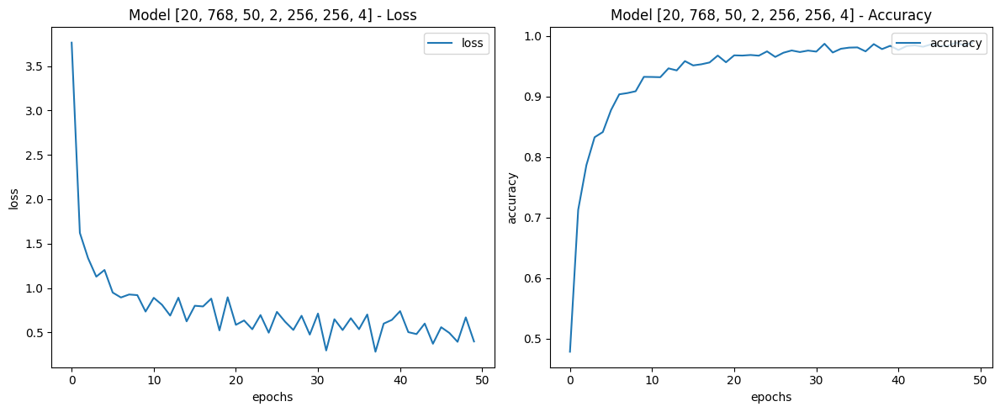

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9941 - loss: 0.0909
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step


In [ ]:
import os
import time
import json
import psutil
import numpy as np

# MODELS = {'LSTM': LSTM_Model, 'Transformer': Transformer_Model}
MODELS = {'Transformer_FeatureResnet_Dense': Transformer_FeatureResnet_Dense
          }

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test_2feat(features, features2, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel2(features, features2, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'/content/drive/MyDrive/model_save2/{model_test}')
        np.save(f'/content/drive/MyDrive/np_save2/{model_test}', predictions)

    del predictions

    return history

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features1']))
features2 = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features2'])) #2 hoặc 4

labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels']))
(_,sequence_length, image_size) = features.shape

print(f"Features: {features.shape}")

for model_type in config['Tests3']: # ban đầu là 'Tests3'
    for test in config['Tests3'][model_type]: # ban đầu là 'Tests3'
        for val in config['Tests3'][model_type][test]: # ban đầu là 'Tests3'
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            store_val = defaults[test]
            defaults[test] = val
            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print('args: ', args)

            model = MODELS[model_type](*args)

            history = run_test_2feat(features, features2, labels, model, model_type, test, val, model_type, test, arg = args)
            defaults[test] = store_val

            del model



# **Test Model đề xuất kiểm chứng**

Features: (6681, 20, 768)
Testing Transformer_Dense_FeatureResnet Layers.....
args:  [20, 768, 50, 1, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 50)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 50)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d      │ (None, 256)            │              0 │ transformer[0][0]      │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 256)            │              0 │ global_max_pooling1d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 50)             │         12,850 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_1             │ (None, 50)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 100)            │              0 │ dense_3[0][0],         │
│                           │                        │                │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 50)             │          5,050 │ concatenate[0][0]      │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 878,060 (3.35 MB)

 Trainable params: 878,060 (3.35 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0466 - loss: 3.7947
Epoch 1: accuracy improved from -inf to 0.05725, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 50, 1, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 24s 10ms/step - accuracy: 0.0466 - loss: 3.7947 - val_accuracy: 0.0606 - val_loss: 3.5763
Epoch 2/50
1333/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0864 - loss: 3.5817
Epoch 2: accuracy improved from 0.05725 to 0.09467, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 50, 1, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.0864 - loss: 3.5816 - val_accuracy: 0.1504 - val_loss: 3.4585
Epoch 3/50
1336/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1273 - loss: 3.4863
Epoch 3: accuracy improved from 0.09467 to 0.13508, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 76

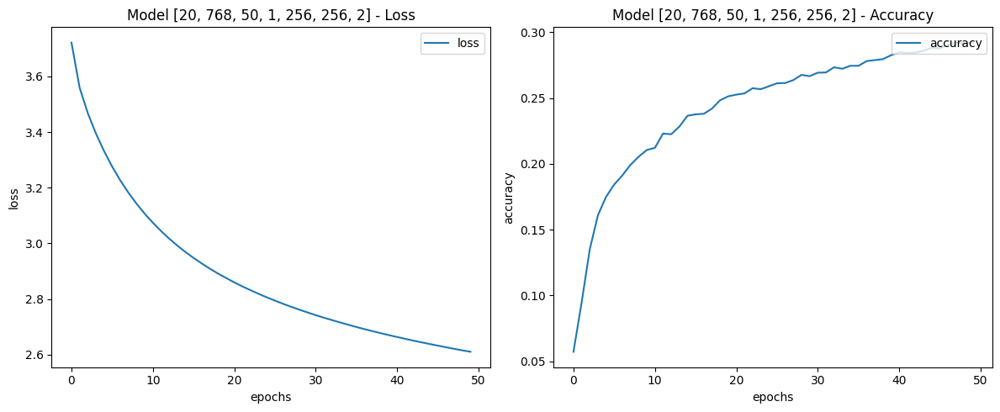

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3467 - loss: 2.4772
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Testing Transformer_Dense_FeatureResnet Layers.....
args:  [20, 768, 50, 2, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 50)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 50)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_1    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_11 (Dense)          │ (None, 50)             │         12,850 │ dropout_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_5             │ (None, 50)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 100)            │              0 │ dense_11[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_12 (Dense)          │ (None, 50)             │          5,050 │ concatenate_1[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,607,148 (6.13 MB)

 Trainable params: 1,607,148 (6.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.0483 - loss: 3.7966
Epoch 1: accuracy improved from -inf to 0.05650, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 28s 13ms/step - accuracy: 0.0484 - loss: 3.7965 - val_accuracy: 0.0599 - val_loss: 3.5727
Epoch 2/50
1336/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0878 - loss: 3.5805
Epoch 2: accuracy improved from 0.05650 to 0.09242, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.0878 - loss: 3.5805 - val_accuracy: 0.1542 - val_loss: 3.4599
Epoch 3/50
1335/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1359 - loss: 3.4833
Epoch 3: accuracy improved from 0.09242 to 0.14425, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 76

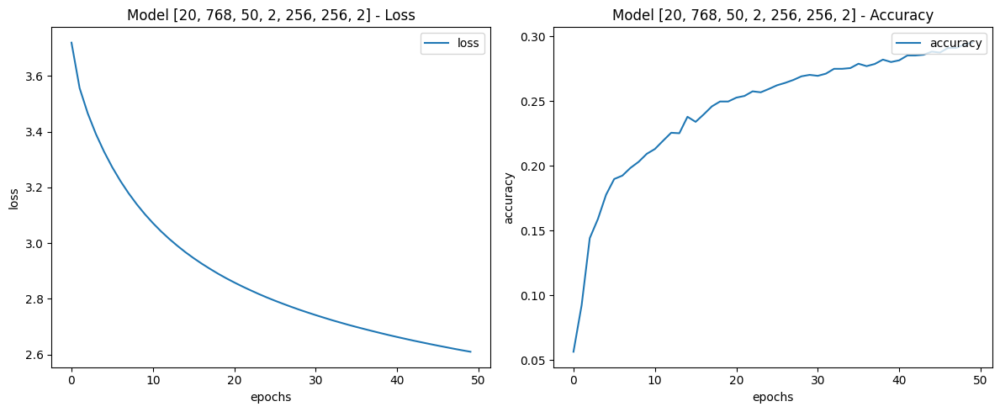

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3521 - loss: 2.4728
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
Testing Transformer_Dense_FeatureResnet Layers.....
args:  [20, 768, 50, 4, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 50)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 50)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_10[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer3 (Functional) │ (None, 20, 256)        │        729,088 │ transformer2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer4 (Functional) │ (None, 20, 256)        │        729,088 │ transformer3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_2    │ (None, 256)            │              0 │ transformer4[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_9 (Dropout)       │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_25 (Dense)          │ (None, 50)             │         12,850 │ dropout_9[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_11            │ (None, 50)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 100)            │              0 │ dense_25[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_11[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_26 (Dense)          │ (None, 50)             │          5,050 │ concatenate_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 3,065,324 (11.69 MB)

 Trainable params: 3,065,324 (11.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.0416 - loss: 3.7845
Epoch 1: accuracy improved from -inf to 0.04883, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 50, 4, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 50s 21ms/step - accuracy: 0.0416 - loss: 3.7845 - val_accuracy: 0.0801 - val_loss: 3.5600
Epoch 2/50
1335/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0881 - loss: 3.5787
Epoch 2: accuracy improved from 0.04883 to 0.09448, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 50, 4, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.0882 - loss: 3.5786 - val_accuracy: 0.1385 - val_loss: 3.4569
Epoch 3/50
1336/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1446 - loss: 3.4841
Epoch 3: accuracy improved from 0.09448 to 0.14855, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 

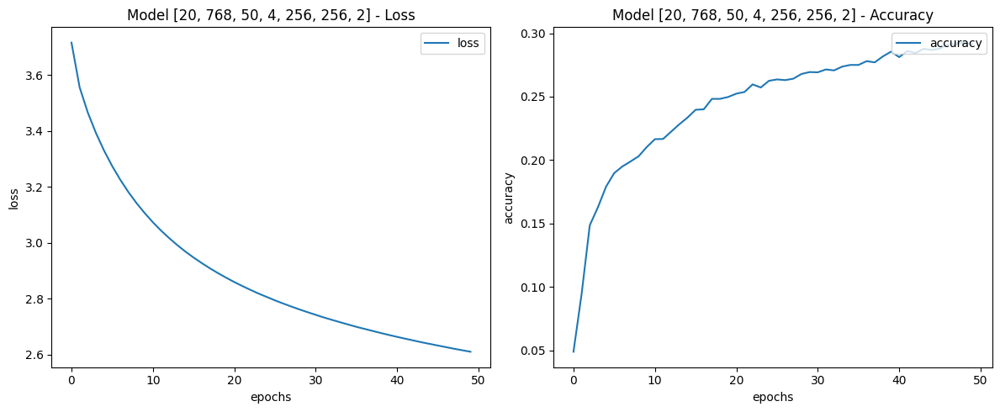

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3469 - loss: 2.4681
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
Testing Transformer_Dense_FeatureResnet Input.....
args:  [20, 768, 50, 2, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 50)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 50)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_20            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_20[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_3    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_12 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_33 (Dense)          │ (None, 50)             │         12,850 │ dropout_12[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_21            │ (None, 50)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_3             │ (None, 100)            │              0 │ dense_33[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_21[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_34 (Dense)          │ (None, 50)             │          5,050 │ concatenate_3[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,607,148 (6.13 MB)

 Trainable params: 1,607,148 (6.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.0450 - loss: 3.7961
Epoch 1: accuracy improved from -inf to 0.05220, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 29s 13ms/step - accuracy: 0.0450 - loss: 3.7961 - val_accuracy: 0.0397 - val_loss: 3.6173
Epoch 2/50
1325/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0867 - loss: 3.5809
Epoch 2: accuracy improved from 0.05220 to 0.09766, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.0868 - loss: 3.5807 - val_accuracy: 0.1272 - val_loss: 3.4752
Epoch 3/50
1326/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1387 - loss: 3.4869
Epoch 3: accuracy improved from 0.09766 to 0.14593, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 

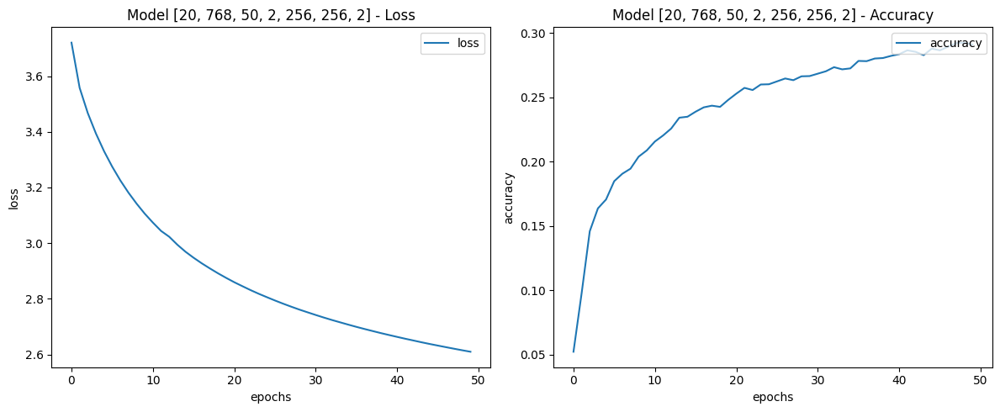

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3440 - loss: 2.4815
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Testing Transformer_Dense_FeatureResnet Input.....
args:  [20, 768, 50, 2, 512, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 50)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 50)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_26            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 512)        │      2,768,640 │ input_layer_26[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 512)        │      2,637,568 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_4    │ (None, 512)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_15 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_41 (Dense)          │ (None, 50)             │         25,650 │ dropout_15[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_27            │ (None, 50)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_4             │ (None, 100)            │              0 │ dense_41[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_27[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_42 (Dense)          │ (None, 50)             │          5,050 │ concatenate_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 5,436,908 (20.74 MB)

 Trainable params: 5,436,908 (20.74 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.0418 - loss: 3.8014
Epoch 1: accuracy improved from -inf to 0.05949, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 50, 2, 512, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 38s 19ms/step - accuracy: 0.0418 - loss: 3.8013 - val_accuracy: 0.0906 - val_loss: 3.5803
Epoch 2/50
1336/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1100 - loss: 3.5842
Epoch 2: accuracy improved from 0.05949 to 0.11955, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 50, 2, 512, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - accuracy: 0.1100 - loss: 3.5842 - val_accuracy: 0.1415 - val_loss: 3.4701
Epoch 3/50
1328/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1194 - loss: 3.4884
Epoch 3: accuracy improved from 0.11955 to 0.13059, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768

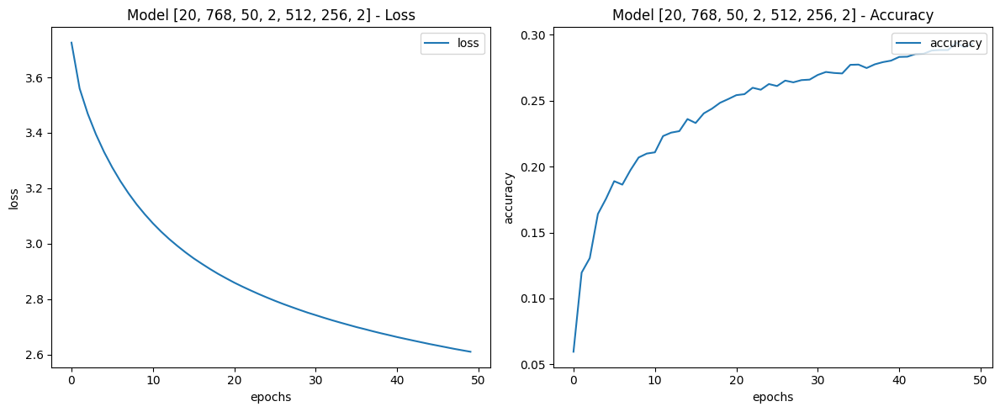

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3507 - loss: 2.4719
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Testing Transformer_Dense_FeatureResnet Internal.....
args:  [20, 768, 50, 2, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 50)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 50)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_32            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_32[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_5    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_18 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_49 (Dense)          │ (None, 50)             │         12,850 │ dropout_18[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_33            │ (None, 50)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_5             │ (None, 100)            │              0 │ dense_49[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_33[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_50 (Dense)          │ (None, 50)             │          5,050 │ concatenate_5[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,607,148 (6.13 MB)

 Trainable params: 1,607,148 (6.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.0470 - loss: 3.7944
Epoch 1: accuracy improved from -inf to 0.06417, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 28s 13ms/step - accuracy: 0.0470 - loss: 3.7944 - val_accuracy: 0.1235 - val_loss: 3.5744
Epoch 2/50
1336/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0883 - loss: 3.5835
Epoch 2: accuracy improved from 0.06417 to 0.09429, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.0883 - loss: 3.5834 - val_accuracy: 0.1287 - val_loss: 3.4614
Epoch 3/50
1326/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1245 - loss: 3.4883
Epoch 3: accuracy improved from 0.09429 to 0.13527, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[

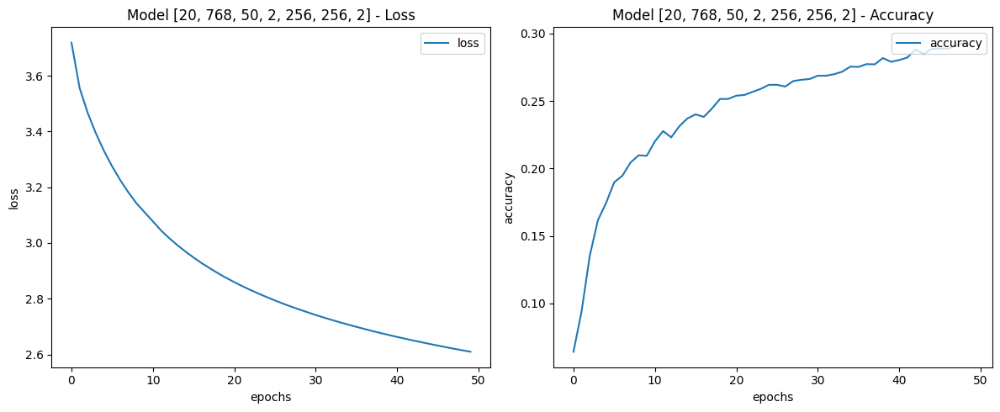

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3408 - loss: 2.4847
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer_Dense_FeatureResnet Internal.....
args:  [20, 768, 50, 2, 256, 512, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 50)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 50)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_38            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        991,488 │ input_layer_38[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        860,416 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_6    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_21 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_57 (Dense)          │ (None, 50)             │         12,850 │ dropout_21[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_39            │ (None, 50)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_6             │ (None, 100)            │              0 │ dense_57[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_39[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_58 (Dense)          │ (None, 50)             │          5,050 │ concatenate_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,869,804 (7.13 MB)

 Trainable params: 1,869,804 (7.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.0448 - loss: 3.7964
Epoch 1: accuracy improved from -inf to 0.06099, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[20, 768, 50, 2, 256, 512, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 31s 14ms/step - accuracy: 0.0448 - loss: 3.7964 - val_accuracy: 0.0412 - val_loss: 3.5955
Epoch 2/50
1327/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0937 - loss: 3.5866
Epoch 2: accuracy improved from 0.06099 to 0.10533, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[20, 768, 50, 2, 256, 512, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.0938 - loss: 3.5863 - val_accuracy: 0.1317 - val_loss: 3.4713
Epoch 3/50
1330/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1470 - loss: 3.4859
Epoch 3: accuracy improved from 0.10533 to 0.14537, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_

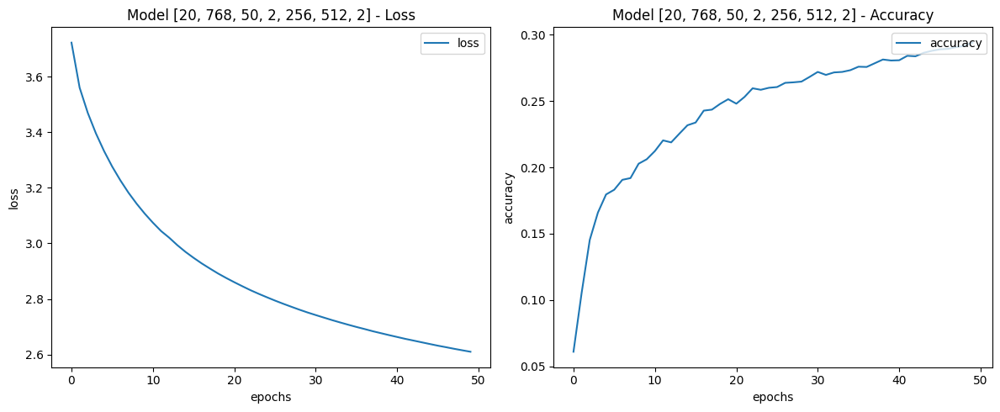

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3492 - loss: 2.4781
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Testing Transformer_Dense_FeatureResnet Attention.....
args:  [20, 768, 50, 2, 256, 256, 1]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 50)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 50)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_44            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        597,248 │ input_layer_44[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        466,176 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_7    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_24 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_65 (Dense)          │ (None, 50)             │         12,850 │ dropout_24[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_45            │ (None, 50)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_7             │ (None, 100)            │              0 │ dense_65[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_45[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_66 (Dense)          │ (None, 50)             │          5,050 │ concatenate_7[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,081,324 (4.12 MB)

 Trainable params: 1,081,324 (4.12 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.0433 - loss: 3.7913
Epoch 1: accuracy improved from -inf to 0.06080, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 50, 2, 256, 256, 1].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 30s 13ms/step - accuracy: 0.0433 - loss: 3.7913 - val_accuracy: 0.1063 - val_loss: 3.5744
Epoch 2/50
1331/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1120 - loss: 3.5777
Epoch 2: accuracy improved from 0.06080 to 0.12217, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 50, 2, 256, 256, 1].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.1121 - loss: 3.5776 - val_accuracy: 0.1834 - val_loss: 3.4448
Epoch 3/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1396 - loss: 3.4809
Epoch 3: accuracy improved from 0.12217 to 0.14369, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attenti

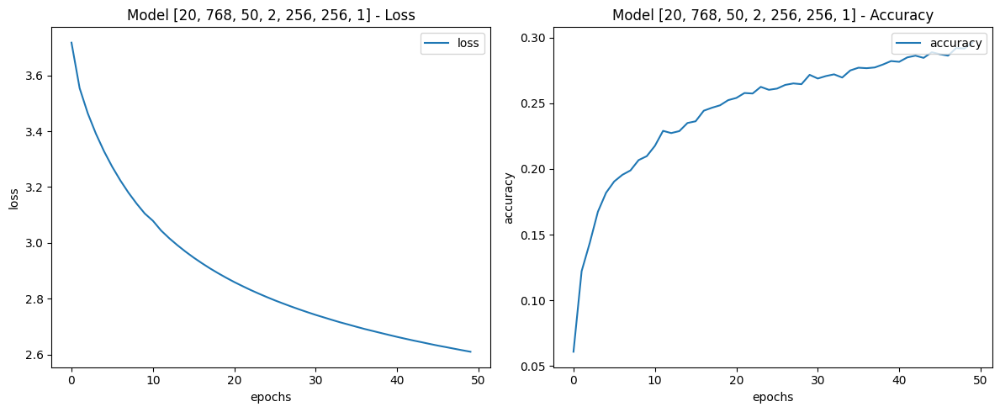

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3451 - loss: 2.4705
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer_Dense_FeatureResnet Attention.....
args:  [20, 768, 50, 2, 256, 256, 2]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 50)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 50)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_50            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_50[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_8    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_27 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_73 (Dense)          │ (None, 50)             │         12,850 │ dropout_27[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_51            │ (None, 50)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_8             │ (None, 100)            │              0 │ dense_73[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_51[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_74 (Dense)          │ (None, 50)             │          5,050 │ concatenate_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,607,148 (6.13 MB)

 Trainable params: 1,607,148 (6.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.0533 - loss: 3.7878
Epoch 1: accuracy improved from -inf to 0.07502, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 30s 13ms/step - accuracy: 0.0533 - loss: 3.7877 - val_accuracy: 0.1849 - val_loss: 3.5616
Epoch 2/50
1327/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1295 - loss: 3.5828
Epoch 2: accuracy improved from 0.07502 to 0.12965, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 50, 2, 256, 256, 2].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 25s 5ms/step - accuracy: 0.1295 - loss: 3.5826 - val_accuracy: 0.1482 - val_loss: 3.4623
Epoch 3/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1416 - loss: 3.4851
Epoch 3: accuracy improved from 0.12965 to 0.14275, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attenti

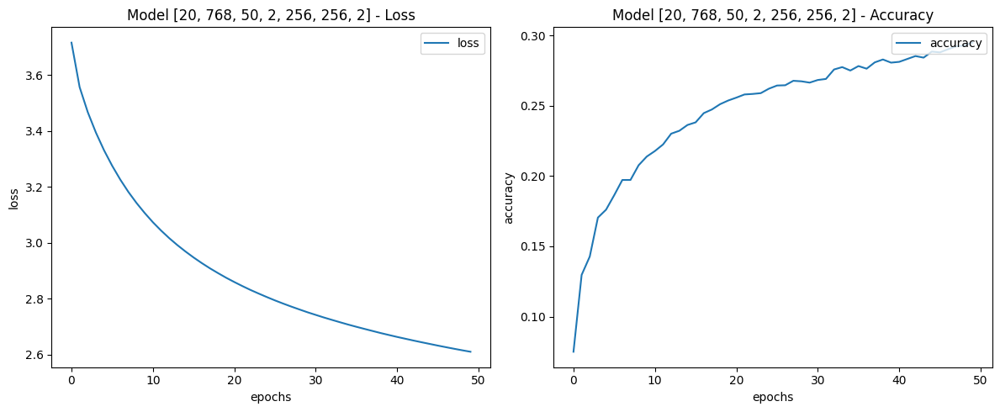

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3445 - loss: 2.4772
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer_Dense_FeatureResnet Attention.....
args:  [20, 768, 50, 2, 256, 256, 4]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
feat_train2 (5345, 50)
lab_train (5345, 50)
lab_train2 (5345, 50)
feat_test (1336, 20, 768)
feat_test2 (1336, 50)
lab_test (1336, 50)
lab_test2 (1336, 50)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_56            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │      1,385,984 │ input_layer_56[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │      1,254,912 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_9    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_30 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_81 (Dense)          │ (None, 50)             │         12,850 │ dropout_30[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_57            │ (None, 50)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_9             │ (None, 100)            │              0 │ dense_81[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_57[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_82 (Dense)          │ (None, 50)             │          5,050 │ concatenate_9[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,658,796 (10.14 MB)

 Trainable params: 2,658,796 (10.14 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.0376 - loss: 3.8018
Epoch 1: accuracy improved from -inf to 0.05650, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 50, 2, 256, 256, 4].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 31s 14ms/step - accuracy: 0.0376 - loss: 3.8017 - val_accuracy: 0.0434 - val_loss: 3.5764
Epoch 2/50
1333/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0895 - loss: 3.5817
Epoch 2: accuracy improved from 0.05650 to 0.10514, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 50, 2, 256, 256, 4].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 24s 6ms/step - accuracy: 0.0896 - loss: 3.5816 - val_accuracy: 0.1332 - val_loss: 3.4623
Epoch 3/50
1327/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1441 - loss: 3.4824
Epoch 3: accuracy improved from 0.10514 to 0.14612, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attent

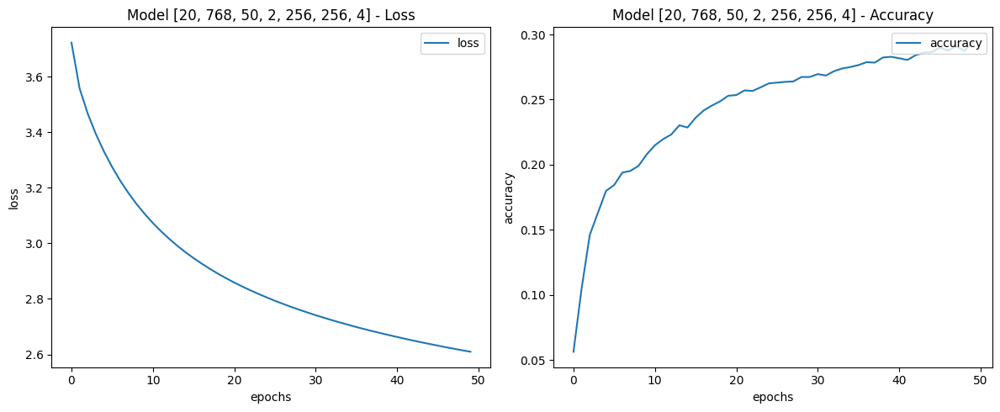

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3365 - loss: 2.4800
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


In [ ]:
import os
import time
import json
import psutil
import numpy as np

MODELS = {'Transformer_Dense_FeatureResnet': Transformer_Dense_FeatureResnet
          }
with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test_2feat(features, features2, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel2(features, features2, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'/content/drive/MyDrive/model_save2/{model_test}')
        np.save(f'/content/drive/MyDrive/np_save2/{model_test}', predictions)

    del predictions

    return history

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features1']))
features2 = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features3'])) #2 hoặc 4

labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels']))
(_,sequence_length, image_size) = features.shape

print(f"Features: {features.shape}")

for model_type in config['Tests4']: # ban đầu là 'Tests3'
    for test in config['Tests4'][model_type]: # ban đầu là 'Tests3'
        for val in config['Tests4'][model_type][test]: # ban đầu là 'Tests3'
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            store_val = defaults[test]
            defaults[test] = val
            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print('args: ', args)

            model = MODELS[model_type](*args)

            history = run_test_2feat(features, features2, labels, model, model_type, test, val, model_type, test, arg = args) #evaluate
            defaults[test] = store_val

            del model


# **Test Model ViT-LSTM**

Features: (6681, 20, 768)
Testing LSTM Layers.....
dong1 {'Layers': 1, 'Units': 128}
dong2 1
dong3 1
[20, 768, 50, 1, 128]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 128)                 │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 50)                  │           6,450 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 465,714 (1.78 MB)

 Trainable params: 465,714 (1.78 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1323 - loss: 3.4409
Epoch 1: accuracy improved from -inf to 0.18017, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 50, 1, 128].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 19s 9ms/step - accuracy: 0.1324 - loss: 3.4407 - val_accuracy: 0.4813 - val_loss: 2.2279
Epoch 2/50
1330/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3295 - loss: 2.5659
Epoch 2: accuracy improved from 0.18017 to 0.35098, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 50, 1, 128].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - accuracy: 0.3296 - loss: 2.5653 - val_accuracy: 0.6602 - val_loss: 1.5171
Epoch 3/50
1332/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4588 - loss: 2.0864
Epoch 3: accuracy improved from 0.35098 to 0.47970, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 50, 1, 128].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4589 - loss: 2.0860

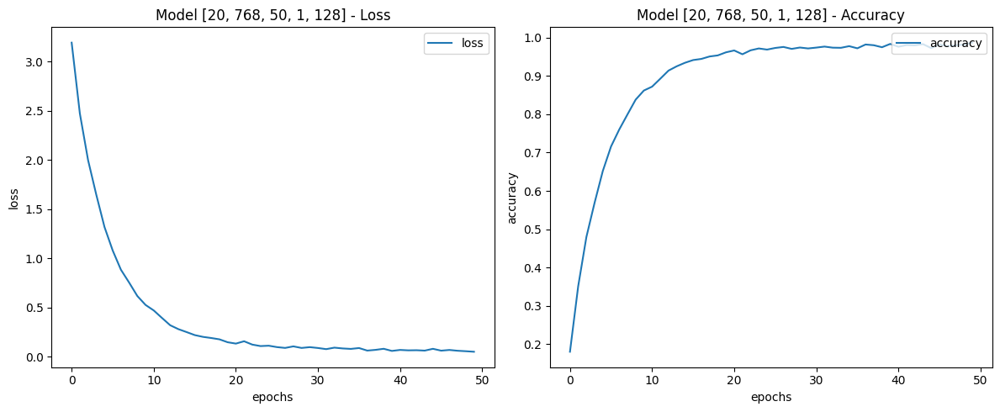

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9954 - loss: 0.0140
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Testing LSTM Layers.....
dong1 {'Layers': 1, 'Units': 128}
dong2 1
dong3 2
[20, 768, 50, 2, 128]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 20, 128)             │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 20, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 128)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 50)                  │           6,450 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 597,298 (2.28 MB)

 Trainable params: 597,298 (2.28 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1085 - loss: 3.4731
Epoch 1: accuracy improved from -inf to 0.14668, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 50, 2, 128].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - accuracy: 0.1085 - loss: 3.4729 - val_accuracy: 0.3638 - val_loss: 2.3262
Epoch 2/50
1332/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.2503 - loss: 2.7683
Epoch 2: accuracy improved from 0.14668 to 0.27558, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 50, 2, 128].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.2505 - loss: 2.7679 - val_accuracy: 0.5045 - val_loss: 1.8166
Epoch 3/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3501 - loss: 2.3167
Epoch 3: accuracy improved from 0.27558 to 0.36595, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 50, 2, 128].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.3501 - loss: 2.3167

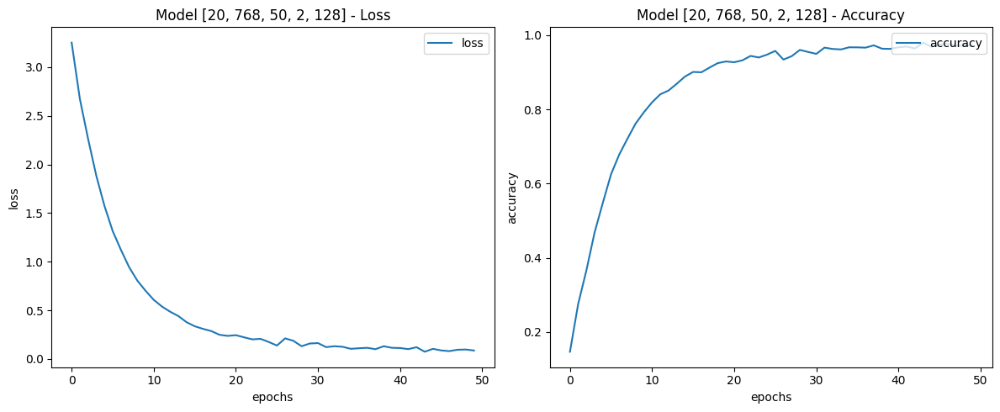

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9985 - loss: 0.0059
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Testing LSTM Layers.....
dong1 {'Layers': 1, 'Units': 128}
dong2 1
dong3 4
[20, 768, 50, 4, 128]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 20, 128)             │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 20, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 20, 128)             │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 20, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 20, 128)             │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 20, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_6 (LSTM)                        │ (None, 128)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 50)                  │           6,450 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 860,466 (3.28 MB)

 Trainable params: 860,466 (3.28 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.0495 - loss: 3.7148
Epoch 1: accuracy improved from -inf to 0.06174, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 50, 4, 128].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 21s 12ms/step - accuracy: 0.0495 - loss: 3.7147 - val_accuracy: 0.1055 - val_loss: 3.2249
Epoch 2/50
1333/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.0901 - loss: 3.3847
Epoch 2: accuracy improved from 0.06174 to 0.10234, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 50, 4, 128].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 20s 12ms/step - accuracy: 0.0901 - loss: 3.3845 - val_accuracy: 0.2784 - val_loss: 2.7059
Epoch 3/50
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.1485 - loss: 3.1588
Epoch 3: accuracy improved from 0.10234 to 0.15061, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 50, 4, 128].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 16s 12ms/step - accuracy: 0.1485 - loss:

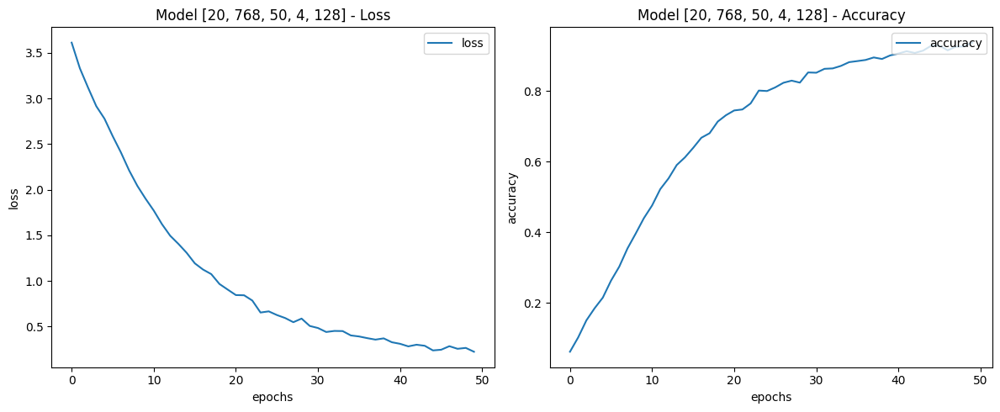

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9190 - loss: 0.3130
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
Testing LSTM Units.....
dong1 {'Layers': 1, 'Units': 128}
dong2 128
dong3 128
[20, 768, 50, 1, 128]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 128)                 │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 50)                  │           6,450 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 465,714 (1.78 MB)

 Trainable params: 465,714 (1.78 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1329/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1434 - loss: 3.4066
Epoch 1: accuracy improved from -inf to 0.19177, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 50, 1, 128].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.1438 - loss: 3.4049 - val_accuracy: 0.5299 - val_loss: 2.0863
Epoch 2/50
1330/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3256 - loss: 2.5584
Epoch 2: accuracy improved from 0.19177 to 0.34911, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 50, 1, 128].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.3258 - loss: 2.5579 - val_accuracy: 0.6557 - val_loss: 1.5599
Epoch 3/50
1336/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4520 - loss: 2.0833
Epoch 3: accuracy improved from 0.34911 to 0.47764, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 50, 1, 128].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.4521 - loss: 2.0832 - v

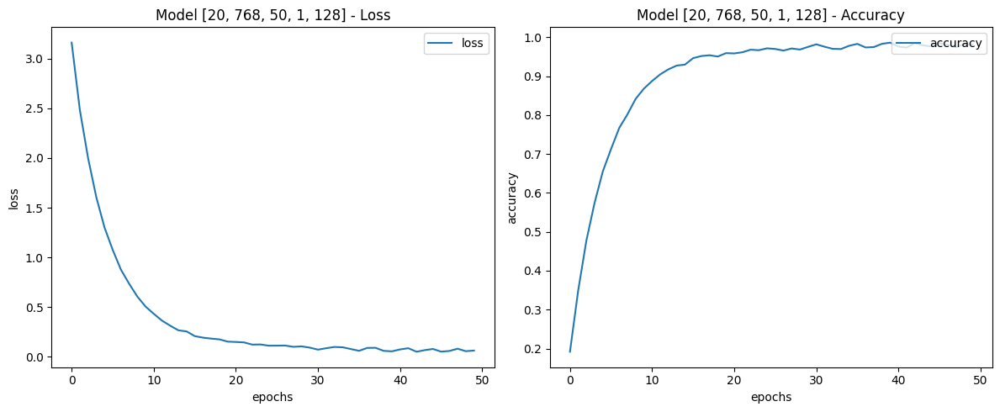

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9993 - loss: 0.0087
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Testing LSTM Units.....
dong1 {'Layers': 1, 'Units': 128}
dong2 128
dong3 256
[20, 768, 50, 1, 256]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_8 (LSTM)                        │ (None, 256)                 │       1,049,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 50)                  │          12,850 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,062,450 (4.05 MB)

 Trainable params: 1,062,450 (4.05 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1334/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1433 - loss: 3.3586
Epoch 1: accuracy improved from -inf to 0.20262, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 50, 1, 256].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.1434 - loss: 3.3577 - val_accuracy: 0.5951 - val_loss: 1.7779
Epoch 2/50
1336/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.3615 - loss: 2.4047
Epoch 2: accuracy improved from 0.20262 to 0.38859, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 50, 1, 256].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.3615 - loss: 2.4046 - val_accuracy: 0.6931 - val_loss: 1.3578
Epoch 3/50
1335/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5147 - loss: 1.8352
Epoch 3: accuracy improved from 0.38859 to 0.53658, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 50, 1, 256].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.5148 - loss: 1.8350 - 

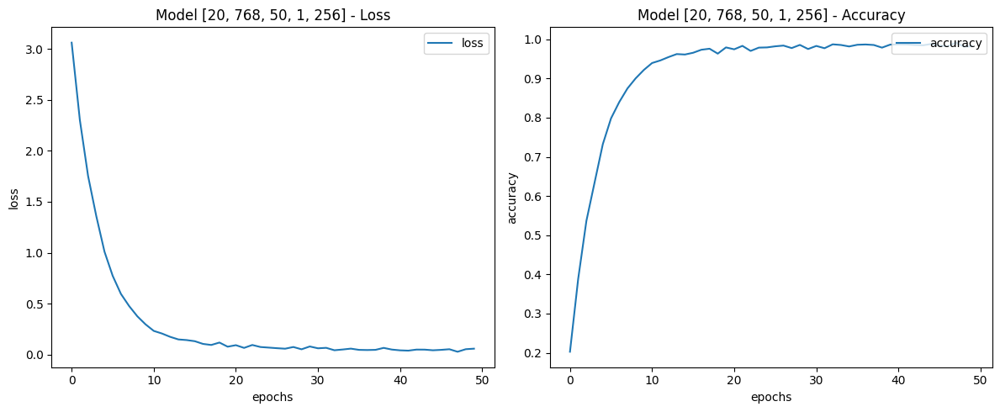

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9985 - loss: 0.0070
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Testing LSTM Units.....
dong1 {'Layers': 1, 'Units': 128}
dong2 128
dong3 512
[20, 768, 50, 1, 512]
all_video 6681
count_test 1336
count_train 5345
feat_train (5345, 20, 768)
lab_train (5345, 50)
feat_test (1336, 20, 768)
lab_test (1336, 50)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_9 (LSTM)                        │ (None, 512)                 │       2,623,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 50)                  │          25,650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,649,138 (10.11 MB)

 Trainable params: 2,649,138 (10.11 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1334/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1429 - loss: 3.3476
Epoch 1: accuracy improved from -inf to 0.20935, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 50, 1, 512].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - accuracy: 0.1431 - loss: 3.3466 - val_accuracy: 0.6639 - val_loss: 1.5540
Epoch 2/50
1335/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3844 - loss: 2.3019
Epoch 2: accuracy improved from 0.20935 to 0.41272, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 50, 1, 512].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - accuracy: 0.3845 - loss: 2.3017 - val_accuracy: 0.6886 - val_loss: 1.2567
Epoch 3/50
1334/1337 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5543 - loss: 1.6193
Epoch 3: accuracy improved from 0.41272 to 0.56333, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 50, 1, 512].keras
1337/1337 ━━━━━━━━━━━━━━━━━━━━ 12s 9ms/step - accuracy: 0.5543 - loss: 1.6192 -

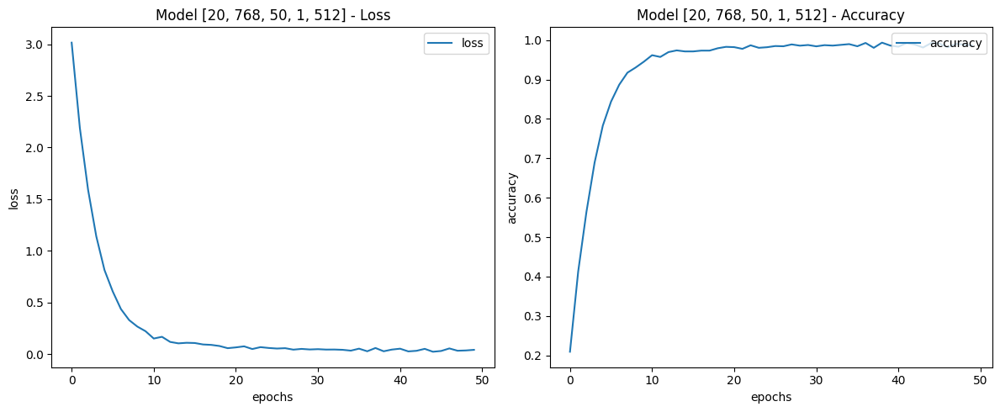

__________________________________________________
Evaluate
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9997 - loss: 0.0052
__________
334/334 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [ ]:
import os
import time
import json
import psutil
import numpy as np

MODELS = {'LSTM': LSTM_Model}

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test(features, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel(features, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'Models/{model_test}')
        np.save(f'Predictions/{model_test}', predictions)

    del predictions
    return history

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features1']))
labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels']))
(_,sequence_length, image_size) = features.shape
print(f"Features: {features.shape}")

for model_type in config['Tests1']:
    for test in config['Tests1'][model_type]:
        for val in config['Tests1'][model_type][test]:
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            print('dong1', defaults)

            store_val = defaults[test]
            print('dong2', store_val)

            defaults[test] = val
            print('dong3', defaults[test])

            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print(args)

            model = MODELS[model_type](*args)

            history = run_test(features, labels, model, model_type, test, val, model_type, test, args) #end_time, mem,
            defaults[test] = store_val

            del model



# **HMDB51**

# **Test Model ViT-ReT**

Features: (6765, 20, 768)
Testing Transformer Layers.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 1
[20, 768, 51, 1, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_1               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 51)                  │          13,107 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 873,267 (3.33 MB)

 Trainable params: 873,267 (3.33 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1345/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0558 - loss: 4.0579
Epoch 1: accuracy improved from -inf to 0.06615, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 51, 1, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - accuracy: 0.0559 - loss: 4.0563 - val_accuracy: 0.1035 - val_loss: 3.3616
Epoch 2/50
1345/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0979 - loss: 3.4616
Epoch 2: accuracy improved from 0.06615 to 0.10237, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 51, 1, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.0980 - loss: 3.4614 - val_accuracy: 0.1648 - val_loss: 3.1433
Epoch 3/50
1343/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1303 - loss: 3.2669
Epoch 3: accuracy improved from 0.10237 to 0.12731, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 51, 1, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 5

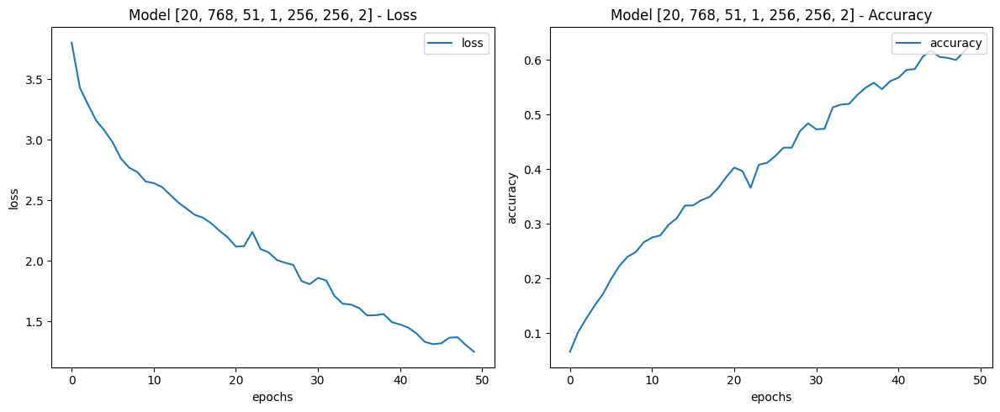

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3347 - loss: 2.4001
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Testing Transformer Layers.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 2
[20, 768, 51, 2, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_4 (Encoder)                  │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_2               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 51)                  │          13,107 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,531,443 (5.84 MB)

 Trainable params: 1,531,443 (5.84 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1347/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0201 - loss: 4.2520
Epoch 1: accuracy improved from -inf to 0.02291, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - accuracy: 0.0202 - loss: 4.2512 - val_accuracy: 0.0000e+00 - val_loss: 3.8286
Epoch 2/50
1352/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0261 - loss: 3.9411
Epoch 2: accuracy improved from 0.02291 to 0.02846, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0261 - loss: 3.9410 - val_accuracy: 0.0000e+00 - val_loss: 3.8992
Epoch 3/50
1347/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0268 - loss: 3.8563
Epoch 3: accuracy did not improve from 0.02846
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.0268 - loss: 3.8562 - val_accuracy: 0.0000e+00 - val_loss: 3.8596
Epoch 4/5

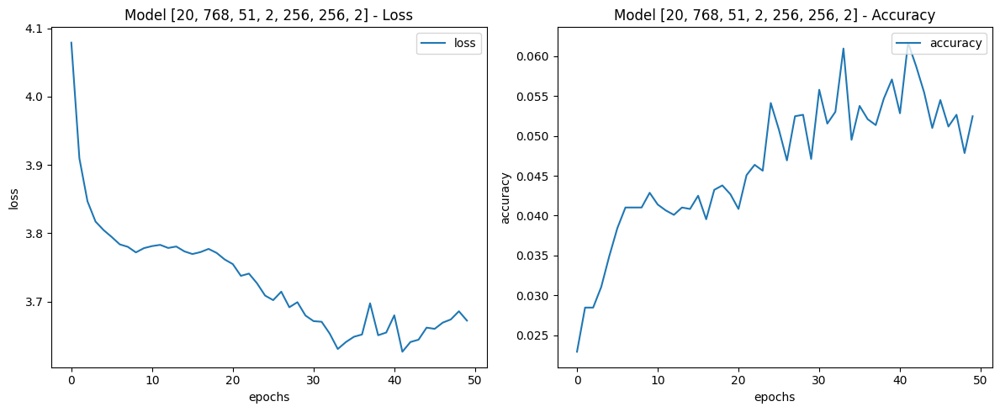

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.0737 - loss: 3.6107
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
Testing Transformer Layers.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 4
[20, 768, 51, 4, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_6 (Encoder)                  │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_7 (Encoder)                  │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_8 (Encoder)                  │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_3               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 51)                  │          13,107 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,847,795 (10.86 MB)

 Trainable params: 2,847,795 (10.86 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1343/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0186 - loss: 4.2161
Epoch 1: accuracy improved from -inf to 0.02347, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 51, 4, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 29s 9ms/step - accuracy: 0.0186 - loss: 4.2149 - val_accuracy: 0.0939 - val_loss: 3.8876
Epoch 2/50
1352/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0253 - loss: 3.9355
Epoch 2: accuracy improved from 0.02347 to 0.02531, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 51, 4, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 29s 6ms/step - accuracy: 0.0253 - loss: 3.9355 - val_accuracy: 0.0000e+00 - val_loss: 3.8675
Epoch 3/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0288 - loss: 3.8876
Epoch 3: accuracy improved from 0.02531 to 0.03141, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 51, 4, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━

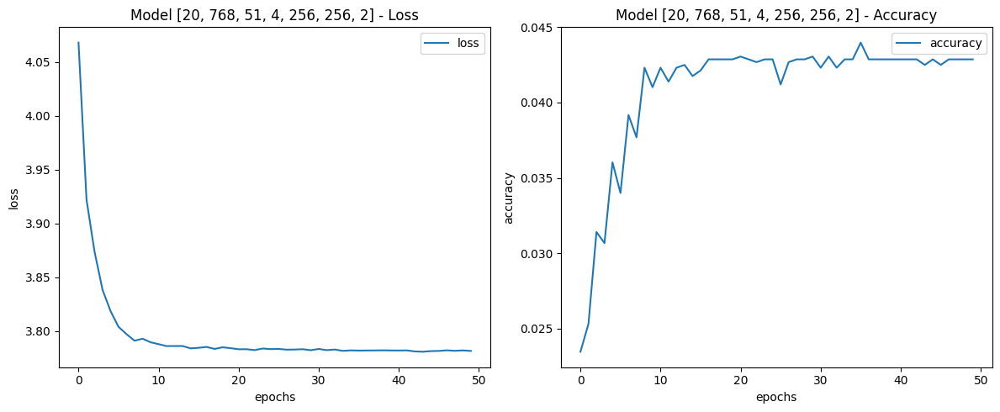

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.0000e+00 - loss: 3.8090
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step
Testing Transformer Input.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 256
dong3 256
[20, 768, 51, 2, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_10 (Encoder)                 │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_4               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 51)                  │          13,107 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,531,443 (5.84 MB)

 Trainable params: 1,531,443 (5.84 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1346/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0224 - loss: 4.2374
Epoch 1: accuracy improved from -inf to 0.02439, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - accuracy: 0.0224 - loss: 4.2364 - val_accuracy: 0.1072 - val_loss: 3.9408
Epoch 2/50
1351/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0327 - loss: 3.8923
Epoch 2: accuracy improved from 0.02439 to 0.03418, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0327 - loss: 3.8922 - val_accuracy: 0.0200 - val_loss: 3.9550
Epoch 3/50
1342/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0408 - loss: 3.7923
Epoch 3: accuracy improved from 0.03418 to 0.04176, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 10s 

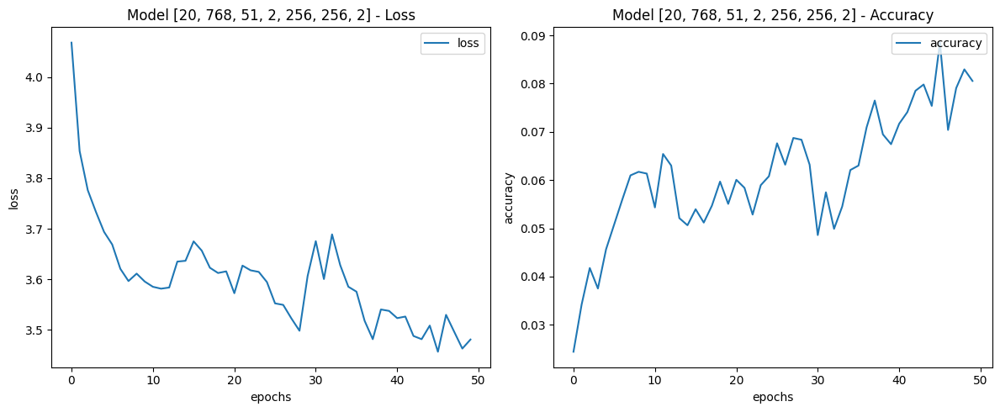

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.0719 - loss: 3.4418
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
Testing Transformer Input.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 256
dong3 512
[20, 768, 51, 2, 512, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 512)             │       2,768,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_12 (Encoder)                 │ (None, 20, 512)             │       2,364,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_5               │ (None, 512)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_18 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_37 (Dense)                     │ (None, 51)                  │          26,163 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,159,475 (19.68 MB)

 Trainable params: 5,159,475 (19.68 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1350/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0184 - loss: 4.4508
Epoch 1: accuracy improved from -inf to 0.02125, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 51, 2, 512, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.0184 - loss: 4.4501 - val_accuracy: 0.0000e+00 - val_loss: 4.1151
Epoch 2/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0292 - loss: 3.9837
Epoch 2: accuracy improved from 0.02125 to 0.03030, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 51, 2, 512, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.0292 - loss: 3.9836 - val_accuracy: 0.0000e+00 - val_loss: 4.0434
Epoch 3/50
1345/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0290 - loss: 3.8914
Epoch 3: accuracy did not improve from 0.03030
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.0290 - loss: 3.8913 - val_accuracy: 0.0806 - val_loss: 4.0165
Epoch 4/50
1353/

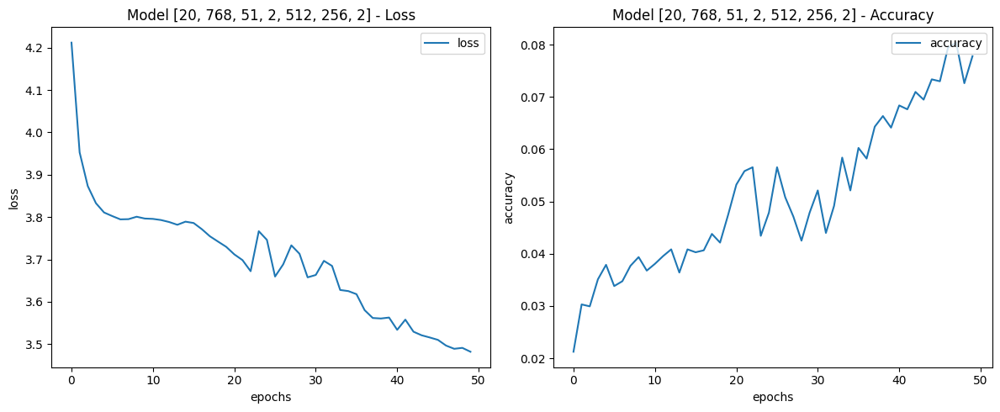

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.0000e+00 - loss: 3.7313
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
Testing Transformer Internal.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 256
dong3 256
[20, 768, 51, 2, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_25 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_14 (Encoder)                 │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_6               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_21 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_43 (Dense)                     │ (None, 51)                  │          13,107 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,531,443 (5.84 MB)

 Trainable params: 1,531,443 (5.84 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1348/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0290 - loss: 4.1895
Epoch 1: accuracy improved from -inf to 0.03344, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - accuracy: 0.0291 - loss: 4.1887 - val_accuracy: 0.1064 - val_loss: 4.0433
Epoch 2/50
1351/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0369 - loss: 3.8401
Epoch 2: accuracy improved from 0.03344 to 0.03677, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0369 - loss: 3.8401 - val_accuracy: 0.0207 - val_loss: 3.8077
Epoch 3/50
1341/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0471 - loss: 3.7294
Epoch 3: accuracy improved from 0.03677 to 0.05174, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━

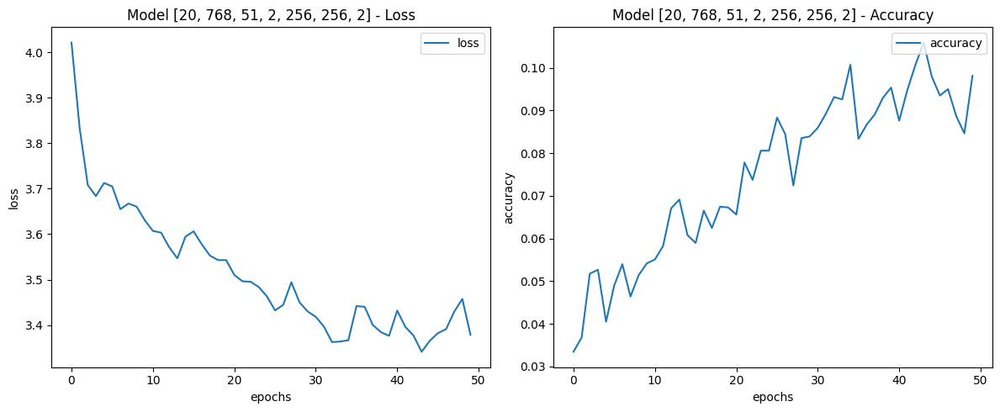

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1567 - loss: 3.4233
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
Testing Transformer Internal.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 256
dong3 512
[20, 768, 51, 2, 256, 512, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_29 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         991,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_16 (Encoder)                 │ (None, 20, 256)             │         789,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_7               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_24 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_49 (Dense)                     │ (None, 51)                  │          13,107 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,794,099 (6.84 MB)

 Trainable params: 1,794,099 (6.84 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0244 - loss: 4.2321
Epoch 1: accuracy improved from -inf to 0.02809, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 51, 2, 256, 512, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - accuracy: 0.0245 - loss: 4.2315 - val_accuracy: 0.0000e+00 - val_loss: 3.8681
Epoch 2/50
1339/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0318 - loss: 3.9143
Epoch 2: accuracy did not improve from 0.02809
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.0317 - loss: 3.9142 - val_accuracy: 0.0000e+00 - val_loss: 3.8270
Epoch 3/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0302 - loss: 3.8492
Epoch 3: accuracy improved from 0.02809 to 0.03104, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 51, 2, 256, 512, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - accuracy: 0.0302 - loss: 3.8491 - val_accuracy: 0.0000e+00 - val_loss: 3.8594
Epoch

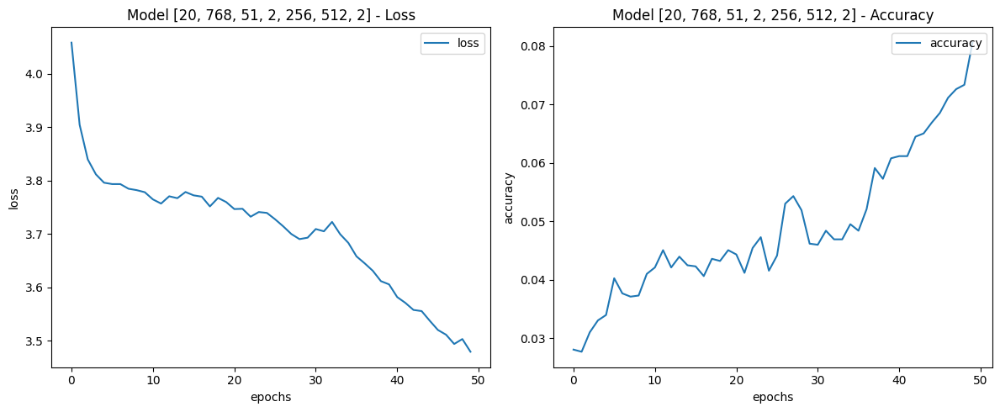

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.0698 - loss: 3.4814
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
Testing Transformer Attention.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 1
[20, 768, 51, 2, 256, 256, 1]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_33 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         597,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_18 (Encoder)                 │ (None, 20, 256)             │         395,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_8               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_27 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_55 (Dense)                     │ (None, 51)                  │          13,107 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,005,619 (3.84 MB)

 Trainable params: 1,005,619 (3.84 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1346/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0362 - loss: 4.1418
Epoch 1: accuracy improved from -inf to 0.04472, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 51, 2, 256, 256, 1].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.0363 - loss: 4.1405 - val_accuracy: 0.1463 - val_loss: 3.6522
Epoch 2/50
1340/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0552 - loss: 3.7045
Epoch 2: accuracy improved from 0.04472 to 0.04804, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 51, 2, 256, 256, 1].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0551 - loss: 3.7047 - val_accuracy: 0.0776 - val_loss: 3.7263
Epoch 3/50
1343/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0602 - loss: 3.7046
Epoch 3: accuracy improved from 0.04804 to 0.05229, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 51, 2, 256, 256, 1].keras
1353/1353 ━━━━━━━━━━━━━

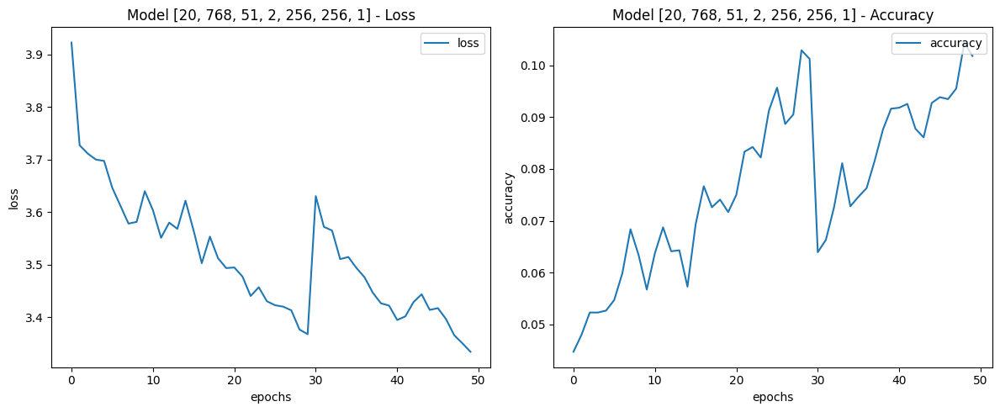

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1009 - loss: 3.3668
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
Testing Transformer Attention.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 2
[20, 768, 51, 2, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_37 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_20 (Encoder)                 │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_9               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_30 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_61 (Dense)                     │ (None, 51)                  │          13,107 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,531,443 (5.84 MB)

 Trainable params: 1,531,443 (5.84 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1343/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0222 - loss: 4.1984
Epoch 1: accuracy improved from -inf to 0.02421, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - accuracy: 0.0223 - loss: 4.1972 - val_accuracy: 0.0000e+00 - val_loss: 3.9069
Epoch 2/50
1341/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0257 - loss: 3.9367
Epoch 2: accuracy improved from 0.02421 to 0.02716, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.0257 - loss: 3.9365 - val_accuracy: 0.0000e+00 - val_loss: 3.8076
Epoch 3/50
1347/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0313 - loss: 3.8564
Epoch 3: accuracy improved from 0.02716 to 0.02993, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━

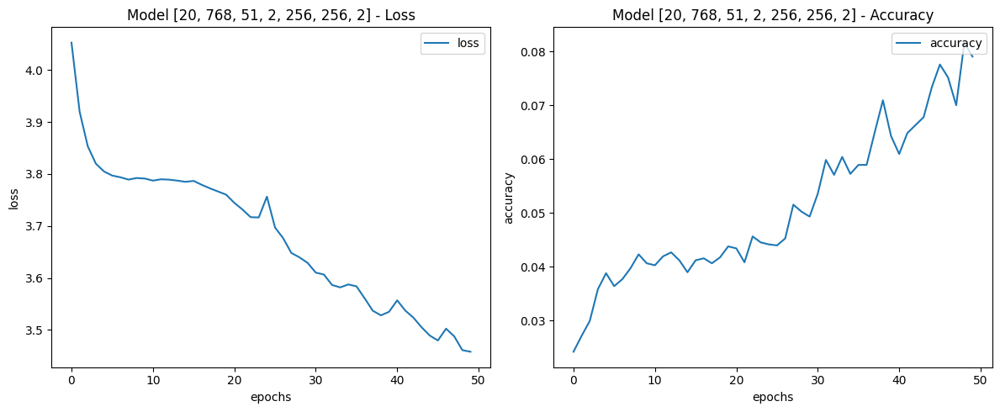

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1745 - loss: 3.4643
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
Testing Transformer Attention.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 4
[20, 768, 51, 2, 256, 256, 4]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_41 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │       1,385,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_22 (Encoder)                 │ (None, 20, 256)             │       1,184,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_10              │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_33 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_67 (Dense)                     │ (None, 51)                  │          13,107 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,583,091 (9.85 MB)

 Trainable params: 2,583,091 (9.85 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1350/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0251 - loss: 4.2025
Epoch 1: accuracy improved from -inf to 0.02458, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 51, 2, 256, 256, 4].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.0251 - loss: 4.2021 - val_accuracy: 0.0000e+00 - val_loss: 3.9013
Epoch 2/50
1339/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0247 - loss: 3.9364
Epoch 2: accuracy did not improve from 0.02458
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.0247 - loss: 3.9362 - val_accuracy: 0.0000e+00 - val_loss: 3.7337
Epoch 3/50
1342/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0330 - loss: 3.8623
Epoch 3: accuracy improved from 0.02458 to 0.03067, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 51, 2, 256, 256, 4].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.0330 - loss: 3.8623 - val_accuracy: 0.0288 - val_loss: 3.8632
Epoch 4/

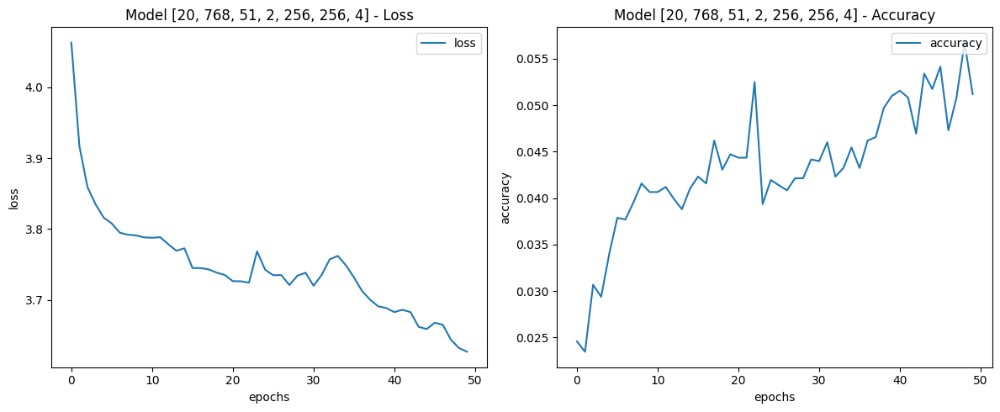

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1009 - loss: 3.5793
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step


In [ ]:
import os
import time
import json
import psutil
import numpy as np

MODELS = {'Transformer': Transformer_Model}

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test(features, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel(features, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'Models/{model_test}')
        np.save(f'Predictions/{model_test}', predictions)

    del predictions
    return history

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features5']))
labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels2']))
(_,sequence_length, image_size) = features.shape
print(f"Features: {features.shape}")

for model_type in config['Tests2']:
    for test in config['Tests2'][model_type]:
        for val in config['Tests2'][model_type][test]:
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            print('dong1', defaults)

            store_val = defaults[test]
            print('dong2', store_val)

            defaults[test] = val
            print('dong3', defaults[test])

            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories2']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print(args)

            model = MODELS[model_type](*args)

            history = run_test(features, labels, model, model_type, test, val, model_type, test, args)
            defaults[test] = store_val

            del model


# **Test Model Đề xuất**

Features: (6765, 20, 768)
Testing Transformer_FeatureResnet_Dense Layers.....
args:  [20, 768, 51, 1, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 20, 2048)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 20, 2048)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 20, 512)        │              0 │ transformer[0][0],     │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d      │ (None, 512)            │              0 │ concatenate[0][0]      │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 512)            │              0 │ global_max_pooling1d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 51)             │         26,163 │ dropout[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,707 (2.10 MB)

 Trainable params: 550,707 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1348/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1535 - loss: 7.1418
Epoch 1: accuracy improved from -inf to 0.21988, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 51, 1, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 23s 11ms/step - accuracy: 0.1538 - loss: 7.1359 - val_accuracy: 0.5580 - val_loss: 1.8371
Epoch 2/50
1341/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4625 - loss: 2.5918
Epoch 2: accuracy improved from 0.21988 to 0.42979, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 51, 1, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.4621 - loss: 2.5947 - val_accuracy: 0.7184 - val_loss: 1.1770
Epoch 3/50
1345/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5344 - loss: 2.1201
Epoch 3: accuracy improved from 0.42979 to 0.50517, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 76

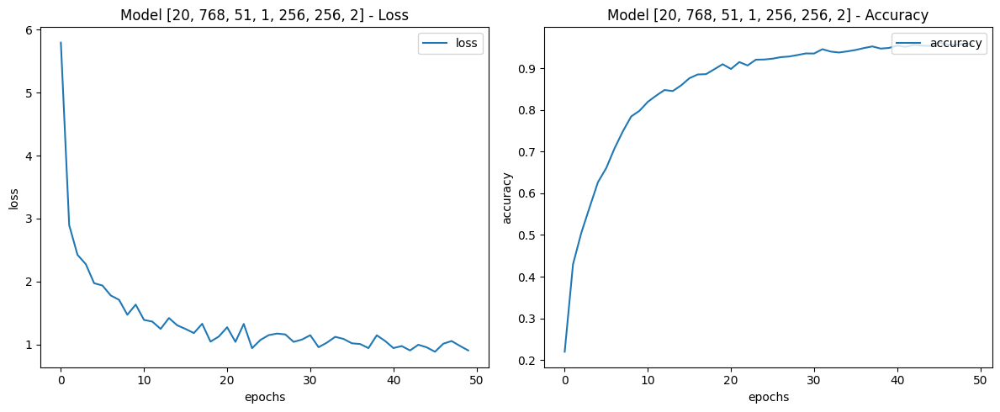

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9558 - loss: 0.9641
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
Testing Transformer_FeatureResnet_Dense Layers.....
args:  [20, 768, 51, 2, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 20, 2048)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 20, 2048)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_5[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_1    │ (None, 512)            │              0 │ concatenate_1[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_12 (Dense)          │ (None, 51)             │         26,163 │ dropout_2[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,707 (2.10 MB)

 Trainable params: 550,707 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1595 - loss: 7.0179
Epoch 1: accuracy improved from -inf to 0.22210, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 24s 10ms/step - accuracy: 0.1595 - loss: 7.0169 - val_accuracy: 0.6098 - val_loss: 1.9038
Epoch 2/50
1341/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4610 - loss: 2.6475
Epoch 2: accuracy improved from 0.22210 to 0.43274, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4607 - loss: 2.6495 - val_accuracy: 0.6556 - val_loss: 1.4130
Epoch 3/50
1345/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5166 - loss: 2.2208
Epoch 3: accuracy improved from 0.43274 to 0.50203, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 76

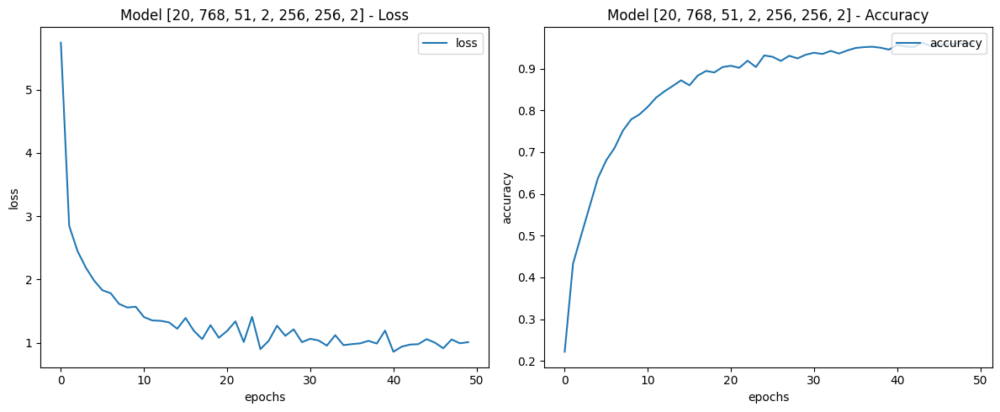

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9798 - loss: 0.4790
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step
Testing Transformer_FeatureResnet_Dense Layers.....
args:  [20, 768, 51, 4, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 20, 2048)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 20, 2048)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer3 (Functional) │ (None, 20, 256)        │              0 │ transformer2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer4 (Functional) │ (None, 20, 256)        │              0 │ transformer3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_13 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 20, 512)        │              0 │ transformer4[0][0],    │
│ (Concatenate)             │                        │                │ dense_13[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_2    │ (None, 512)            │              0 │ concatenate_2[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_5 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_26 (Dense)          │ (None, 51)             │         26,163 │ dropout_5[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,707 (2.10 MB)

 Trainable params: 550,707 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1351/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1520 - loss: 7.2213
Epoch 1: accuracy improved from -inf to 0.21748, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 51, 4, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 46s 17ms/step - accuracy: 0.1521 - loss: 7.2184 - val_accuracy: 0.5351 - val_loss: 2.0128
Epoch 2/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.4379 - loss: 2.6410
Epoch 2: accuracy improved from 0.21748 to 0.43016, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 51, 4, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 20s 9ms/step - accuracy: 0.4379 - loss: 2.6417 - val_accuracy: 0.6171 - val_loss: 1.5774
Epoch 3/50
1351/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5603 - loss: 2.0078
Epoch 3: accuracy improved from 0.43016 to 0.51552, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 7

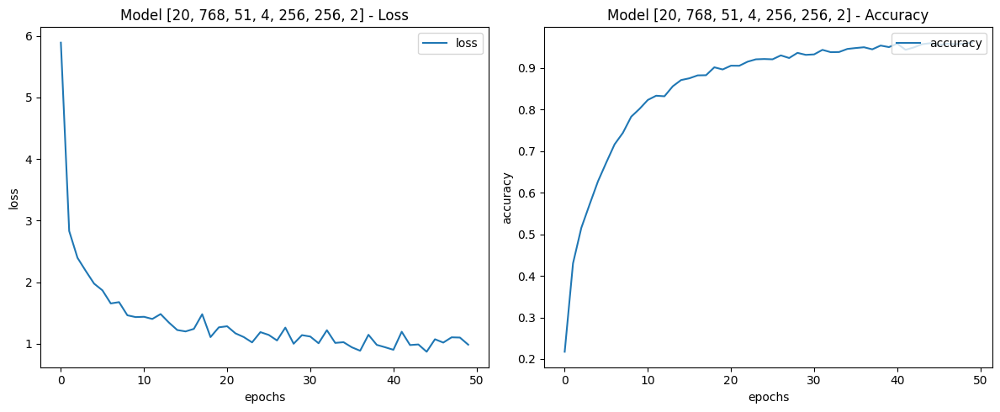

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9722 - loss: 0.8498
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step
Testing Transformer_FeatureResnet_Dense Input.....
args:  [20, 768, 51, 2, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 20, 2048)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 20, 2048)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_27 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_3             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_27[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_3    │ (None, 512)            │              0 │ concatenate_3[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_10 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_34 (Dense)          │ (None, 51)             │         26,163 │ dropout_10[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,707 (2.10 MB)

 Trainable params: 550,707 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1343/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1610 - loss: 7.1229
Epoch 1: accuracy improved from -inf to 0.21729, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 28s 12ms/step - accuracy: 0.1614 - loss: 7.1127 - val_accuracy: 0.6001 - val_loss: 1.6526
Epoch 2/50
1348/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4624 - loss: 2.5404
Epoch 2: accuracy improved from 0.21729 to 0.43810, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 27s 6ms/step - accuracy: 0.4623 - loss: 2.5416 - val_accuracy: 0.6349 - val_loss: 1.5182
Epoch 3/50
1347/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5406 - loss: 2.0779
Epoch 3: accuracy improved from 0.43810 to 0.49945, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768,

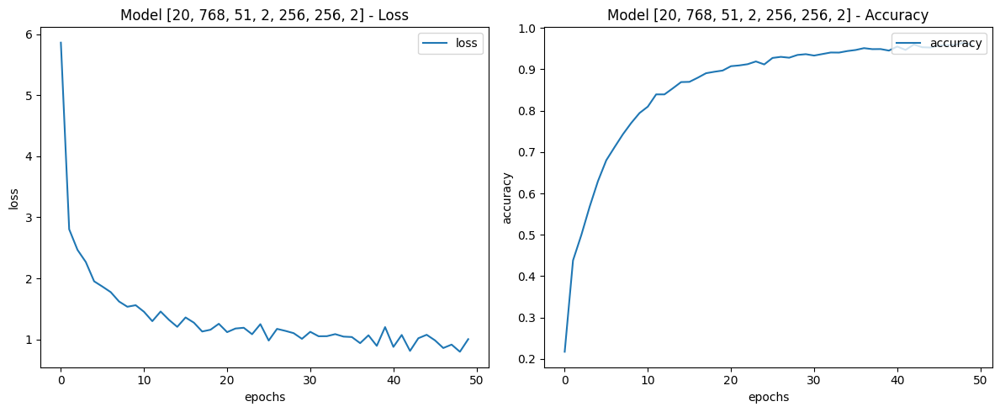

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9670 - loss: 0.6234
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step
Testing Transformer_FeatureResnet_Dense Input.....
args:  [20, 768, 51, 2, 512, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 20, 2048)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 20, 2048)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 512)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 512)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_35 (Dense)          │ (None, 20, 512)        │      1,049,088 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_4             │ (None, 20, 1024)       │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_35[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_4    │ (None, 1024)           │              0 │ concatenate_4[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_13 (Dropout)      │ (None, 1024)           │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_42 (Dense)          │ (None, 51)             │         52,275 │ dropout_13[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,101,363 (4.20 MB)

 Trainable params: 1,101,363 (4.20 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1693 - loss: 9.2188
Epoch 1: accuracy improved from -inf to 0.21619, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768, 51, 2, 512, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 33s 14ms/step - accuracy: 0.1693 - loss: 9.2177 - val_accuracy: 0.4900 - val_loss: 2.7261
Epoch 2/50
1347/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4203 - loss: 3.6578
Epoch 2: accuracy improved from 0.21619 to 0.39431, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768, 51, 2, 512, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.4201 - loss: 3.6606 - val_accuracy: 0.5536 - val_loss: 2.6095
Epoch 3/50
1347/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4842 - loss: 3.3711
Epoch 3: accuracy improved from 0.39431 to 0.45584, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768,

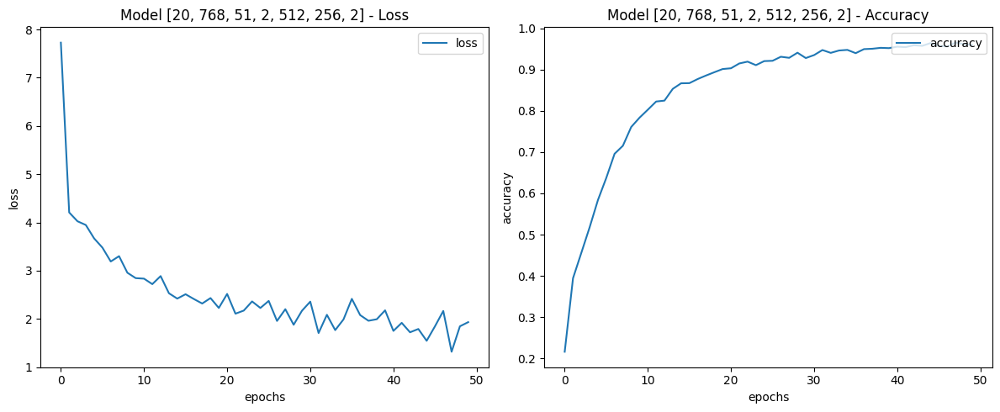

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9783 - loss: 0.5879
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
Testing Transformer_FeatureResnet_Dense Internal.....
args:  [20, 768, 51, 2, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 20, 2048)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 20, 2048)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_43 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_5             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_43[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_5    │ (None, 512)            │              0 │ concatenate_5[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_16 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_50 (Dense)          │ (None, 51)             │         26,163 │ dropout_16[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,707 (2.10 MB)

 Trainable params: 550,707 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1345/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1577 - loss: 7.2332
Epoch 1: accuracy improved from -inf to 0.23004, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 24s 9ms/step - accuracy: 0.1582 - loss: 7.2238 - val_accuracy: 0.5373 - val_loss: 2.2317
Epoch 2/50
1347/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4433 - loss: 2.7410
Epoch 2: accuracy improved from 0.23004 to 0.42572, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.4432 - loss: 2.7419 - val_accuracy: 0.7021 - val_loss: 1.2254
Epoch 3/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5628 - loss: 1.9504
Epoch 3: accuracy improved from 0.42572 to 0.51256, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[2

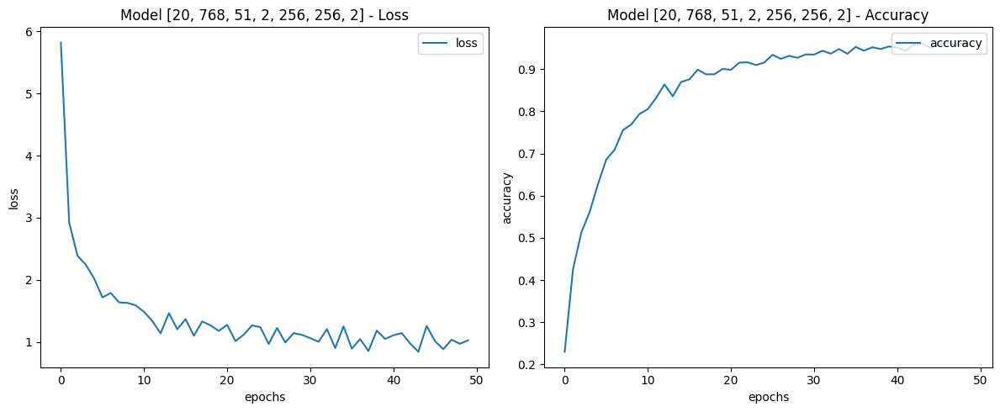

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9810 - loss: 0.3710
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
Testing Transformer_FeatureResnet_Dense Internal.....
args:  [20, 768, 51, 2, 256, 512, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 20, 2048)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 20, 2048)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_51 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_6             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_51[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_6    │ (None, 512)            │              0 │ concatenate_6[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_19 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_58 (Dense)          │ (None, 51)             │         26,163 │ dropout_19[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,707 (2.10 MB)

 Trainable params: 550,707 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1348/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1546 - loss: 7.1440
Epoch 1: accuracy improved from -inf to 0.21859, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[20, 768, 51, 2, 256, 512, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 28s 11ms/step - accuracy: 0.1549 - loss: 7.1384 - val_accuracy: 0.4908 - val_loss: 2.2673
Epoch 2/50
1344/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4672 - loss: 2.4957
Epoch 2: accuracy improved from 0.21859 to 0.44272, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[20, 768, 51, 2, 256, 512, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4670 - loss: 2.4974 - val_accuracy: 0.5965 - val_loss: 1.9838
Epoch 3/50
1342/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5185 - loss: 2.2420
Epoch 3: accuracy improved from 0.44272 to 0.49372, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[

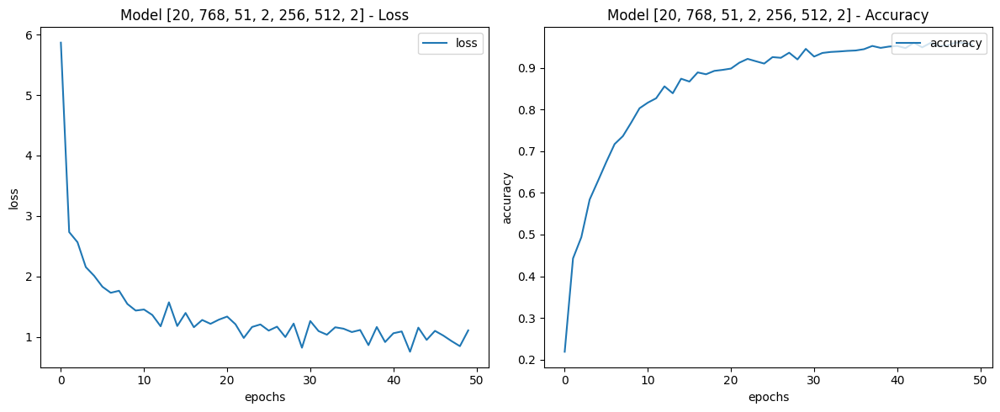

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9881 - loss: 0.2784
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
Testing Transformer_FeatureResnet_Dense Attention.....
args:  [20, 768, 51, 2, 256, 256, 1]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 20, 2048)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 20, 2048)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_59 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_7             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_59[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_7    │ (None, 512)            │              0 │ concatenate_7[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_22 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_66 (Dense)          │ (None, 51)             │         26,163 │ dropout_22[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,707 (2.10 MB)

 Trainable params: 550,707 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1351/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1634 - loss: 7.3197
Epoch 1: accuracy improved from -inf to 0.22339, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 51, 2, 256, 256, 1].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 28s 11ms/step - accuracy: 0.1635 - loss: 7.3167 - val_accuracy: 0.5787 - val_loss: 1.9218
Epoch 2/50
1345/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4532 - loss: 2.5471
Epoch 2: accuracy improved from 0.22339 to 0.43681, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 51, 2, 256, 256, 1].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4531 - loss: 2.5484 - val_accuracy: 0.6386 - val_loss: 1.5628
Epoch 3/50
1347/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5271 - loss: 2.1883
Epoch 3: accuracy improved from 0.43681 to 0.50462, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attentio

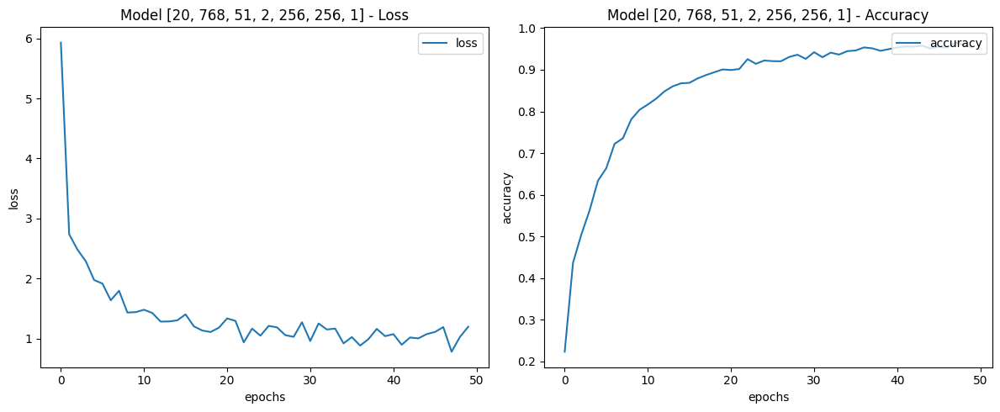

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9854 - loss: 0.3315
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
Testing Transformer_FeatureResnet_Dense Attention.....
args:  [20, 768, 51, 2, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 20, 2048)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 20, 2048)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_67 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_8             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_67[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_8    │ (None, 512)            │              0 │ concatenate_8[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_25 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_74 (Dense)          │ (None, 51)             │         26,163 │ dropout_25[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,707 (2.10 MB)

 Trainable params: 550,707 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1347/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1652 - loss: 6.9935
Epoch 1: accuracy improved from -inf to 0.23134, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 26s 11ms/step - accuracy: 0.1655 - loss: 6.9873 - val_accuracy: 0.5018 - val_loss: 2.3137
Epoch 2/50
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4417 - loss: 2.6642
Epoch 2: accuracy improved from 0.23134 to 0.42036, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 29s 6ms/step - accuracy: 0.4417 - loss: 2.6644 - val_accuracy: 0.6341 - val_loss: 1.6353
Epoch 3/50
1352/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5590 - loss: 2.0235
Epoch 3: accuracy improved from 0.42036 to 0.49945, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attenti

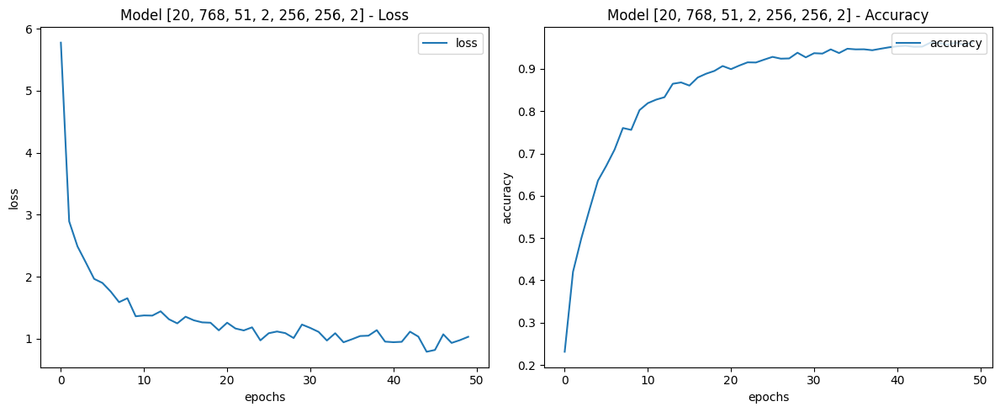

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9572 - loss: 1.4980
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
Testing Transformer_FeatureResnet_Dense Attention.....
args:  [20, 768, 51, 2, 256, 256, 4]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 20, 2048)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 20, 2048)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │              0 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │              0 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_75 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_9             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_75[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_9    │ (None, 512)            │              0 │ concatenate_9[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_28 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_82 (Dense)          │ (None, 51)             │         26,163 │ dropout_28[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 550,707 (2.10 MB)

 Trainable params: 550,707 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1352/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1588 - loss: 7.1473
Epoch 1: accuracy improved from -inf to 0.22635, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 51, 2, 256, 256, 4].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 27s 11ms/step - accuracy: 0.1589 - loss: 7.1453 - val_accuracy: 0.4472 - val_loss: 2.8015
Epoch 2/50
1351/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4717 - loss: 2.5762
Epoch 2: accuracy improved from 0.22635 to 0.44420, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 51, 2, 256, 256, 4].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.4717 - loss: 2.5767 - val_accuracy: 0.4967 - val_loss: 2.4697
Epoch 3/50
1344/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5257 - loss: 2.2417
Epoch 3: accuracy improved from 0.44420 to 0.50000, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attentio

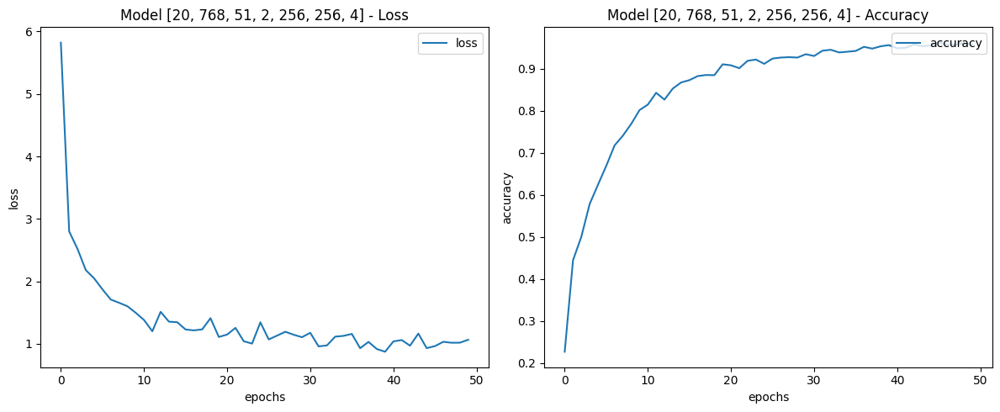

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9823 - loss: 0.1796
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step


In [ ]:
import os
import time
import json
import psutil
import numpy as np

# MODELS = {'LSTM': LSTM_Model, 'Transformer': Transformer_Model}
MODELS = {'Transformer_FeatureResnet_Dense': Transformer_FeatureResnet_Dense
          }
with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test_2feat(features, features2, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel2(features, features2, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'/content/drive/MyDrive/model_save2/{model_test}')
        np.save(f'/content/drive/MyDrive/np_save2/{model_test}', predictions)

    del predictions

    return history

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features5']))
features2 = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features6'])) #2 hoặc 4

labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels2']))
(_,sequence_length, image_size) = features.shape

print(f"Features: {features.shape}")

for model_type in config['Tests3']: # ban đầu là 'Tests3'
    for test in config['Tests3'][model_type]: # ban đầu là 'Tests3'
        for val in config['Tests3'][model_type][test]: # ban đầu là 'Tests3'
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            store_val = defaults[test]
            defaults[test] = val
            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories2']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print('args: ', args)

            model = MODELS[model_type](*args)

            history = run_test_2feat(features, features2, labels, model, model_type, test, val, model_type, test, arg = args)
            defaults[test] = store_val

            del model



# **Test Model Đề xuất kiểm chứng**

Features: (6765, 20, 768)
Testing Transformer_Dense_FeatureResnet Layers.....
args:  [20, 768, 51, 1, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 51)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 51)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_46            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_46[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_11   │ (None, 256)            │              0 │ transformer[0][0]      │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_34 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_91 (Dense)          │ (None, 51)             │         13,107 │ dropout_34[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_47            │ (None, 51)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 102)            │              0 │ dense_91[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_47[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_92 (Dense)          │ (None, 51)             │          5,253 │ concatenate_1[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 878,520 (3.35 MB)

 Trainable params: 878,520 (3.35 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1350/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0267 - loss: 3.8709
Epoch 1: accuracy improved from -inf to 0.03492, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 51, 1, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.0268 - loss: 3.8707 - val_accuracy: 0.0000e+00 - val_loss: 3.7698
Epoch 2/50
1339/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0470 - loss: 3.7312
Epoch 2: accuracy improved from 0.03492 to 0.04915, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 51, 1, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 14s 4ms/step - accuracy: 0.0470 - loss: 3.7311 - val_accuracy: 0.0089 - val_loss: 3.7091
Epoch 3/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0552 - loss: 3.6720
Epoch 3: accuracy improved from 0.04915 to 0.05229, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20

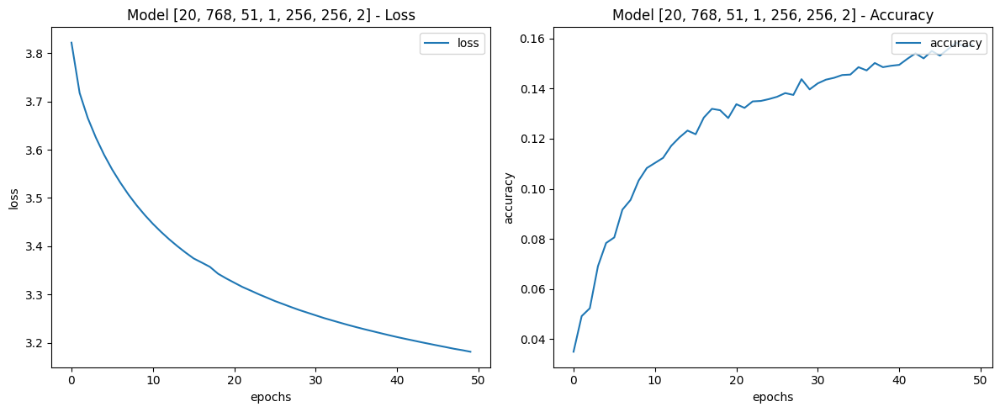

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1880 - loss: 3.1134
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
Testing Transformer_Dense_FeatureResnet Layers.....
args:  [20, 768, 51, 2, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 51)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 51)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_50            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_50[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_12   │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_37 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_99 (Dense)          │ (None, 51)             │         13,107 │ dropout_37[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_51            │ (None, 51)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 102)            │              0 │ dense_99[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_51[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_100 (Dense)         │ (None, 51)             │          5,253 │ concatenate_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,607,608 (6.13 MB)

 Trainable params: 1,607,608 (6.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1347/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0320 - loss: 3.8596
Epoch 1: accuracy improved from -inf to 0.03769, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 23s 8ms/step - accuracy: 0.0320 - loss: 3.8594 - val_accuracy: 0.0000e+00 - val_loss: 3.7413
Epoch 2/50
1342/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0473 - loss: 3.7265
Epoch 2: accuracy improved from 0.03769 to 0.04841, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.0473 - loss: 3.7264 - val_accuracy: 7.3910e-04 - val_loss: 3.6960
Epoch 3/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0496 - loss: 3.6771
Epoch 3: accuracy improved from 0.04841 to 0.05451, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers

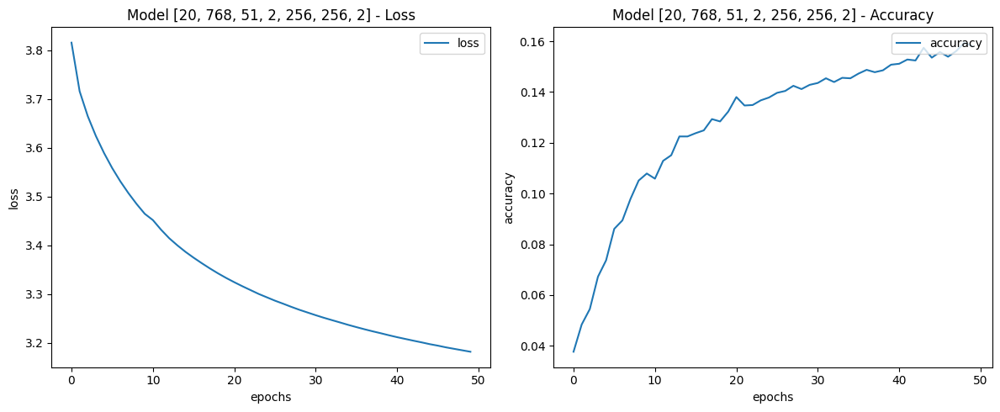

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1843 - loss: 3.1131
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
Testing Transformer_Dense_FeatureResnet Layers.....
args:  [20, 768, 51, 4, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 51)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 51)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_56            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_56[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer3 (Functional) │ (None, 20, 256)        │        729,088 │ transformer2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer4 (Functional) │ (None, 20, 256)        │        729,088 │ transformer3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_13   │ (None, 256)            │              0 │ transformer4[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_42 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_113 (Dense)         │ (None, 51)             │         13,107 │ dropout_42[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_57            │ (None, 51)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_3             │ (None, 102)            │              0 │ dense_113[0][0],       │
│ (Concatenate)             │                        │                │ input_layer_57[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_114 (Dense)         │ (None, 51)             │          5,253 │ concatenate_3[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 3,065,784 (11.70 MB)

 Trainable params: 3,065,784 (11.70 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0337 - loss: 3.8522
Epoch 1: accuracy improved from -inf to 0.04084, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 51, 4, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 35s 11ms/step - accuracy: 0.0337 - loss: 3.8522 - val_accuracy: 0.0052 - val_loss: 3.7575
Epoch 2/50
1350/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0471 - loss: 3.7275
Epoch 2: accuracy improved from 0.04084 to 0.05007, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 51, 4, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.0471 - loss: 3.7274 - val_accuracy: 0.0000e+00 - val_loss: 3.7081
Epoch 3/50
1348/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0537 - loss: 3.6731
Epoch 3: accuracy improved from 0.05007 to 0.05340, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[2

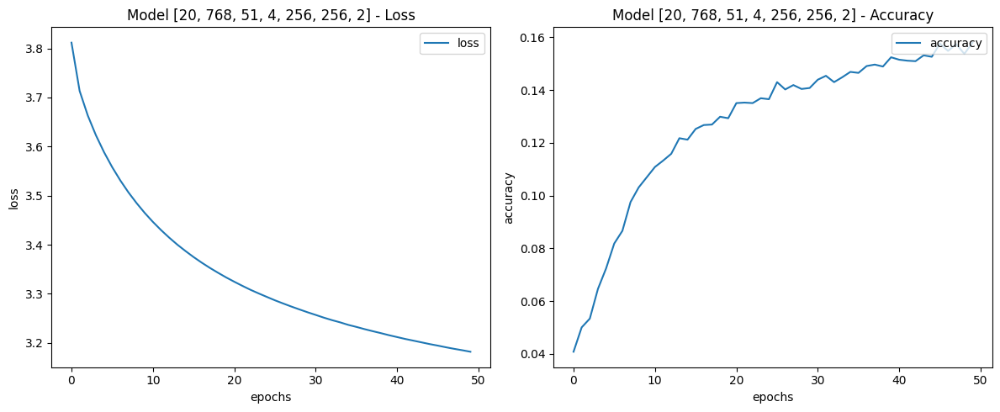

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1743 - loss: 3.1141
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step
Testing Transformer_Dense_FeatureResnet Input.....
args:  [20, 768, 51, 2, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 51)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 51)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_66            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_66[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_14   │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_45 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_121 (Dense)         │ (None, 51)             │         13,107 │ dropout_45[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_67            │ (None, 51)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_4             │ (None, 102)            │              0 │ dense_121[0][0],       │
│ (Concatenate)             │                        │                │ input_layer_67[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_122 (Dense)         │ (None, 51)             │          5,253 │ concatenate_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,607,608 (6.13 MB)

 Trainable params: 1,607,608 (6.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0442 - loss: 3.8586
Epoch 1: accuracy improved from -inf to 0.04638, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - accuracy: 0.0442 - loss: 3.8585 - val_accuracy: 0.0074 - val_loss: 3.7542
Epoch 2/50
1351/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0506 - loss: 3.7277
Epoch 2: accuracy improved from 0.04638 to 0.04952, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.0506 - loss: 3.7276 - val_accuracy: 0.0059 - val_loss: 3.7016
Epoch 3/50
1347/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0555 - loss: 3.6691
Epoch 3: accuracy improved from 0.04952 to 0.05691, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 

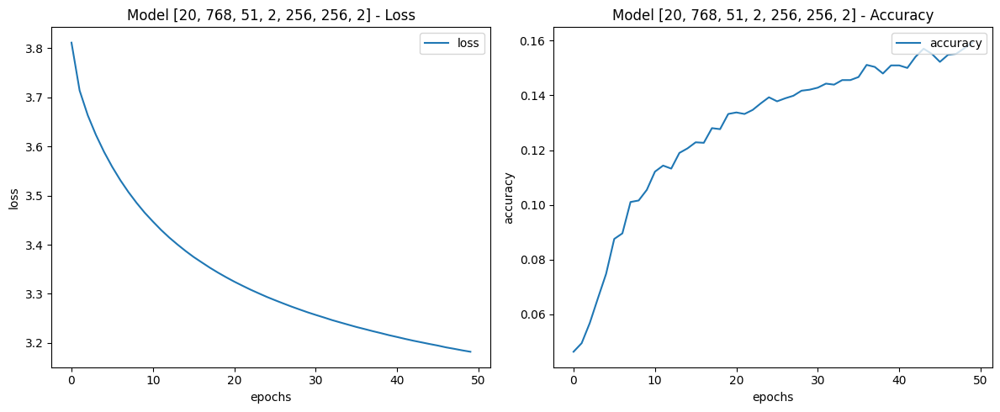

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1765 - loss: 3.1194
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
Testing Transformer_Dense_FeatureResnet Input.....
args:  [20, 768, 51, 2, 512, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 51)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 51)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_72            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 512)        │      2,768,640 │ input_layer_72[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 512)        │      2,637,568 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_15   │ (None, 512)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_48 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_129 (Dense)         │ (None, 51)             │         26,163 │ dropout_48[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_73            │ (None, 51)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_5             │ (None, 102)            │              0 │ dense_129[0][0],       │
│ (Concatenate)             │                        │                │ input_layer_73[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_130 (Dense)         │ (None, 51)             │          5,253 │ concatenate_5[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 5,437,624 (20.74 MB)

 Trainable params: 5,437,624 (20.74 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1352/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0398 - loss: 3.8652
Epoch 1: accuracy improved from -inf to 0.04398, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 51, 2, 512, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 27s 11ms/step - accuracy: 0.0398 - loss: 3.8651 - val_accuracy: 0.0000e+00 - val_loss: 3.7713
Epoch 2/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0474 - loss: 3.7271
Epoch 2: accuracy improved from 0.04398 to 0.04693, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 51, 2, 512, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 13s 9ms/step - accuracy: 0.0474 - loss: 3.7270 - val_accuracy: 0.0000e+00 - val_loss: 3.7049
Epoch 3/50
1348/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0460 - loss: 3.6715
Epoch 3: accuracy improved from 0.04693 to 0.05229, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[

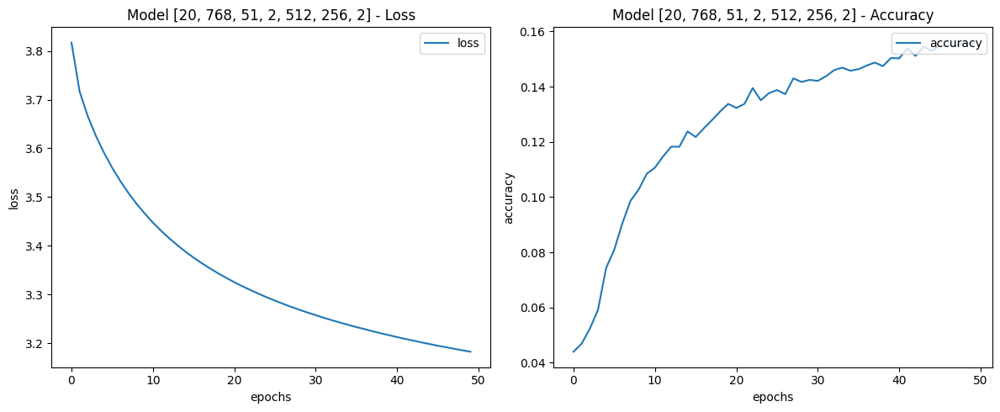

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1898 - loss: 3.1104
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
Testing Transformer_Dense_FeatureResnet Internal.....
args:  [20, 768, 51, 2, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 51)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 51)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_78            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_78[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_16   │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_51 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_137 (Dense)         │ (None, 51)             │         13,107 │ dropout_51[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_79            │ (None, 51)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_6             │ (None, 102)            │              0 │ dense_137[0][0],       │
│ (Concatenate)             │                        │                │ input_layer_79[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_138 (Dense)         │ (None, 51)             │          5,253 │ concatenate_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,607,608 (6.13 MB)

 Trainable params: 1,607,608 (6.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1352/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0355 - loss: 3.8595
Epoch 1: accuracy improved from -inf to 0.04084, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 22s 8ms/step - accuracy: 0.0355 - loss: 3.8595 - val_accuracy: 0.0000e+00 - val_loss: 3.7768
Epoch 2/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0448 - loss: 3.7291
Epoch 2: accuracy improved from 0.04084 to 0.04749, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.0448 - loss: 3.7290 - val_accuracy: 0.0000e+00 - val_loss: 3.7111
Epoch 3/50
1341/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0525 - loss: 3.6728
Epoch 3: accuracy improved from 0.04749 to 0.05414, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_In

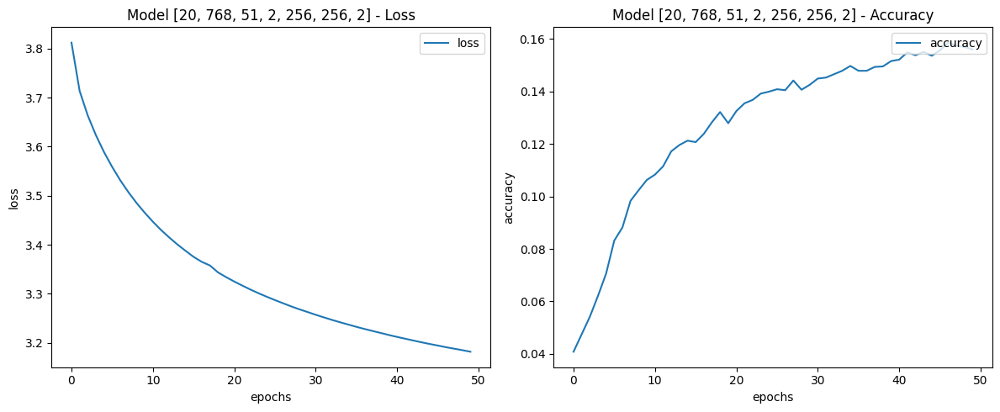

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1846 - loss: 3.1138
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
Testing Transformer_Dense_FeatureResnet Internal.....
args:  [20, 768, 51, 2, 256, 512, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 51)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 51)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_84            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        991,488 │ input_layer_84[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        860,416 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_17   │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_54 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_145 (Dense)         │ (None, 51)             │         13,107 │ dropout_54[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_85            │ (None, 51)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_7             │ (None, 102)            │              0 │ dense_145[0][0],       │
│ (Concatenate)             │                        │                │ input_layer_85[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_146 (Dense)         │ (None, 51)             │          5,253 │ concatenate_7[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,870,264 (7.13 MB)

 Trainable params: 1,870,264 (7.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1344/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0357 - loss: 3.8598
Epoch 1: accuracy improved from -inf to 0.04250, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[20, 768, 51, 2, 256, 512, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 23s 8ms/step - accuracy: 0.0357 - loss: 3.8595 - val_accuracy: 0.0015 - val_loss: 3.7642
Epoch 2/50
1352/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0469 - loss: 3.7268
Epoch 2: accuracy improved from 0.04250 to 0.04952, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[20, 768, 51, 2, 256, 512, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.0469 - loss: 3.7267 - val_accuracy: 0.0111 - val_loss: 3.7061
Epoch 3/50
1346/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0529 - loss: 3.6740
Epoch 3: accuracy improved from 0.04952 to 0.05562, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[2

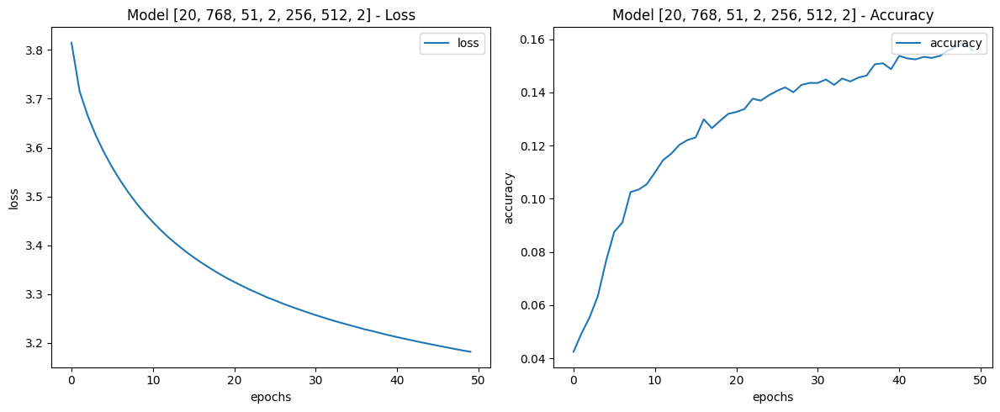

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1748 - loss: 3.1201
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step
Testing Transformer_Dense_FeatureResnet Attention.....
args:  [20, 768, 51, 2, 256, 256, 1]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 51)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 51)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_90            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        597,248 │ input_layer_90[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        466,176 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_18   │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_57 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_153 (Dense)         │ (None, 51)             │         13,107 │ dropout_57[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_91            │ (None, 51)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_8             │ (None, 102)            │              0 │ dense_153[0][0],       │
│ (Concatenate)             │                        │                │ input_layer_91[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_154 (Dense)         │ (None, 51)             │          5,253 │ concatenate_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,081,784 (4.13 MB)

 Trainable params: 1,081,784 (4.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1350/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0324 - loss: 3.8602
Epoch 1: accuracy improved from -inf to 0.04047, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 51, 2, 256, 256, 1].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 23s 8ms/step - accuracy: 0.0324 - loss: 3.8601 - val_accuracy: 0.0037 - val_loss: 3.7506
Epoch 2/50
1346/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0461 - loss: 3.7254
Epoch 2: accuracy improved from 0.04047 to 0.05007, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 51, 2, 256, 256, 1].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.0462 - loss: 3.7253 - val_accuracy: 7.3910e-04 - val_loss: 3.7054
Epoch 3/50
1352/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0471 - loss: 3.6727
Epoch 3: accuracy improved from 0.05007 to 0.05377, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Atten

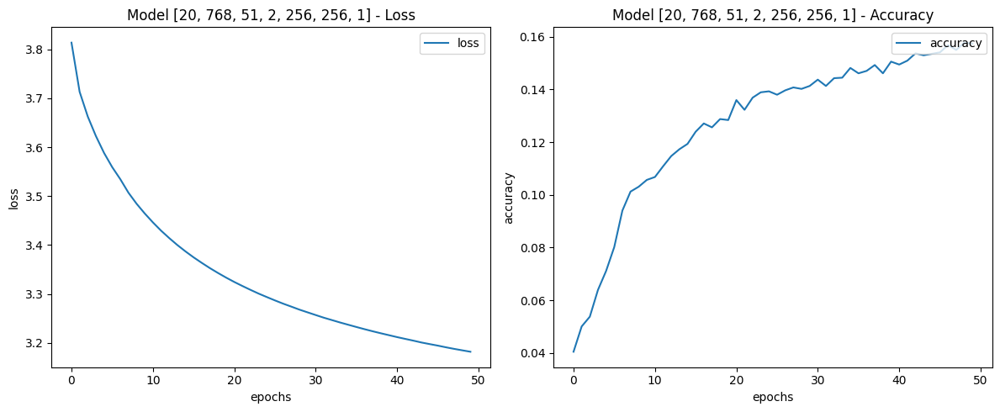

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1731 - loss: 3.1191
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
Testing Transformer_Dense_FeatureResnet Attention.....
args:  [20, 768, 51, 2, 256, 256, 2]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 51)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 51)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_96            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_96[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_19   │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_60 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_161 (Dense)         │ (None, 51)             │         13,107 │ dropout_60[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_97            │ (None, 51)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_9             │ (None, 102)            │              0 │ dense_161[0][0],       │
│ (Concatenate)             │                        │                │ input_layer_97[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_162 (Dense)         │ (None, 51)             │          5,253 │ concatenate_9[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,607,608 (6.13 MB)

 Trainable params: 1,607,608 (6.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0309 - loss: 3.8712
Epoch 1: accuracy improved from -inf to 0.03991, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 22s 8ms/step - accuracy: 0.0309 - loss: 3.8712 - val_accuracy: 0.0089 - val_loss: 3.7594
Epoch 2/50
1344/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0504 - loss: 3.7291
Epoch 2: accuracy improved from 0.03991 to 0.05007, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 51, 2, 256, 256, 2].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 14s 7ms/step - accuracy: 0.0504 - loss: 3.7290 - val_accuracy: 0.0044 - val_loss: 3.7052
Epoch 3/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0476 - loss: 3.6777
Epoch 3: accuracy improved from 0.05007 to 0.05377, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attentio

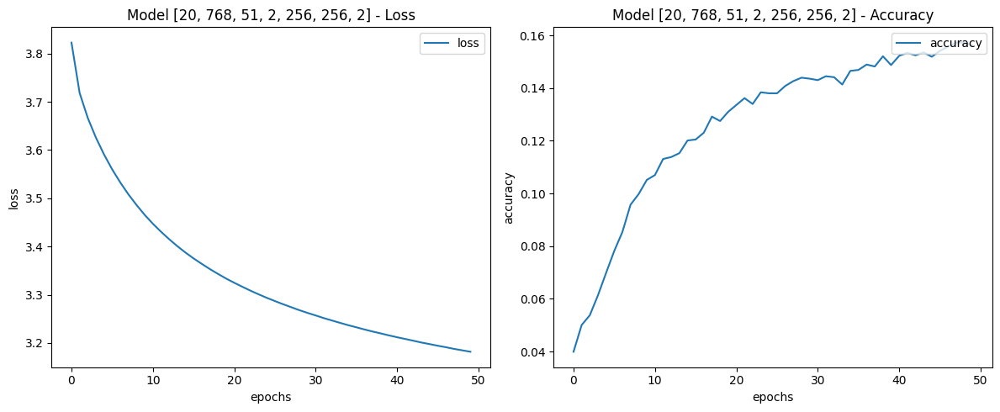

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1808 - loss: 3.1150
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step
Testing Transformer_Dense_FeatureResnet Attention.....
args:  [20, 768, 51, 2, 256, 256, 4]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
feat_train2 (5412, 51)
lab_train (5412, 51)
lab_train2 (5412, 51)
feat_test (1353, 20, 768)
feat_test2 (1353, 51)
lab_test (1353, 51)
lab_test2 (1353, 51)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_102           │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │      1,385,984 │ input_layer_102[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │      1,254,912 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_20   │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_63 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_169 (Dense)         │ (None, 51)             │         13,107 │ dropout_63[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_103           │ (None, 51)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_10            │ (None, 102)            │              0 │ dense_169[0][0],       │
│ (Concatenate)             │                        │                │ input_layer_103[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_170 (Dense)         │ (None, 51)             │          5,253 │ concatenate_10[0][0]   │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,659,256 (10.14 MB)

 Trainable params: 2,659,256 (10.14 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1345/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0338 - loss: 3.8591
Epoch 1: accuracy improved from -inf to 0.04213, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 51, 2, 256, 256, 4].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 26s 9ms/step - accuracy: 0.0339 - loss: 3.8588 - val_accuracy: 0.0044 - val_loss: 3.7693
Epoch 2/50
1343/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0520 - loss: 3.7216
Epoch 2: accuracy improved from 0.04213 to 0.05377, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 51, 2, 256, 256, 4].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.0520 - loss: 3.7215 - val_accuracy: 7.3910e-04 - val_loss: 3.7032
Epoch 3/50
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0621 - loss: 3.6701
Epoch 3: accuracy improved from 0.05377 to 0.05783, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Atten

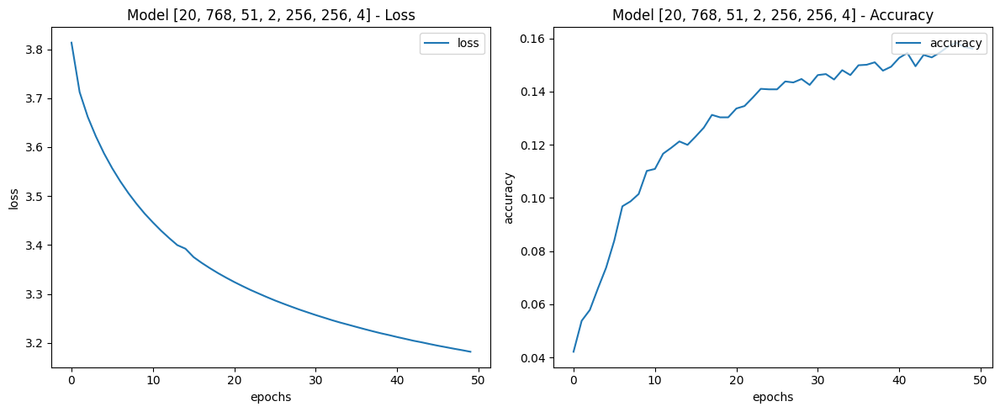

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1788 - loss: 3.1177
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step


In [ ]:
import os
import time
import json
import psutil
import numpy as np

MODELS = {'Transformer_Dense_FeatureResnet': Transformer_Dense_FeatureResnet
          }

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test_2feat(features, features2, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel2(features, features2, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'/content/drive/MyDrive/model_save2/{model_test}')
        np.save(f'/content/drive/MyDrive/np_save2/{model_test}', predictions)

    del predictions

    return history

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features5']))
features2 = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features7'])) #2 hoặc 4

labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels2']))
(_,sequence_length, image_size) = features.shape

print(f"Features: {features.shape}")

for model_type in config['Tests4']: # ban đầu là 'Tests3'
    for test in config['Tests4'][model_type]: # ban đầu là 'Tests3'
        for val in config['Tests4'][model_type][test]: # ban đầu là 'Tests3'
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            store_val = defaults[test]
            defaults[test] = val
            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories2']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print('args: ', args)

            model = MODELS[model_type](*args)

            history = run_test_2feat(features, features2, labels, model, model_type, test, val, model_type, test, arg = args)
            defaults[test] = store_val

            del model


# **Test Model ViT-LSTM**

Features: (6765, 20, 768)
Testing LSTM Layers.....
dong1 {'Layers': 1, 'Units': 128}
dong2 1
dong3 1
[20, 768, 51, 1, 128]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 128)                 │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 51)                  │           6,579 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 465,843 (1.78 MB)

 Trainable params: 465,843 (1.78 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1349/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0639 - loss: 3.7529
Epoch 1: accuracy improved from -inf to 0.08149, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 51, 1, 128].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.0640 - loss: 3.7524 - val_accuracy: 0.1449 - val_loss: 3.3076
Epoch 2/50
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1382 - loss: 3.2801
Epoch 2: accuracy improved from 0.08149 to 0.15004, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 51, 1, 128].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.1382 - loss: 3.2801 - val_accuracy: 0.2158 - val_loss: 2.9690
Epoch 3/50
1341/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2133 - loss: 2.9994
Epoch 3: accuracy improved from 0.15004 to 0.21508, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 51, 1, 128].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.2133 - loss: 2.9993 

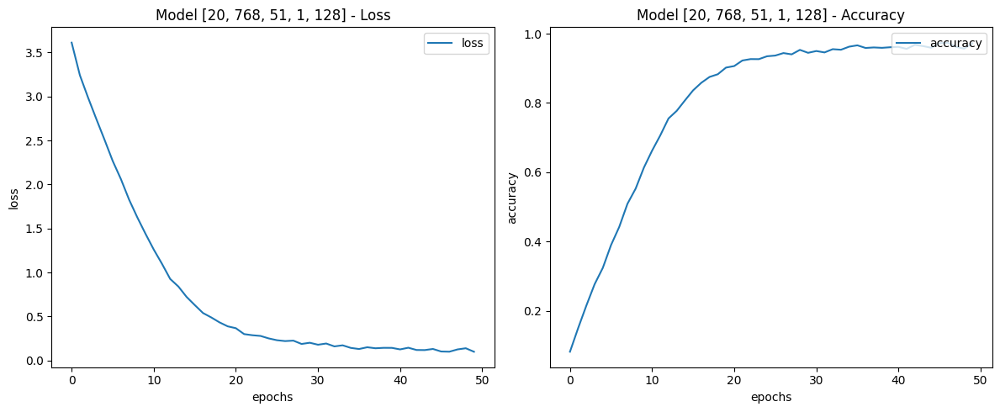

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9976 - loss: 0.0213
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Testing LSTM Layers.....
dong1 {'Layers': 1, 'Units': 128}
dong2 1
dong3 2
[20, 768, 51, 2, 128]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 20, 128)             │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 20, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 128)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 51)                  │           6,579 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 597,427 (2.28 MB)

 Trainable params: 597,427 (2.28 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1345/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0558 - loss: 3.7632
Epoch 1: accuracy improved from -inf to 0.06652, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 51, 2, 128].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - accuracy: 0.0558 - loss: 3.7624 - val_accuracy: 0.1205 - val_loss: 3.3649
Epoch 2/50
1346/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1086 - loss: 3.3833
Epoch 2: accuracy improved from 0.06652 to 0.12029, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 51, 2, 128].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.1087 - loss: 3.3829 - val_accuracy: 0.2432 - val_loss: 3.0381
Epoch 3/50
1351/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1660 - loss: 3.1142
Epoch 3: accuracy improved from 0.12029 to 0.16870, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 51, 2, 128].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.1660 - loss: 3.114

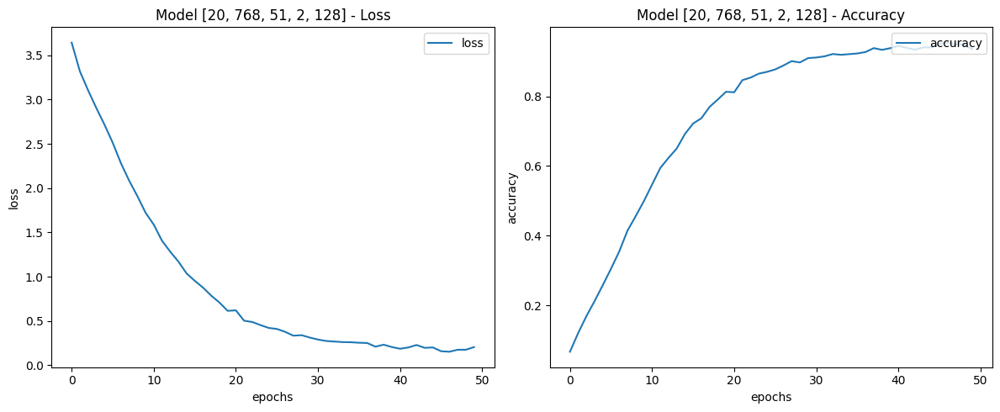

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9719 - loss: 0.0973
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Testing LSTM Layers.....
dong1 {'Layers': 1, 'Units': 128}
dong2 1
dong3 4
[20, 768, 51, 4, 128]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 20, 128)             │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 20, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 20, 128)             │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 20, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 20, 128)             │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 20, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_6 (LSTM)                        │ (None, 128)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 51)                  │           6,579 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 860,595 (3.28 MB)

 Trainable params: 860,595 (3.28 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1348/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.0276 - loss: 3.8424
Epoch 1: accuracy improved from -inf to 0.03788, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 51, 4, 128].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 19s 12ms/step - accuracy: 0.0277 - loss: 3.8421 - val_accuracy: 0.0850 - val_loss: 3.6186
Epoch 2/50
1348/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.0564 - loss: 3.6185
Epoch 2: accuracy improved from 0.03788 to 0.05728, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 51, 4, 128].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 16s 12ms/step - accuracy: 0.0564 - loss: 3.6185 - val_accuracy: 0.1360 - val_loss: 3.4374
Epoch 3/50
1351/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.0630 - loss: 3.5066
Epoch 3: accuracy improved from 0.05728 to 0.06800, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 51, 4, 128].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 20s 12ms/step - accuracy: 0.0630 - loss:

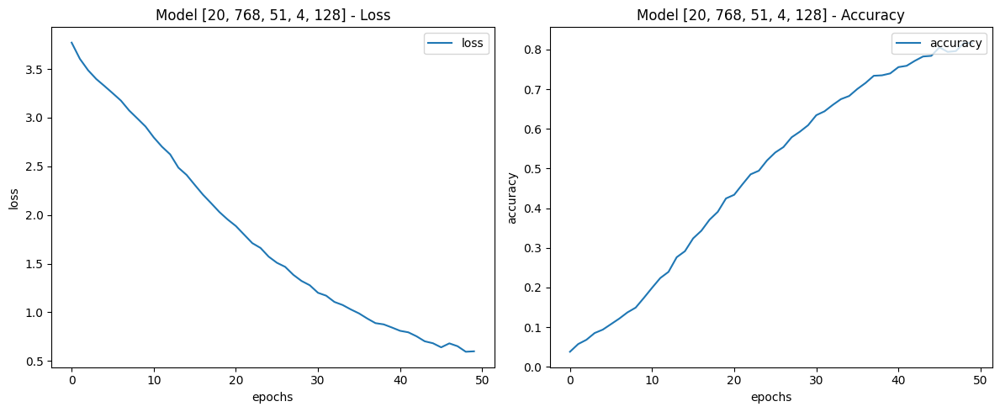

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9145 - loss: 0.2683
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
Testing LSTM Units.....
dong1 {'Layers': 1, 'Units': 128}
dong2 128
dong3 128
[20, 768, 51, 1, 128]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 128)                 │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 51)                  │           6,579 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 465,843 (1.78 MB)

 Trainable params: 465,843 (1.78 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1351/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0497 - loss: 3.7660
Epoch 1: accuracy improved from -inf to 0.06966, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 51, 1, 128].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.0497 - loss: 3.7657 - val_accuracy: 0.2210 - val_loss: 3.1906
Epoch 2/50
1343/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1509 - loss: 3.2701
Epoch 2: accuracy improved from 0.06966 to 0.16038, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 51, 1, 128].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.1510 - loss: 3.2698 - val_accuracy: 0.2129 - val_loss: 3.0009
Epoch 3/50
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2225 - loss: 2.9613
Epoch 3: accuracy improved from 0.16038 to 0.22302, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 51, 1, 128].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.2225 - loss: 2.9613 - v

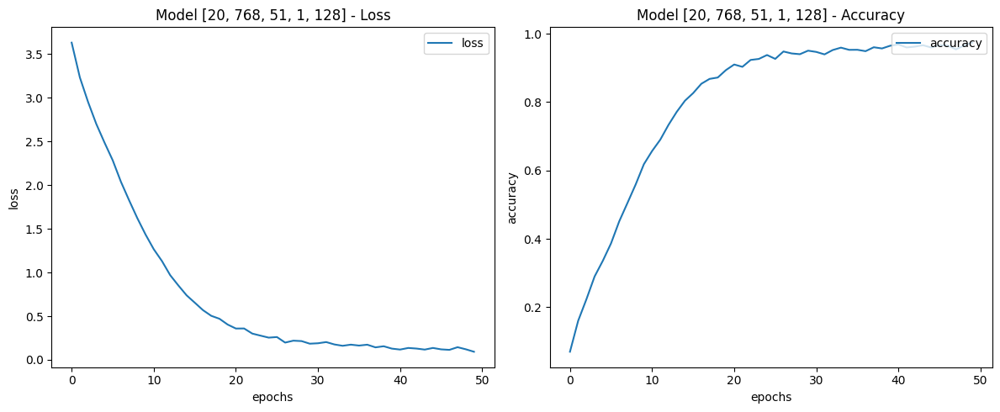

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9976 - loss: 0.0142
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Testing LSTM Units.....
dong1 {'Layers': 1, 'Units': 128}
dong2 128
dong3 256
[20, 768, 51, 1, 256]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_8 (LSTM)                        │ (None, 256)                 │       1,049,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 51)                  │          13,107 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,062,707 (4.05 MB)

 Trainable params: 1,062,707 (4.05 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1348/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0632 - loss: 3.7318
Epoch 1: accuracy improved from -inf to 0.08684, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 51, 1, 256].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.0633 - loss: 3.7311 - val_accuracy: 0.1367 - val_loss: 3.1304
Epoch 2/50
1352/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1726 - loss: 3.1639
Epoch 2: accuracy improved from 0.08684 to 0.17794, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 51, 1, 256].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.1726 - loss: 3.1638 - val_accuracy: 0.3193 - val_loss: 2.7745
Epoch 3/50
1352/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2588 - loss: 2.8469
Epoch 3: accuracy improved from 0.17794 to 0.25684, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 51, 1, 256].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.2588 - loss: 2.8469 - 

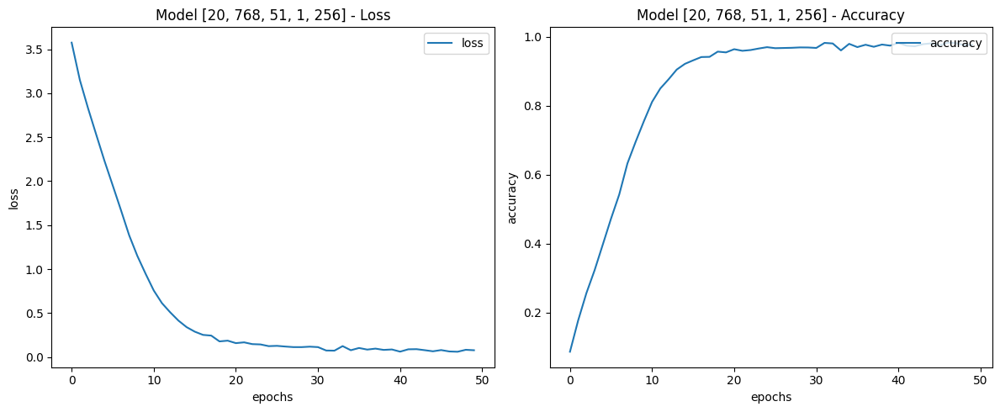

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9973 - loss: 0.0145
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Testing LSTM Units.....
dong1 {'Layers': 1, 'Units': 128}
dong2 128
dong3 512
[20, 768, 51, 1, 512]
all_video 6765
count_test 1353
count_train 5412
feat_train (5412, 20, 768)
lab_train (5412, 51)
feat_test (1353, 20, 768)
lab_test (1353, 51)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_9 (LSTM)                        │ (None, 512)                 │       2,623,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 51)                  │          26,163 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,649,651 (10.11 MB)

 Trainable params: 2,649,651 (10.11 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1350/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0674 - loss: 3.7271
Epoch 1: accuracy improved from -inf to 0.09313, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 51, 1, 512].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 12s 8ms/step - accuracy: 0.0674 - loss: 3.7266 - val_accuracy: 0.2683 - val_loss: 2.9406
Epoch 2/50
1346/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1701 - loss: 3.1394
Epoch 2: accuracy improved from 0.09313 to 0.18385, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 51, 1, 512].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.1702 - loss: 3.1391 - val_accuracy: 0.2343 - val_loss: 2.8699
Epoch 3/50
1350/1353 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.2593 - loss: 2.7526
Epoch 3: accuracy improved from 0.18385 to 0.25813, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 51, 1, 512].keras
1353/1353 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.2593 - loss: 2.7527 -

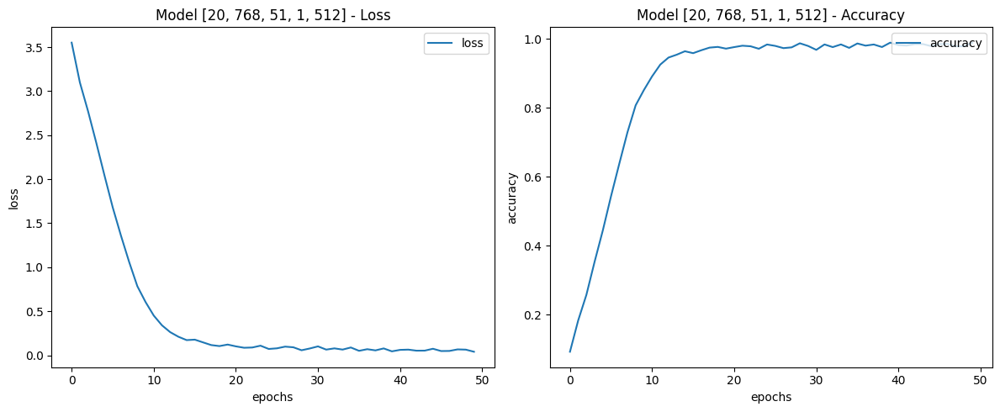

__________________________________________________
Evaluate
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9959 - loss: 0.0185
__________
339/339 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
import os
import time
import json
import psutil
import numpy as np

MODELS = {'LSTM': LSTM_Model}

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test(features, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel(features, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'Models/{model_test}')
        np.save(f'Predictions/{model_test}', predictions)

    del predictions
    return history


features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features5']))
labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels2']))
(_,sequence_length, image_size) = features.shape
print(f"Features: {features.shape}")

for model_type in config['Tests1']:
    for test in config['Tests1'][model_type]:
        for val in config['Tests1'][model_type][test]:
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            print('dong1', defaults)

            store_val = defaults[test]
            print('dong2', store_val)

            defaults[test] = val
            print('dong3', defaults[test])

            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories2']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print(args)

            model = MODELS[model_type](*args)

            history = run_test(features, labels, model, model_type, test, val, model_type, test, args)
            defaults[test] = store_val

            del model


# **UCF101**

# **Test Model ViT-ReT**

Features: (13320, 20, 768)
Testing Transformer Layers.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 1
[20, 768, 101, 1, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_1               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 101)                 │          25,957 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 886,117 (3.38 MB)

 Trainable params: 886,117 (3.38 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2655/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0623 - loss: 4.3669
Epoch 1: accuracy improved from -inf to 0.08925, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 101, 1, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 23s 4ms/step - accuracy: 0.0624 - loss: 4.3656 - val_accuracy: 0.0848 - val_loss: 3.8345
Epoch 2/50
2649/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1406 - loss: 3.4978
Epoch 2: accuracy improved from 0.08925 to 0.15691, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 101, 1, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 12s 4ms/step - accuracy: 0.1407 - loss: 3.4973 - val_accuracy: 0.1967 - val_loss: 3.3309
Epoch 3/50
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1950 - loss: 3.1952
Epoch 3: accuracy improved from 0.15691 to 0.19698, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 101, 1, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━

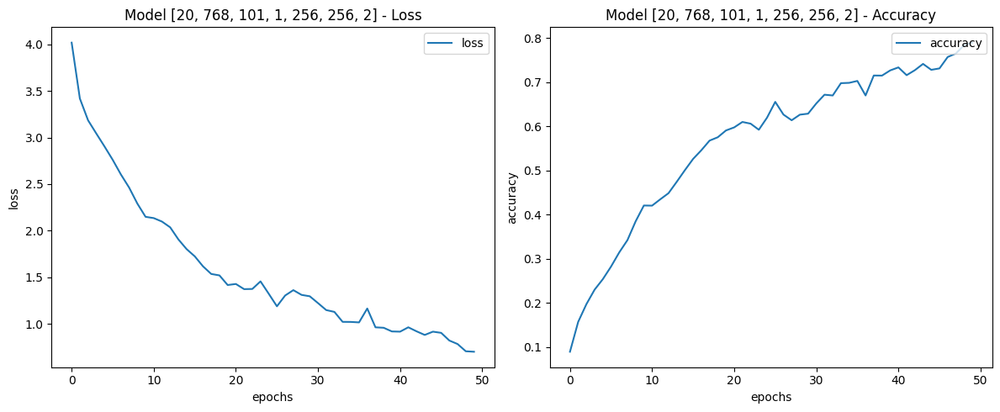

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6473 - loss: 1.3046
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Layers.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 2
[20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_4 (Encoder)                  │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_2               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 101)                 │          25,957 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,544,293 (5.89 MB)

 Trainable params: 1,544,293 (5.89 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2662/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0195 - loss: 4.6859
Epoch 1: accuracy improved from -inf to 0.02252, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 24s 5ms/step - accuracy: 0.0195 - loss: 4.6857 - val_accuracy: 0.0000e+00 - val_loss: 4.4733
Epoch 2/50
2658/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0269 - loss: 4.3546
Epoch 2: accuracy improved from 0.02252 to 0.02609, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 12s 4ms/step - accuracy: 0.0269 - loss: 4.3546 - val_accuracy: 0.0372 - val_loss: 4.2812
Epoch 3/50
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0306 - loss: 4.2685
Epoch 3: accuracy improved from 0.02609 to 0.02806, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━

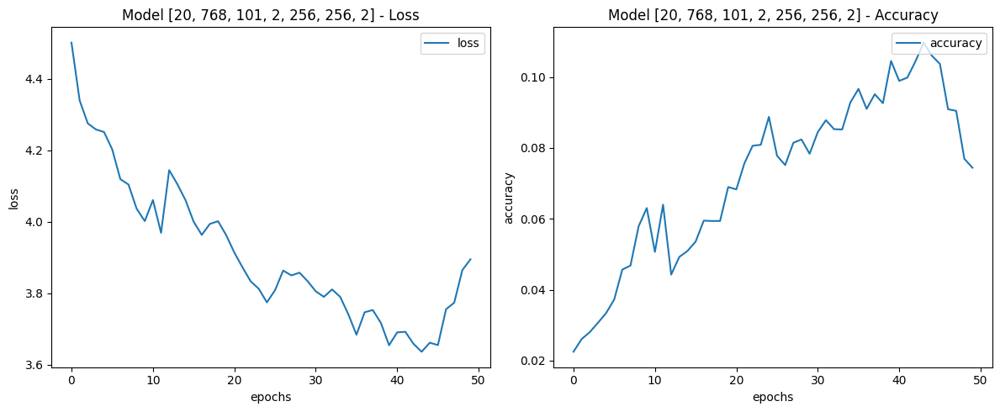

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0611 - loss: 3.9531
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
Testing Transformer Layers.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 4
[20, 768, 101, 4, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_6 (Encoder)                  │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_7 (Encoder)                  │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_8 (Encoder)                  │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_3               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 101)                 │          25,957 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,860,645 (10.91 MB)

 Trainable params: 2,860,645 (10.91 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2660/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0145 - loss: 4.7491
Epoch 1: accuracy improved from -inf to 0.01304, saving model to /content/drive/MyDrive/all_model/Transformer_Layers_[20, 768, 101, 4, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 42s 9ms/step - accuracy: 0.0145 - loss: 4.7488 - val_accuracy: 0.0000e+00 - val_loss: 4.5207
Epoch 2/50
2660/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0119 - loss: 4.4563
Epoch 2: accuracy did not improve from 0.01304
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - accuracy: 0.0119 - loss: 4.4562 - val_accuracy: 0.0000e+00 - val_loss: 4.4480
Epoch 3/50
2661/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0125 - loss: 4.4090
Epoch 3: accuracy did not improve from 0.01304
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.0125 - loss: 4.4090 - val_accuracy: 0.0000e+00 - val_loss: 4.3595
Epoch 4/50
2656/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0136 - loss: 4.3912
Epoch 4: accuracy improved f

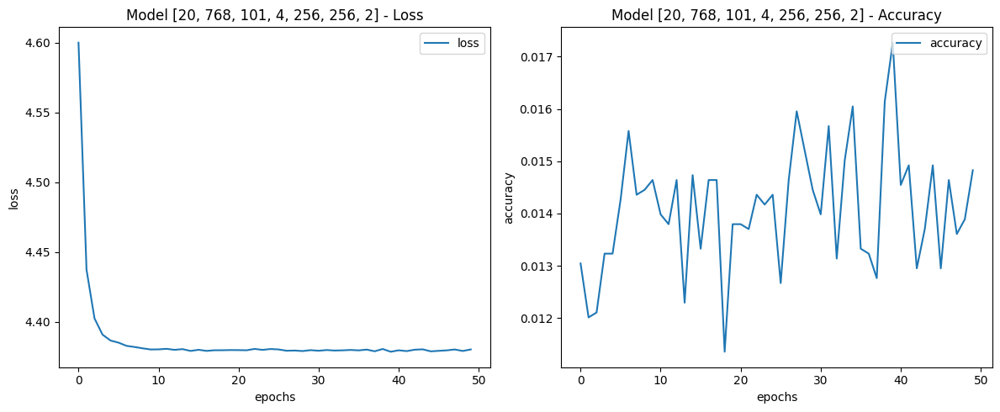

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0000e+00 - loss: 4.3536
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
Testing Transformer Input.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 256
dong3 256
[20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_10 (Encoder)                 │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_4               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 101)                 │          25,957 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,544,293 (5.89 MB)

 Trainable params: 1,544,293 (5.89 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0197 - loss: 4.7100
Epoch 1: accuracy improved from -inf to 0.02121, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 24s 5ms/step - accuracy: 0.0197 - loss: 4.7096 - val_accuracy: 0.0000e+00 - val_loss: 4.4219
Epoch 2/50
2657/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0259 - loss: 4.3507
Epoch 2: accuracy improved from 0.02121 to 0.02609, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.0259 - loss: 4.3508 - val_accuracy: 0.0000e+00 - val_loss: 4.4508
Epoch 3/50
2651/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0249 - loss: 4.3369
Epoch 3: accuracy improved from 0.02609 to 0.02787, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━

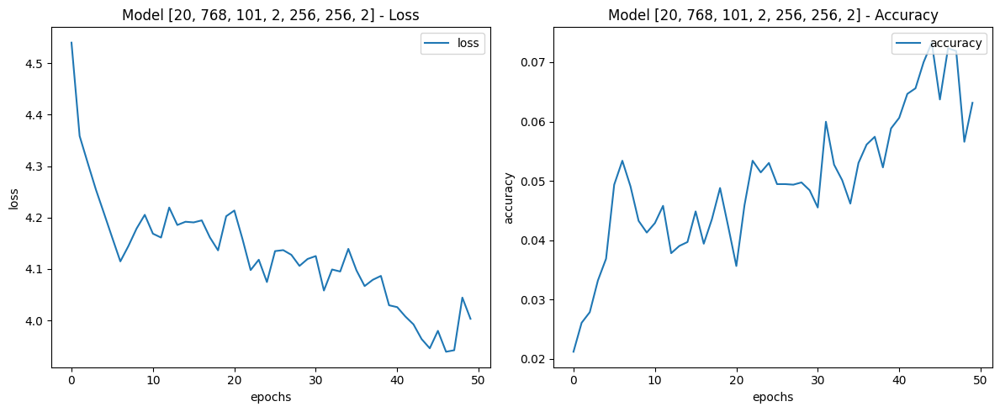

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0306 - loss: 5.1052
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Input.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 256
dong3 512
[20, 768, 101, 2, 512, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 512)             │       2,768,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_12 (Encoder)                 │ (None, 20, 512)             │       2,364,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_5               │ (None, 512)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_18 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_37 (Dense)                     │ (None, 101)                 │          51,813 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,185,125 (19.78 MB)

 Trainable params: 5,185,125 (19.78 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2654/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0117 - loss: 4.9523
Epoch 1: accuracy improved from -inf to 0.01417, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 101, 2, 512, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 29s 7ms/step - accuracy: 0.0117 - loss: 4.9513 - val_accuracy: 0.0000e+00 - val_loss: 4.7577
Epoch 2/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0149 - loss: 4.4533
Epoch 2: accuracy improved from 0.01417 to 0.01558, saving model to /content/drive/MyDrive/all_model/Transformer_Input_[20, 768, 101, 2, 512, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.0149 - loss: 4.4533 - val_accuracy: 0.0000e+00 - val_loss: 5.0433
Epoch 3/50
2663/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0156 - loss: 4.4075
Epoch 3: accuracy did not improve from 0.01558
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.0156 - loss: 4.4075 - val_accuracy: 0.0000e+00 - val_loss: 4.8176
Epoch 4/

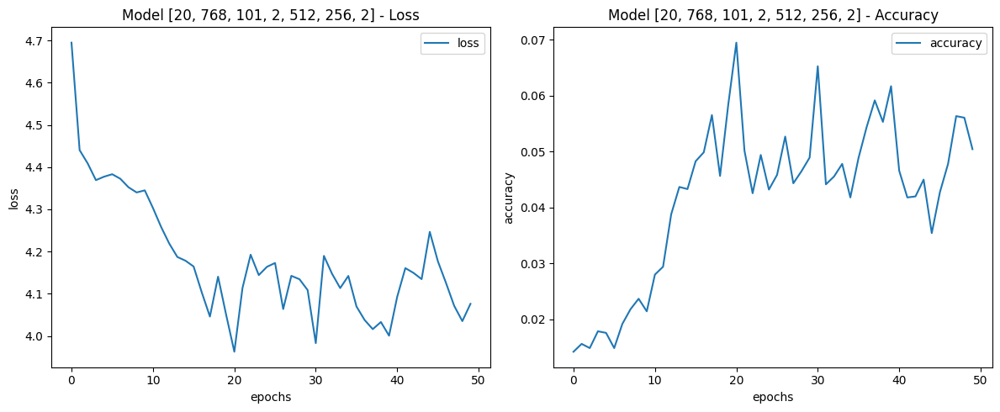

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0521 - loss: 4.4139
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Internal.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 256
dong3 256
[20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_25 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_14 (Encoder)                 │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_6               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_21 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_43 (Dense)                     │ (None, 101)                 │          25,957 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,544,293 (5.89 MB)

 Trainable params: 1,544,293 (5.89 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2662/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0126 - loss: 4.7393
Epoch 1: accuracy improved from -inf to 0.01351, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 25s 6ms/step - accuracy: 0.0126 - loss: 4.7392 - val_accuracy: 0.0563 - val_loss: 4.4473
Epoch 2/50
2662/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0180 - loss: 4.4299
Epoch 2: accuracy improved from 0.01351 to 0.01830, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.0180 - loss: 4.4299 - val_accuracy: 0.0000e+00 - val_loss: 4.6539
Epoch 3/50
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0229 - loss: 4.3436
Epoch 3: accuracy improved from 0.01830 to 0.02252, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━

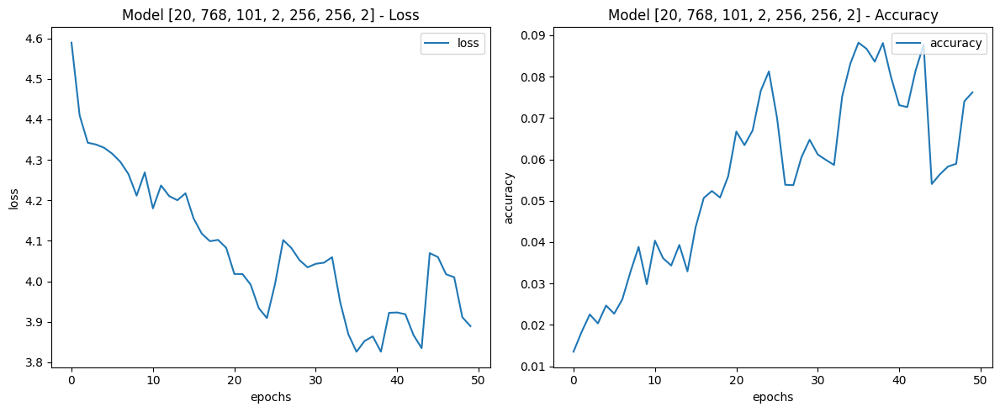

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.0025 - loss: 4.8765
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Internal.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 256
dong3 512
[20, 768, 101, 2, 256, 512, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_29 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         991,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_16 (Encoder)                 │ (None, 20, 256)             │         789,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_7               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_24 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_49 (Dense)                     │ (None, 101)                 │          25,957 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,806,949 (6.89 MB)

 Trainable params: 1,806,949 (6.89 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2653/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0157 - loss: 4.7240
Epoch 1: accuracy improved from -inf to 0.01764, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 101, 2, 256, 512, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 27s 6ms/step - accuracy: 0.0157 - loss: 4.7232 - val_accuracy: 0.0000e+00 - val_loss: 4.4853
Epoch 2/50
2655/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0181 - loss: 4.3714
Epoch 2: accuracy improved from 0.01764 to 0.02036, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 101, 2, 256, 512, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 33s 5ms/step - accuracy: 0.0181 - loss: 4.3713 - val_accuracy: 0.0000e+00 - val_loss: 4.3241
Epoch 3/50
2652/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0241 - loss: 4.3214
Epoch 3: accuracy improved from 0.02036 to 0.02581, saving model to /content/drive/MyDrive/all_model/Transformer_Internal_[20, 768, 101, 2, 256, 512, 2].keras
2664/2664 ━━━━

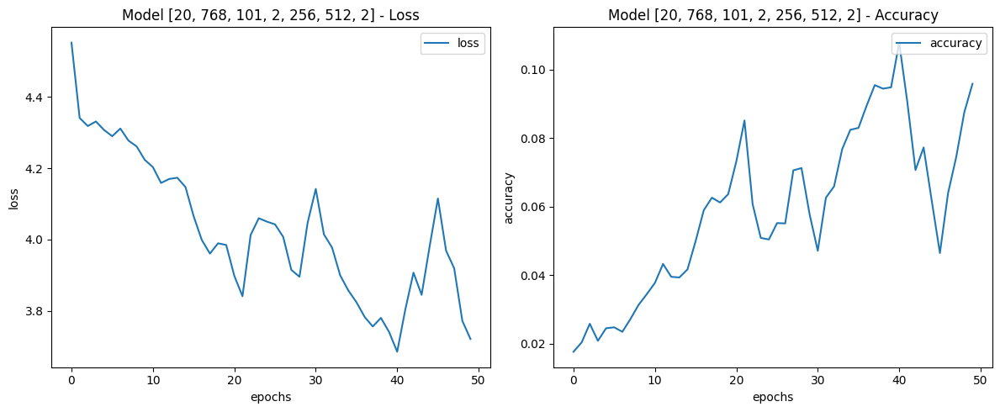

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 8.3779e-04 - loss: 4.7076
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
Testing Transformer Attention.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 1
[20, 768, 101, 2, 256, 256, 1]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_33 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         597,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_18 (Encoder)                 │ (None, 20, 256)             │         395,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_8               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_27 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_55 (Dense)                     │ (None, 101)                 │          25,957 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,018,469 (3.89 MB)

 Trainable params: 1,018,469 (3.89 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0180 - loss: 4.6843
Epoch 1: accuracy improved from -inf to 0.02355, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 101, 2, 256, 256, 1].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 25s 5ms/step - accuracy: 0.0181 - loss: 4.6842 - val_accuracy: 0.0541 - val_loss: 4.4596
Epoch 2/50
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0335 - loss: 4.3126
Epoch 2: accuracy improved from 0.02355 to 0.03322, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 101, 2, 256, 256, 1].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 14s 5ms/step - accuracy: 0.0335 - loss: 4.3126 - val_accuracy: 0.0852 - val_loss: 4.3115
Epoch 3/50
2658/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0445 - loss: 4.1759
Epoch 3: accuracy improved from 0.03322 to 0.04317, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 101, 2, 256, 256, 1].keras
2664/2664 ━━━━━━━━━

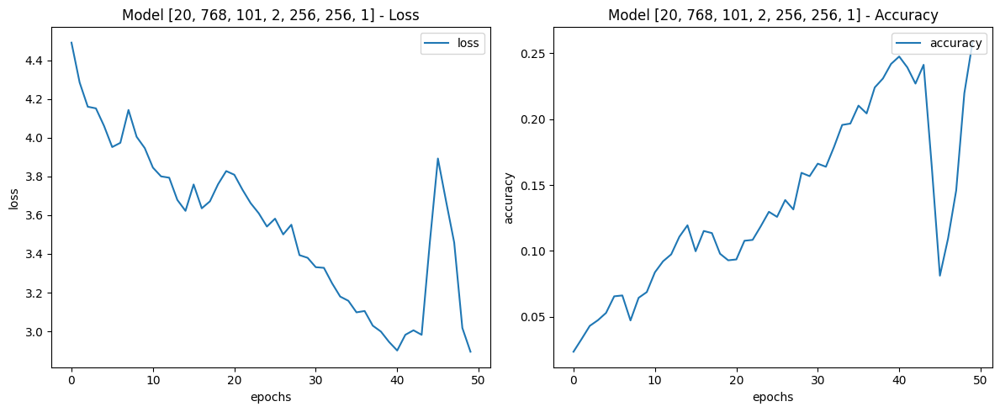

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0187 - loss: 4.2723
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Attention.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 2
[20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_37 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │         860,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_20 (Encoder)                 │ (None, 20, 256)             │         658,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_9               │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_30 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_61 (Dense)                     │ (None, 101)                 │          25,957 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,544,293 (5.89 MB)

 Trainable params: 1,544,293 (5.89 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2657/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0118 - loss: 4.7277
Epoch 1: accuracy improved from -inf to 0.01286, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 24s 6ms/step - accuracy: 0.0118 - loss: 4.7273 - val_accuracy: 0.0541 - val_loss: 4.4859
Epoch 2/50
2661/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0213 - loss: 4.4146
Epoch 2: accuracy improved from 0.01286 to 0.01961, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.0213 - loss: 4.4146 - val_accuracy: 0.0000e+00 - val_loss: 4.5918
Epoch 3/50
2654/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0174 - loss: 4.3689
Epoch 3: accuracy improved from 0.01961 to 0.02121, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━

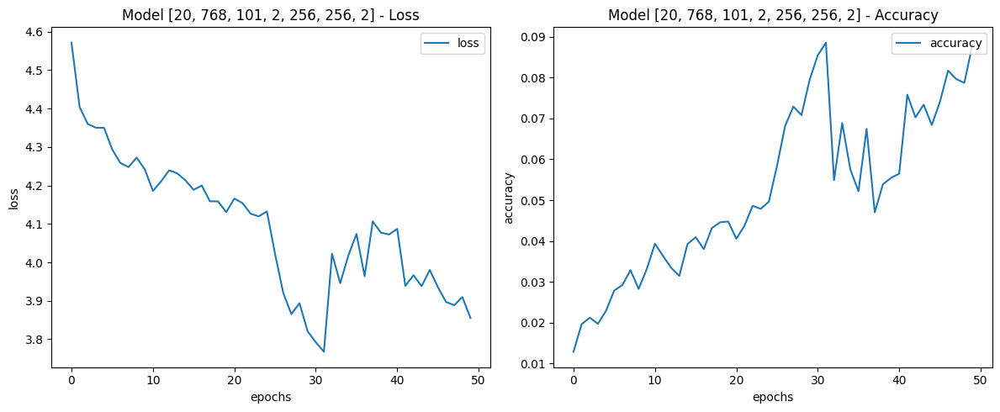

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0914 - loss: 4.5506
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer Attention.....
dong1 {'Layers': 2, 'Input': 256, 'Internal': 256, 'Attention': 2}
dong2 2
dong3 4
[20, 768, 101, 2, 256, 256, 4]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "Transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_41 (InputLayer)          │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer (Functional)             │ (None, 20, 256)             │       1,385,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder_22 (Encoder)                 │ (None, 20, 256)             │       1,184,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling1d_10              │ (None, 256)                 │               0 │
│ (GlobalMaxPooling1D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_33 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_67 (Dense)                     │ (None, 101)                 │          25,957 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,595,941 (9.90 MB)

 Trainable params: 2,595,941 (9.90 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2663/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0138 - loss: 4.7432
Epoch 1: accuracy improved from -inf to 0.01511, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 101, 2, 256, 256, 4].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 27s 6ms/step - accuracy: 0.0138 - loss: 4.7431 - val_accuracy: 0.0357 - val_loss: 4.2109
Epoch 2/50
2657/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0151 - loss: 4.4459
Epoch 2: accuracy did not improve from 0.01511
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.0151 - loss: 4.4459 - val_accuracy: 0.0011 - val_loss: 4.2798
Epoch 3/50
2651/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0189 - loss: 4.3619
Epoch 3: accuracy improved from 0.01511 to 0.02027, saving model to /content/drive/MyDrive/all_model/Transformer_Attention_[20, 768, 101, 2, 256, 256, 4].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 14s 5ms/step - accuracy: 0.0190 - loss: 4.3618 - val_accuracy: 0.0462 - val_loss: 4.3160
Epoch 4/50
2

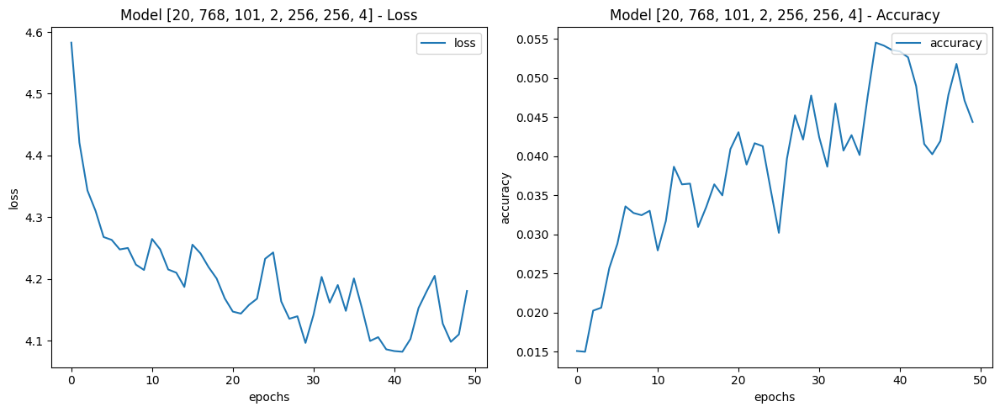

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.0735 - loss: 4.1388
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


In [ ]:
import os
import time
import json
import psutil
import numpy as np

MODELS = {'Transformer': Transformer_Model}

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test(features, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel(features, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'Models/{model_test}')
        np.save(f'Predictions/{model_test}', predictions)

    del predictions
    return history

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features9']))
labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels3']))
(_,sequence_length, image_size) = features.shape
print(f"Features: {features.shape}")

for model_type in config['Tests2']:
    for test in config['Tests2'][model_type]:
        for val in config['Tests2'][model_type][test]:
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            print('dong1', defaults)

            store_val = defaults[test]
            print('dong2', store_val)

            defaults[test] = val
            print('dong3', defaults[test])

            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories3']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print(args)

            model = MODELS[model_type](*args)

            history = run_test(features, labels, model, model_type, test, val, model_type, test, args)
            defaults[test] = store_val
            del model

# **Test Model Đề xuất**

Features: (13320, 20, 768)
Testing Transformer_FeatureResnet_Dense Layers.....
args:  [20, 768, 101, 1, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 20, 512)        │              0 │ transformer[0][0],     │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d      │ (None, 512)            │              0 │ concatenate[0][0]      │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 101)            │         51,813 │ dropout_1[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,436,517 (5.48 MB)

 Trainable params: 1,436,517 (5.48 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2664 - loss: 6.0479
Epoch 1: accuracy improved from -inf to 0.36655, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 101, 1, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 24s 6ms/step - accuracy: 0.2666 - loss: 6.0449 - val_accuracy: 0.5661 - val_loss: 2.7943
Epoch 2/50
2657/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5739 - loss: 2.5606
Epoch 2: accuracy improved from 0.36655 to 0.57395, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 101, 1, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 31s 4ms/step - accuracy: 0.5739 - loss: 2.5611 - val_accuracy: 0.6764 - val_loss: 1.7833
Epoch 3/50
2652/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6701 - loss: 2.2723
Epoch 3: accuracy improved from 0.57395 to 0.66366, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 

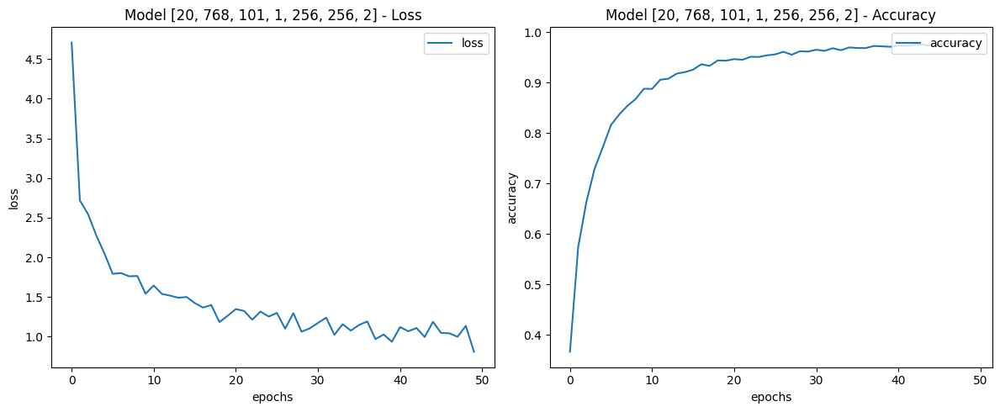

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9952 - loss: 0.1469
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer_FeatureResnet_Dense Layers.....
args:  [20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_5[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_1    │ (None, 512)            │              0 │ concatenate_1[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_12 (Dense)          │ (None, 101)            │         51,813 │ dropout_4[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,165,605 (8.26 MB)

 Trainable params: 2,165,605 (8.26 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2656/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2698 - loss: 6.0958
Epoch 1: accuracy improved from -inf to 0.36571, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 30s 7ms/step - accuracy: 0.2702 - loss: 6.0912 - val_accuracy: 0.5090 - val_loss: 2.8990
Epoch 2/50
2653/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5793 - loss: 2.5090
Epoch 2: accuracy improved from 0.36571 to 0.57217, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.5792 - loss: 2.5103 - val_accuracy: 0.6858 - val_loss: 1.9248
Epoch 3/50
2663/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6671 - loss: 2.3028
Epoch 3: accuracy improved from 0.57217 to 0.66554, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 

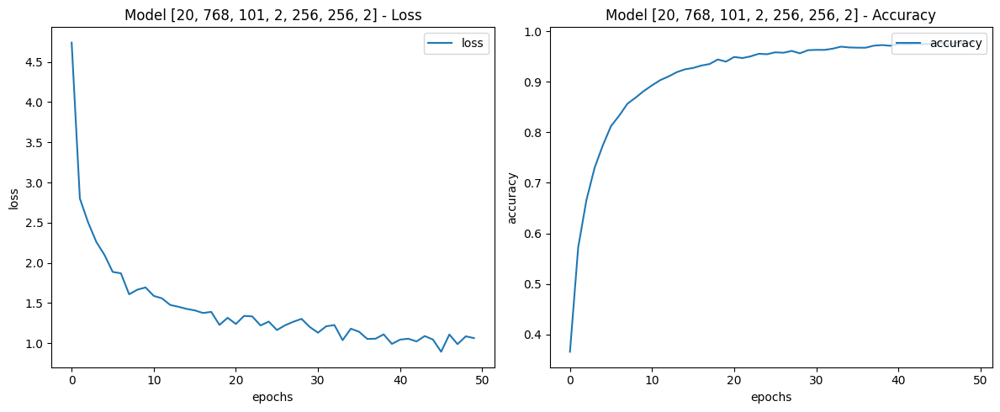

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9886 - loss: 0.5277
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
Testing Transformer_FeatureResnet_Dense Layers.....
args:  [20, 768, 101, 4, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer3 (Functional) │ (None, 20, 256)        │        729,088 │ transformer2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer4 (Functional) │ (None, 20, 256)        │        729,088 │ transformer3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_13 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 20, 512)        │              0 │ transformer4[0][0],    │
│ (Concatenate)             │                        │                │ dense_13[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_2    │ (None, 512)            │              0 │ concatenate_2[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_9 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_26 (Dense)          │ (None, 101)            │         51,813 │ dropout_9[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 3,623,781 (13.82 MB)

 Trainable params: 3,623,781 (13.82 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import os
import time
import json
import psutil
import numpy as np

# MODELS = {'LSTM': LSTM_Model, 'Transformer': Transformer_Model}
MODELS = {'Transformer_FeatureResnet_Dense': Transformer_FeatureResnet_Dense
          }

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test_2feat(features, features2, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel2(features, features2, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'/content/drive/MyDrive/model_save2/{model_test}')
        np.save(f'/content/drive/MyDrive/np_save2/{model_test}', predictions)

    del predictions

    return history

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features9']))
features2 = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features10'])) #2 hoặc 4

labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels3']))
(_,sequence_length, image_size) = features.shape

print(f"Features: {features.shape}")

for model_type in config['Tests3']: # ban đầu là 'Tests3'
    for test in config['Tests3'][model_type]: # ban đầu là 'Tests3'
        for val in config['Tests3'][model_type][test]: # ban đầu là 'Tests3'
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            store_val = defaults[test]
            defaults[test] = val
            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories3']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print('args: ', args)

            model = MODELS[model_type](*args)

            history = run_test_2feat(features, features2, labels, model, model_type, test, val, model_type, test, arg = args)
            defaults[test] = store_val

            del model



Features: (13320, 20, 768)
Testing Transformer_FeatureResnet_Dense Layers.....
args:  [20, 768, 101, 4, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer3 (Functional) │ (None, 20, 256)        │        729,088 │ transformer2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer4 (Functional) │ (None, 20, 256)        │        729,088 │ transformer3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 20, 512)        │              0 │ transformer4[0][0],    │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d      │ (None, 512)            │              0 │ concatenate[0][0]      │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_13 (Dense)          │ (None, 101)            │         51,813 │ dropout_4[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 3,623,781 (13.82 MB)

 Trainable params: 3,623,781 (13.82 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2658/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.2612 - loss: 6.1862
Epoch 1: accuracy improved from -inf to 0.35933, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 101, 4, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 49s 10ms/step - accuracy: 0.2615 - loss: 6.1824 - val_accuracy: 0.5664 - val_loss: 2.7083
Epoch 2/50
2662/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5764 - loss: 2.6360
Epoch 2: accuracy improved from 0.35933 to 0.57414, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20, 768, 101, 4, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 22s 8ms/step - accuracy: 0.5764 - loss: 2.6362 - val_accuracy: 0.6505 - val_loss: 2.7845
Epoch 3/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6760 - loss: 2.2684
Epoch 3: accuracy improved from 0.57414 to 0.66329, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Layers_[20,

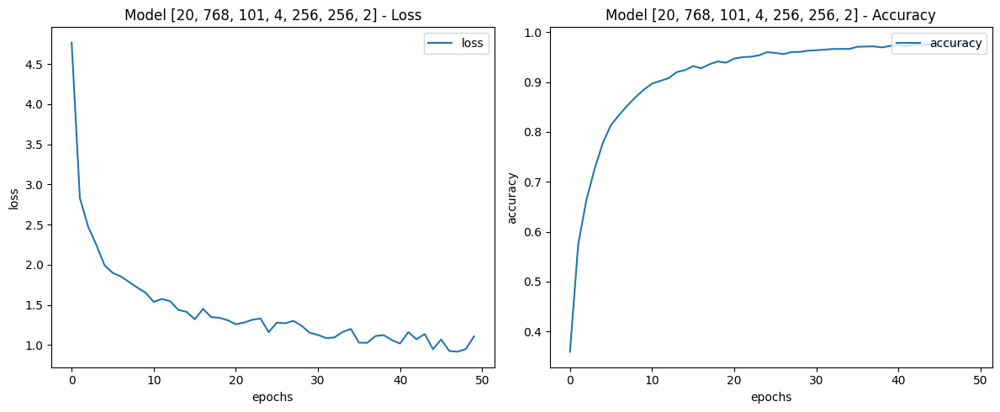

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9772 - loss: 0.9505
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step
Testing Transformer_FeatureResnet_Dense Input.....
args:  [20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_14 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_14[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_1    │ (None, 512)            │              0 │ concatenate_1[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_7 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_21 (Dense)          │ (None, 101)            │         51,813 │ dropout_7[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,165,605 (8.26 MB)

 Trainable params: 2,165,605 (8.26 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#! /usr/bin/python3

import os
import time
import json
import psutil
import numpy as np

# Personal File Imports
# import run_model
# import output
# import build_models

# MODELS = {'LSTM': LSTM_Model, 'Transformer': Transformer_Model}
MODELS = {'Transformer_FeatureResnet_Dense': Transformer_FeatureResnet_Dense
          }
GET_MEM = psutil.Process(os.getpid()).memory_info

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test_2feat(features, features2, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel2(features, features2, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'/content/drive/MyDrive/model_save2/{model_test}')
        np.save(f'/content/drive/MyDrive/np_save2/{model_test}', predictions)

    del predictions

    return history# eval_history #, end_time, mem,

data = ['Start', 'None', 'Data', time.time(), GET_MEM().rss, 0, 0, config['Setup']['Batch'], config['Setup']['Epochs']]

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features9']))
features2 = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features10'])) #2 hoặc 4

labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels3']))
(_,sequence_length, image_size) = features.shape

print(f"Features: {features.shape}")

best_loss = 100
best_val = -1

for model_type in config['Tests3']: # ban đầu là 'Tests3'
    for test in config['Tests3'][model_type]: # ban đầu là 'Tests3'
        for val in config['Tests3'][model_type][test]: # ban đầu là 'Tests3'
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            store_val = defaults[test]
            defaults[test] = val
            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories3']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print('args: ', args)

            model = MODELS[model_type](*args)

            history = run_test_2feat(features, features2, labels, model, model_type, test, val, model_type, test, arg = args) #evaluate
            defaults[test] = store_val

            # data = [test, model_type, val, evaluate[0], evaluate[1], config['Setup']['Batch'], config['Setup']['Epochs']] #end_time, mem,

            # if evaluate[0] < best_loss:
            #     best_loss = evaluate[0]
            #     best_val = val

            del model



Features: (13320, 20, 768)
Testing Transformer_FeatureResnet_Dense Input.....
args:  [20, 768, 101, 2, 512, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 512)        │      2,768,640 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 512)        │      2,637,568 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 20, 512)        │      1,049,088 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 20, 1024)       │              0 │ transformer2[0][0],    │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d      │ (None, 1024)           │              0 │ concatenate[0][0]      │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 1024)           │              0 │ global_max_pooling1d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 101)            │        103,525 │ dropout_2[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 6,558,821 (25.02 MB)

 Trainable params: 6,558,821 (25.02 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2560 - loss: 8.5515
Epoch 1: accuracy improved from -inf to 0.34957, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768, 101, 2, 512, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 49s 12ms/step - accuracy: 0.2563 - loss: 8.5481 - val_accuracy: 0.5634 - val_loss: 3.5952
Epoch 2/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5317 - loss: 4.9067
Epoch 2: accuracy improved from 0.34957 to 0.53726, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 768, 101, 2, 512, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 26s 10ms/step - accuracy: 0.5318 - loss: 4.9076 - val_accuracy: 0.6002 - val_loss: 4.8921
Epoch 3/50
2658/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6507 - loss: 4.3203
Epoch 3: accuracy improved from 0.53726 to 0.64593, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Input_[20, 7

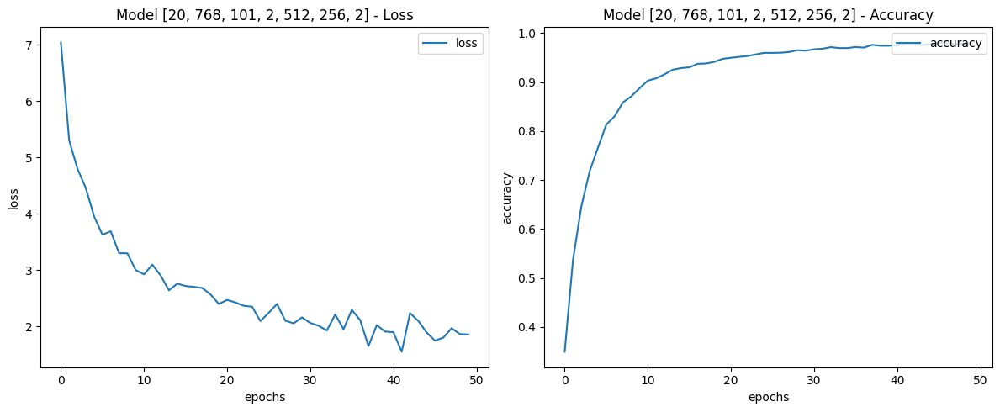

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9946 - loss: 0.5189
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
Testing Transformer_FeatureResnet_Dense Internal.....
args:  [20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_8 (Dense)           │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_8[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_1    │ (None, 512)            │              0 │ concatenate_1[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_5 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_15 (Dense)          │ (None, 101)            │         51,813 │ dropout_5[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,165,605 (8.26 MB)

 Trainable params: 2,165,605 (8.26 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2723 - loss: 6.0641
Epoch 1: accuracy improved from -inf to 0.36702, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 33s 7ms/step - accuracy: 0.2724 - loss: 6.0636 - val_accuracy: 0.5469 - val_loss: 2.5708
Epoch 2/50
2660/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5766 - loss: 2.6016
Epoch 2: accuracy improved from 0.36702 to 0.57254, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 28s 5ms/step - accuracy: 0.5766 - loss: 2.6020 - val_accuracy: 0.7455 - val_loss: 1.6161
Epoch 3/50
2657/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6730 - loss: 2.2897
Epoch 3: accuracy improved from 0.57254 to 0.66685, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal

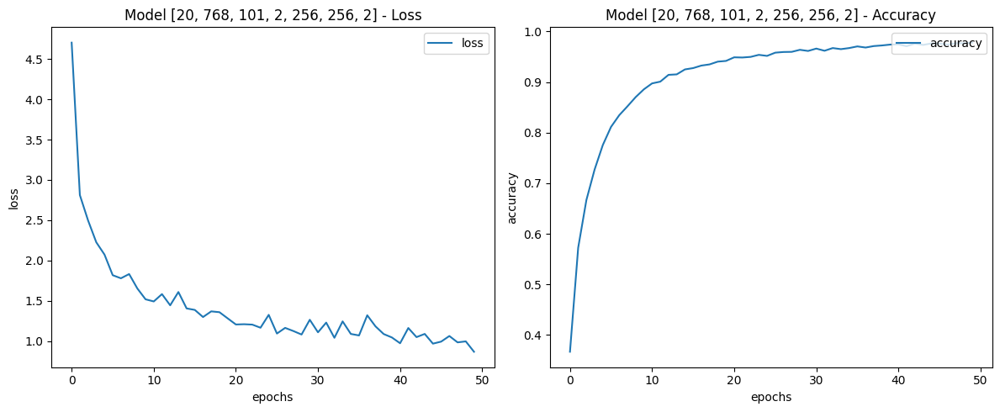

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9967 - loss: 0.0524
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
Testing Transformer_FeatureResnet_Dense Internal.....
args:  [20, 768, 101, 2, 256, 512, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        991,488 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        860,416 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_16 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_16[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_2    │ (None, 512)            │              0 │ concatenate_2[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_8 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_23 (Dense)          │ (None, 101)            │         51,813 │ dropout_8[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,428,261 (9.26 MB)

 Trainable params: 2,428,261 (9.26 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#! /usr/bin/python3

import os
import time
import json
import psutil
import numpy as np

# Personal File Imports
# import run_model
# import output
# import build_models

# MODELS = {'LSTM': LSTM_Model, 'Transformer': Transformer_Model}
MODELS = {'Transformer_FeatureResnet_Dense': Transformer_FeatureResnet_Dense
          }
GET_MEM = psutil.Process(os.getpid()).memory_info

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test_2feat(features, features2, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel2(features, features2, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'/content/drive/MyDrive/model_save2/{model_test}')
        np.save(f'/content/drive/MyDrive/np_save2/{model_test}', predictions)

    del predictions

    return history# eval_history #, end_time, mem,

data = ['Start', 'None', 'Data', time.time(), GET_MEM().rss, 0, 0, config['Setup']['Batch'], config['Setup']['Epochs']]

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features9']))
features2 = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features10'])) #2 hoặc 4

labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels3']))
(_,sequence_length, image_size) = features.shape

print(f"Features: {features.shape}")

best_loss = 100
best_val = -1

for model_type in config['Tests3']: # ban đầu là 'Tests3'
    for test in config['Tests3'][model_type]: # ban đầu là 'Tests3'
        for val in config['Tests3'][model_type][test]: # ban đầu là 'Tests3'
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            store_val = defaults[test]
            defaults[test] = val
            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories3']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print('args: ', args)

            model = MODELS[model_type](*args)

            history = run_test_2feat(features, features2, labels, model, model_type, test, val, model_type, test, arg = args) #evaluate
            defaults[test] = store_val

            # data = [test, model_type, val, evaluate[0], evaluate[1], config['Setup']['Batch'], config['Setup']['Epochs']] #end_time, mem,

            # if evaluate[0] < best_loss:
            #     best_loss = evaluate[0]
            #     best_val = val

            del model



**Attention**

Features: (13320, 20, 768)
Testing Transformer_FeatureResnet_Dense Internal.....
args:  [20, 768, 101, 2, 256, 512, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        991,488 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        860,416 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d      │ (None, 512)            │              0 │ concatenate[0][0]      │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 101)            │         51,813 │ dropout_2[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,428,261 (9.26 MB)

 Trainable params: 2,428,261 (9.26 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2656/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2661 - loss: 6.0335
Epoch 1: accuracy improved from -inf to 0.36815, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[20, 768, 101, 2, 256, 512, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 36s 8ms/step - accuracy: 0.2664 - loss: 6.0288 - val_accuracy: 0.6104 - val_loss: 2.3951
Epoch 2/50
2663/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5781 - loss: 2.6000
Epoch 2: accuracy improved from 0.36815 to 0.57442, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal_[20, 768, 101, 2, 256, 512, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 30s 7ms/step - accuracy: 0.5781 - loss: 2.6003 - val_accuracy: 0.7215 - val_loss: 1.6351
Epoch 3/50
2663/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6716 - loss: 2.2669
Epoch 3: accuracy improved from 0.57442 to 0.66376, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Internal

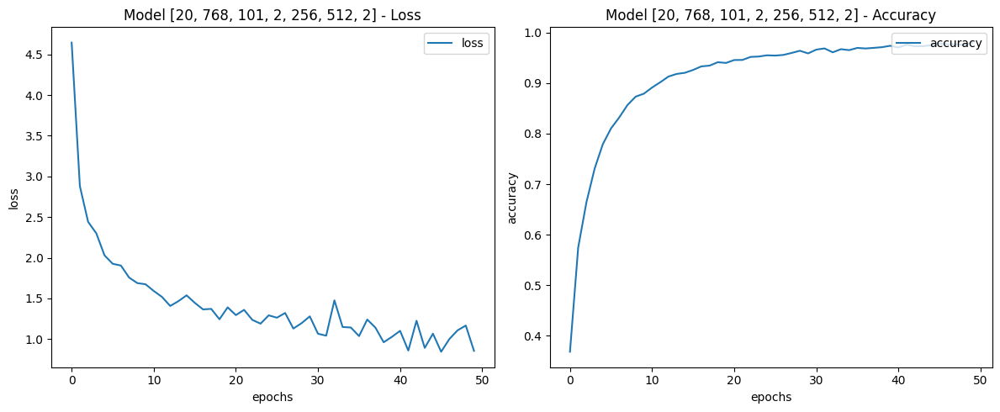

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9902 - loss: 0.4819
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
Testing Transformer_FeatureResnet_Dense Attention.....
args:  [20, 768, 101, 2, 256, 256, 1]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        597,248 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        466,176 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_8 (Dense)           │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_8[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_1    │ (None, 512)            │              0 │ concatenate_1[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_5 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_15 (Dense)          │ (None, 101)            │         51,813 │ dropout_5[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,639,781 (6.26 MB)

 Trainable params: 1,639,781 (6.26 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2662/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2630 - loss: 6.0232
Epoch 1: accuracy improved from -inf to 0.36383, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 101, 2, 256, 256, 1].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 33s 7ms/step - accuracy: 0.2631 - loss: 6.0217 - val_accuracy: 0.5961 - val_loss: 2.3386
Epoch 2/50
2663/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5722 - loss: 2.5627
Epoch 2: accuracy improved from 0.36383 to 0.57461, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 101, 2, 256, 256, 1].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.5722 - loss: 2.5629 - val_accuracy: 0.6937 - val_loss: 1.7424
Epoch 3/50
2657/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6749 - loss: 2.3373
Epoch 3: accuracy improved from 0.57461 to 0.66892, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attent

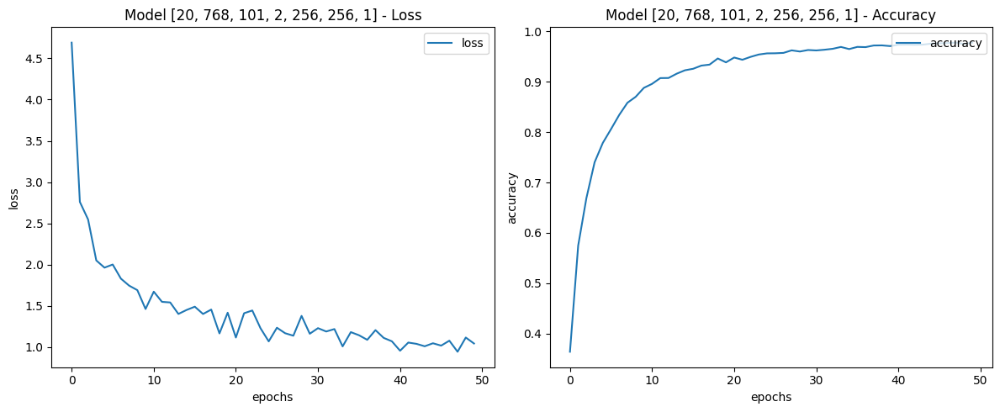

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9906 - loss: 0.4691
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
Testing Transformer_FeatureResnet_Dense Attention.....
args:  [20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_16 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_16[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_2    │ (None, 512)            │              0 │ concatenate_2[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_8 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_23 (Dense)          │ (None, 101)            │         51,813 │ dropout_8[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,165,605 (8.26 MB)

 Trainable params: 2,165,605 (8.26 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#! /usr/bin/python3

import os
import time
import json
import psutil
import numpy as np

# Personal File Imports
# import run_model
# import output
# import build_models

# MODELS = {'LSTM': LSTM_Model, 'Transformer': Transformer_Model}
MODELS = {'Transformer_FeatureResnet_Dense': Transformer_FeatureResnet_Dense
          }
GET_MEM = psutil.Process(os.getpid()).memory_info

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test_2feat(features, features2, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel2(features, features2, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'/content/drive/MyDrive/model_save2/{model_test}')
        np.save(f'/content/drive/MyDrive/np_save2/{model_test}', predictions)

    del predictions

    return history# eval_history #, end_time, mem,

data = ['Start', 'None', 'Data', time.time(), GET_MEM().rss, 0, 0, config['Setup']['Batch'], config['Setup']['Epochs']]

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features9']))
features2 = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features10'])) #2 hoặc 4

labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels3']))
(_,sequence_length, image_size) = features.shape

print(f"Features: {features.shape}")

best_loss = 100
best_val = -1

for model_type in config['Tests3']: # ban đầu là 'Tests3'
    for test in config['Tests3'][model_type]: # ban đầu là 'Tests3'
        for val in config['Tests3'][model_type][test]: # ban đầu là 'Tests3'
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            store_val = defaults[test]
            defaults[test] = val
            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories3']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print('args: ', args)

            model = MODELS[model_type](*args)

            history = run_test_2feat(features, features2, labels, model, model_type, test, val, model_type, test, arg = args) #evaluate
            defaults[test] = store_val

            # data = [test, model_type, val, evaluate[0], evaluate[1], config['Setup']['Batch'], config['Setup']['Epochs']] #end_time, mem,

            # if evaluate[0] < best_loss:
            #     best_loss = evaluate[0]
            #     best_val = val

            del model



Features: (13320, 20, 768)
Testing Transformer_FeatureResnet_Dense Attention.....
args:  [20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│                           │                        │                │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d      │ (None, 512)            │              0 │ concatenate[0][0]      │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 101)            │         51,813 │ dropout_2[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,165,605 (8.26 MB)

 Trainable params: 2,165,605 (8.26 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2663/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2626 - loss: 6.0269
Epoch 1: accuracy improved from -inf to 0.36458, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 41s 10ms/step - accuracy: 0.2627 - loss: 6.0259 - val_accuracy: 0.5908 - val_loss: 2.3274
Epoch 2/50
2662/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5762 - loss: 2.6012
Epoch 2: accuracy improved from 0.36458 to 0.57601, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 22s 5ms/step - accuracy: 0.5762 - loss: 2.6014 - val_accuracy: 0.7406 - val_loss: 1.6213
Epoch 3/50
2657/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6763 - loss: 2.2406
Epoch 3: accuracy improved from 0.57601 to 0.66967, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Atten

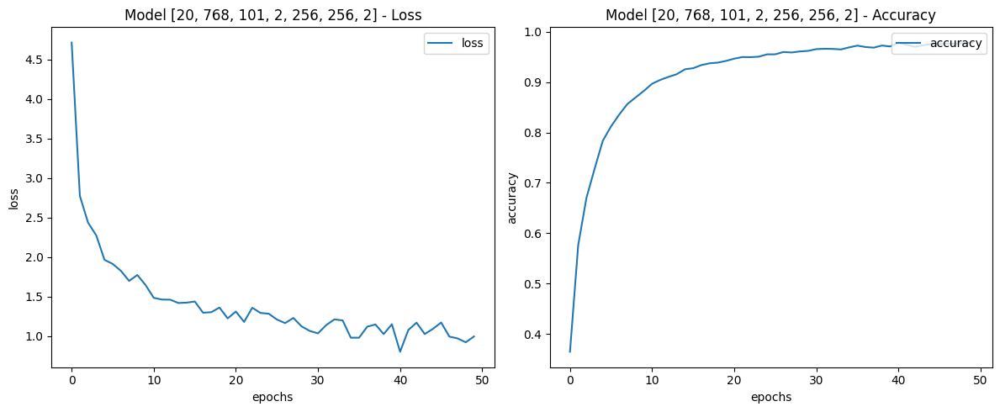

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9849 - loss: 0.5419
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
Testing Transformer_FeatureResnet_Dense Attention.....
args:  [20, 768, 101, 2, 256, 256, 4]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 20, 2048)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 20, 2048)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │      1,385,984 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │      1,254,912 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_8 (Dense)           │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_8[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_1    │ (None, 512)            │              0 │ concatenate_1[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_5 (Dropout)       │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_15 (Dense)          │ (None, 101)            │         51,813 │ dropout_5[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 3,217,253 (12.27 MB)

 Trainable params: 3,217,253 (12.27 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2657/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2701 - loss: 6.0613
Epoch 1: accuracy improved from -inf to 0.36909, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 101, 2, 256, 256, 4].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 39s 10ms/step - accuracy: 0.2704 - loss: 6.0572 - val_accuracy: 0.6231 - val_loss: 1.8341
Epoch 2/50
2661/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5717 - loss: 2.6920
Epoch 2: accuracy improved from 0.36909 to 0.56851, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 101, 2, 256, 256, 4].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 22s 6ms/step - accuracy: 0.5717 - loss: 2.6923 - val_accuracy: 0.6869 - val_loss: 1.8932
Epoch 3/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6722 - loss: 2.2301
Epoch 3: accuracy improved from 0.56851 to 0.66451, saving model to /content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Atten

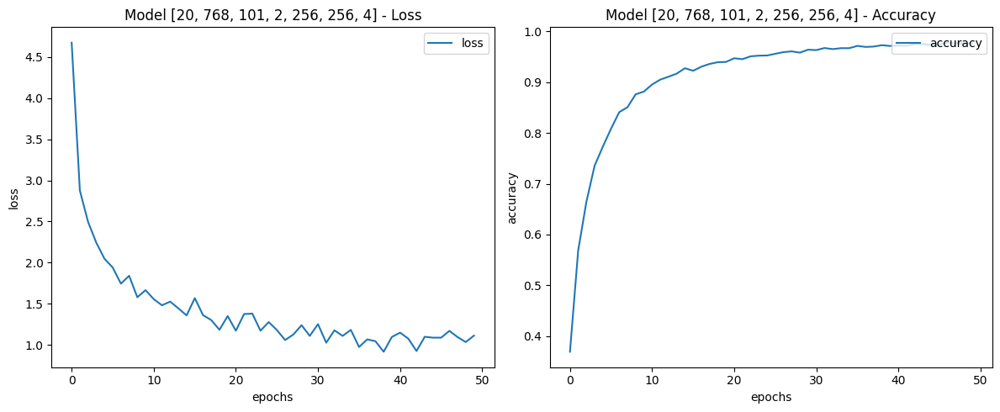

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9940 - loss: 0.2640
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step


In [ ]:
#! /usr/bin/python3

import os
import time
import json
import psutil
import numpy as np

# Personal File Imports
# import run_model
# import output
# import build_models

# MODELS = {'LSTM': LSTM_Model, 'Transformer': Transformer_Model}
MODELS = {'Transformer_FeatureResnet_Dense': Transformer_FeatureResnet_Dense
          }
GET_MEM = psutil.Process(os.getpid()).memory_info

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test_2feat(features, features2, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel2(features, features2, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'/content/drive/MyDrive/model_save2/{model_test}')
        np.save(f'/content/drive/MyDrive/np_save2/{model_test}', predictions)

    del predictions

    return history# eval_history #, end_time, mem,

data = ['Start', 'None', 'Data', time.time(), GET_MEM().rss, 0, 0, config['Setup']['Batch'], config['Setup']['Epochs']]

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features9']))
features2 = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features10'])) #2 hoặc 4

labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels3']))
(_,sequence_length, image_size) = features.shape

print(f"Features: {features.shape}")

best_loss = 100
best_val = -1

for model_type in config['Tests3']: # ban đầu là 'Tests3'
    for test in config['Tests3'][model_type]: # ban đầu là 'Tests3'
        for val in config['Tests3'][model_type][test]: # ban đầu là 'Tests3'
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            store_val = defaults[test]
            defaults[test] = val
            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories3']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print('args: ', args)

            model = MODELS[model_type](*args)

            history = run_test_2feat(features, features2, labels, model, model_type, test, val, model_type, test, arg = args) #evaluate
            defaults[test] = store_val

            # data = [test, model_type, val, evaluate[0], evaluate[1], config['Setup']['Batch'], config['Setup']['Epochs']] #end_time, mem,

            # if evaluate[0] < best_loss:
            #     best_loss = evaluate[0]
            #     best_val = val

            del model



# **Test Model Đề xuất kiểm chứng**

Features: (13320, 20, 768)
Testing Transformer_Dense_FeatureResnet Layers.....
args:  [20, 768, 101, 1, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 101)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 101)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d      │ (None, 256)            │              0 │ transformer[0][0]      │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 256)            │              0 │ global_max_pooling1d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 101)            │         25,957 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_1             │ (None, 101)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 202)            │              0 │ dense_3[0][0],         │
│                           │                        │                │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 101)            │         20,503 │ concatenate[0][0]      │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 906,620 (3.46 MB)

 Trainable params: 906,620 (3.46 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2651/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0299 - loss: 4.4482
Epoch 1: accuracy improved from -inf to 0.04861, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 101, 1, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 22s 4ms/step - accuracy: 0.0300 - loss: 4.4477 - val_accuracy: 0.0935 - val_loss: 4.2220
Epoch 2/50
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1050 - loss: 4.1945
Epoch 2: accuracy improved from 0.04861 to 0.11590, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 101, 1, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 14s 4ms/step - accuracy: 0.1050 - loss: 4.1945 - val_accuracy: 0.1640 - val_loss: 4.0757
Epoch 3/50
2655/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1467 - loss: 4.0611
Epoch 3: accuracy improved from 0.11590 to 0.14086, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 

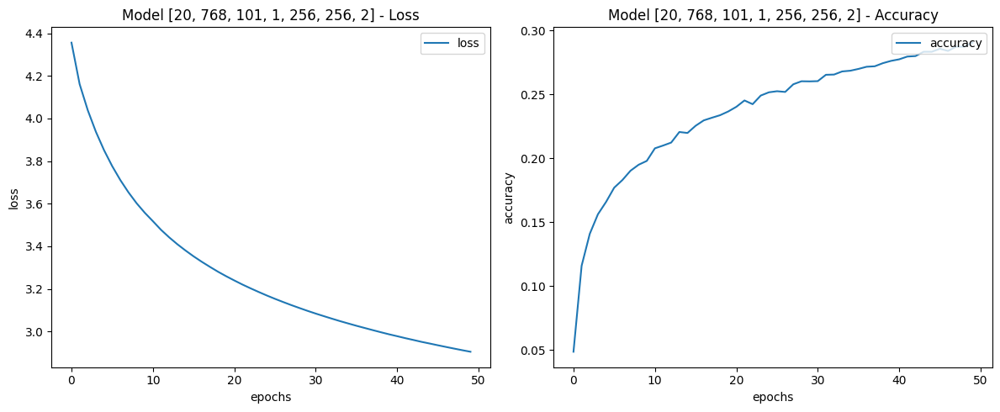

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3272 - loss: 2.8555
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer_Dense_FeatureResnet Layers.....
args:  [20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 101)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 101)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_1    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_11 (Dense)          │ (None, 101)            │         25,957 │ dropout_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_5             │ (None, 101)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 202)            │              0 │ dense_11[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_12 (Dense)          │ (None, 101)            │         20,503 │ concatenate_1[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,635,708 (6.24 MB)

 Trainable params: 1,635,708 (6.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2654/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0386 - loss: 4.4456
Epoch 1: accuracy improved from -inf to 0.05706, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 24s 5ms/step - accuracy: 0.0387 - loss: 4.4452 - val_accuracy: 0.1186 - val_loss: 4.2199
Epoch 2/50
2660/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1050 - loss: 4.1898
Epoch 2: accuracy improved from 0.05706 to 0.11684, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.1050 - loss: 4.1897 - val_accuracy: 0.1434 - val_loss: 4.0675
Epoch 3/50
2655/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1389 - loss: 4.0607
Epoch 3: accuracy improved from 0.11684 to 0.14199, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 

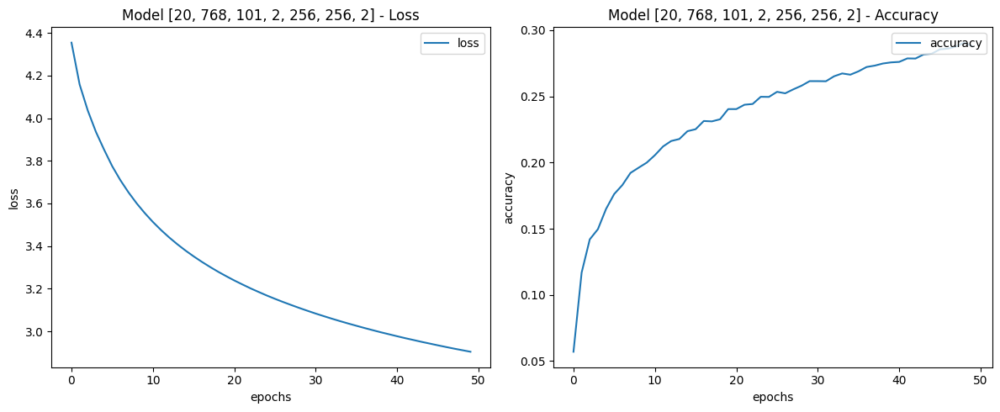

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3182 - loss: 2.8639
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
Testing Transformer_Dense_FeatureResnet Layers.....
args:  [20, 768, 101, 4, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 101)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 101)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_10[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer3 (Functional) │ (None, 20, 256)        │        729,088 │ transformer2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer4 (Functional) │ (None, 20, 256)        │        729,088 │ transformer3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_2    │ (None, 256)            │              0 │ transformer4[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_9 (Dropout)       │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_25 (Dense)          │ (None, 101)            │         25,957 │ dropout_9[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_11            │ (None, 101)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 202)            │              0 │ dense_25[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_11[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_26 (Dense)          │ (None, 101)            │         20,503 │ concatenate_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 3,093,884 (11.80 MB)

 Trainable params: 3,093,884 (11.80 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0310 - loss: 4.4515
Epoch 1: accuracy improved from -inf to 0.04889, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 101, 4, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 40s 8ms/step - accuracy: 0.0310 - loss: 4.4515 - val_accuracy: 0.1010 - val_loss: 4.2108
Epoch 2/50
2655/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1147 - loss: 4.1882
Epoch 2: accuracy improved from 0.04889 to 0.11824, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 768, 101, 4, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - accuracy: 0.1148 - loss: 4.1881 - val_accuracy: 0.1565 - val_loss: 4.0712
Epoch 3/50
2660/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1425 - loss: 4.0603
Epoch 3: accuracy improved from 0.11824 to 0.14630, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Layers_[20, 

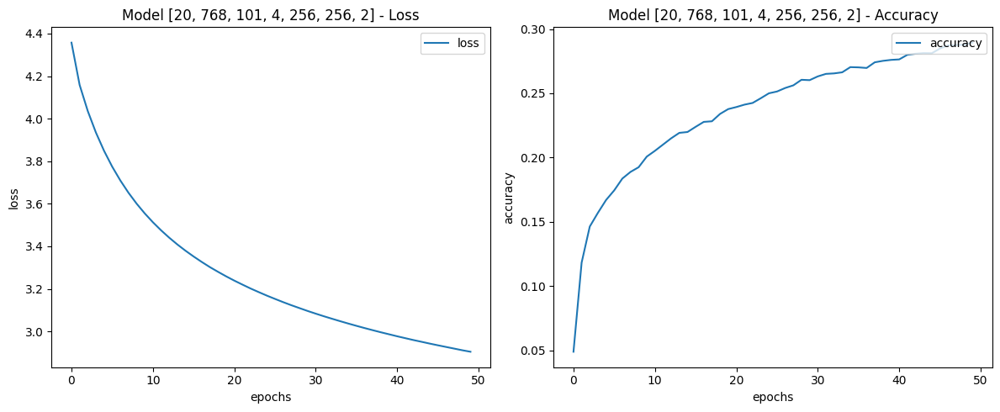

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3241 - loss: 2.8527
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step
Testing Transformer_Dense_FeatureResnet Input.....
args:  [20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 101)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 101)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_20            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_20[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_3    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_12 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_33 (Dense)          │ (None, 101)            │         25,957 │ dropout_12[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_21            │ (None, 101)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_3             │ (None, 202)            │              0 │ dense_33[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_21[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_34 (Dense)          │ (None, 101)            │         20,503 │ concatenate_3[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,635,708 (6.24 MB)

 Trainable params: 1,635,708 (6.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0348 - loss: 4.4438
Epoch 1: accuracy improved from -inf to 0.05762, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 26s 6ms/step - accuracy: 0.0348 - loss: 4.4436 - val_accuracy: 0.1104 - val_loss: 4.2065
Epoch 2/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1083 - loss: 4.1899
Epoch 2: accuracy improved from 0.05762 to 0.11374, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 34s 5ms/step - accuracy: 0.1083 - loss: 4.1898 - val_accuracy: 0.1550 - val_loss: 4.0718
Epoch 3/50
2662/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1399 - loss: 4.0601
Epoch 3: accuracy improved from 0.11374 to 0.13636, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768

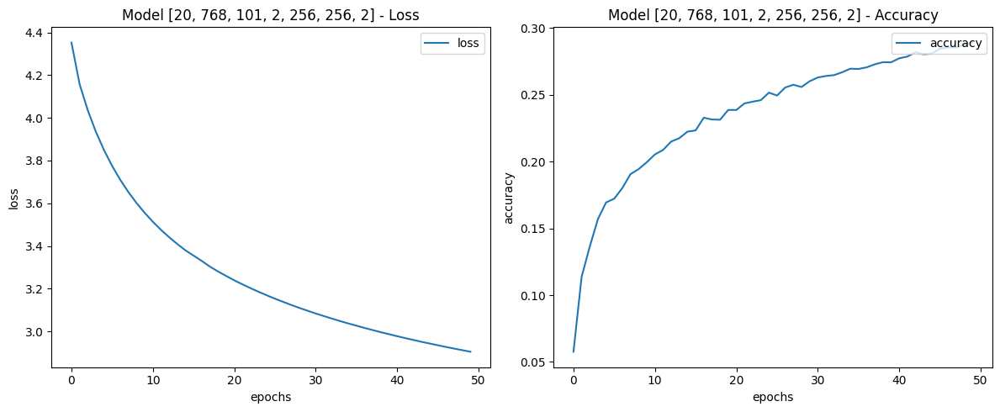

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3226 - loss: 2.8611
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing Transformer_Dense_FeatureResnet Input.....
args:  [20, 768, 101, 2, 512, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 101)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 101)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_26            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 512)        │      2,768,640 │ input_layer_26[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 512)        │      2,637,568 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_4    │ (None, 512)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_15 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_41 (Dense)          │ (None, 101)            │         51,813 │ dropout_15[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_27            │ (None, 101)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_4             │ (None, 202)            │              0 │ dense_41[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_27[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_42 (Dense)          │ (None, 101)            │         20,503 │ concatenate_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 5,478,524 (20.90 MB)

 Trainable params: 5,478,524 (20.90 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2655/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0344 - loss: 4.4480
Epoch 1: accuracy improved from -inf to 0.05940, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 101, 2, 512, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 32s 8ms/step - accuracy: 0.0345 - loss: 4.4477 - val_accuracy: 0.0901 - val_loss: 4.2145
Epoch 2/50
2662/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1091 - loss: 4.1918
Epoch 2: accuracy improved from 0.05940 to 0.11740, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768, 101, 2, 512, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - accuracy: 0.1091 - loss: 4.1918 - val_accuracy: 0.1408 - val_loss: 4.0663
Epoch 3/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1334 - loss: 4.0590
Epoch 3: accuracy improved from 0.11740 to 0.13392, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Input_[20, 768

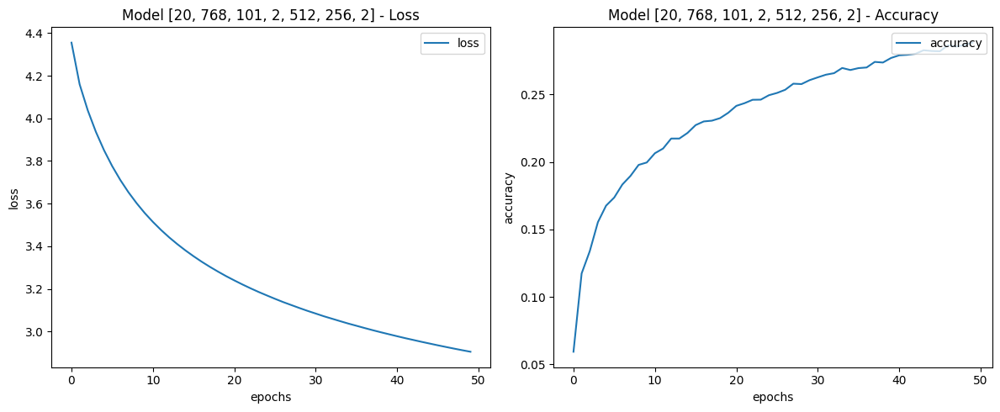

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3302 - loss: 2.8581
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
Testing Transformer_Dense_FeatureResnet Internal.....
args:  [20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 101)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 101)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_32            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_32[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_5    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_18 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_49 (Dense)          │ (None, 101)            │         25,957 │ dropout_18[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_33            │ (None, 101)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_5             │ (None, 202)            │              0 │ dense_49[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_33[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_50 (Dense)          │ (None, 101)            │         20,503 │ concatenate_5[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,635,708 (6.24 MB)

 Trainable params: 1,635,708 (6.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2662/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0326 - loss: 4.4468
Epoch 1: accuracy improved from -inf to 0.05002, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 26s 6ms/step - accuracy: 0.0326 - loss: 4.4467 - val_accuracy: 0.1002 - val_loss: 4.2140
Epoch 2/50
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0989 - loss: 4.1891
Epoch 2: accuracy improved from 0.05002 to 0.10961, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 14s 5ms/step - accuracy: 0.0989 - loss: 4.1891 - val_accuracy: 0.1310 - val_loss: 4.0734
Epoch 3/50
2663/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1380 - loss: 4.0580
Epoch 3: accuracy improved from 0.10961 to 0.14020, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal

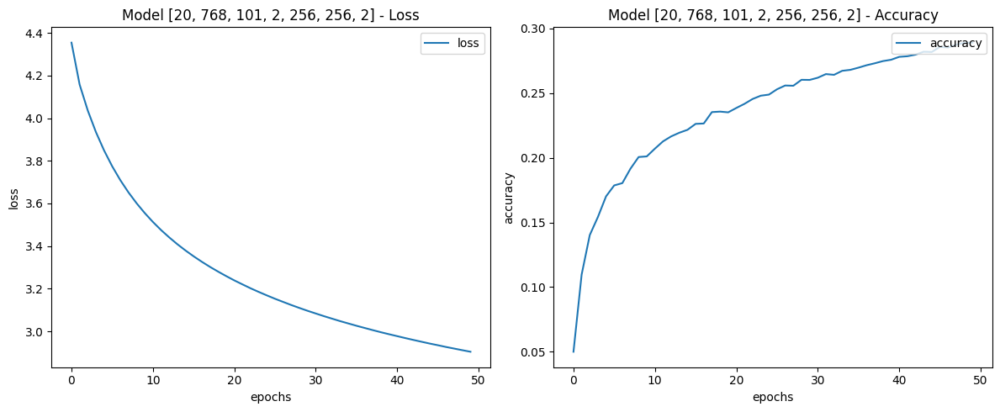

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3191 - loss: 2.8638
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
Testing Transformer_Dense_FeatureResnet Internal.....
args:  [20, 768, 101, 2, 256, 512, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 101)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 101)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_38            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        991,488 │ input_layer_38[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        860,416 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_6    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_21 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_57 (Dense)          │ (None, 101)            │         25,957 │ dropout_21[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_39            │ (None, 101)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_6             │ (None, 202)            │              0 │ dense_57[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_39[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_58 (Dense)          │ (None, 101)            │         20,503 │ concatenate_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,898,364 (7.24 MB)

 Trainable params: 1,898,364 (7.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2661/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0329 - loss: 4.4493
Epoch 1: accuracy improved from -inf to 0.04992, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[20, 768, 101, 2, 256, 512, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 29s 6ms/step - accuracy: 0.0329 - loss: 4.4491 - val_accuracy: 0.1164 - val_loss: 4.2063
Epoch 2/50
2656/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1121 - loss: 4.1915
Epoch 2: accuracy improved from 0.04992 to 0.11524, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal_[20, 768, 101, 2, 256, 512, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 32s 5ms/step - accuracy: 0.1121 - loss: 4.1914 - val_accuracy: 0.1411 - val_loss: 4.0698
Epoch 3/50
2657/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1349 - loss: 4.0633
Epoch 3: accuracy improved from 0.11524 to 0.13795, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Internal

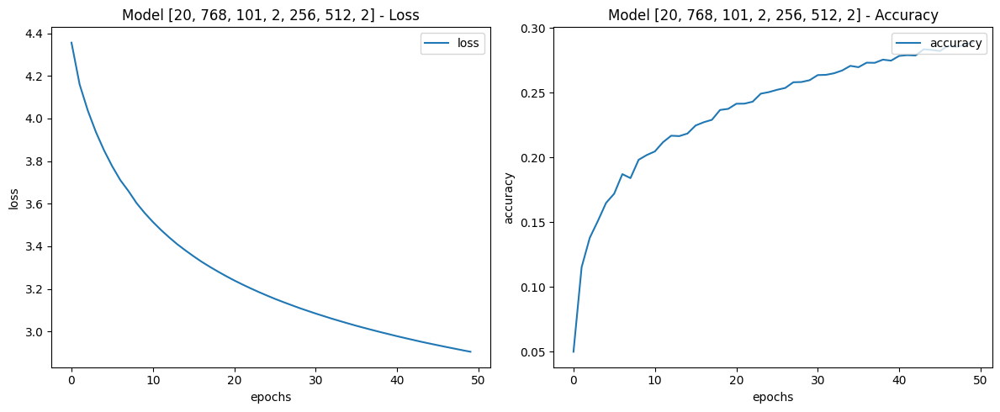

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3205 - loss: 2.8653
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
Testing Transformer_Dense_FeatureResnet Attention.....
args:  [20, 768, 101, 2, 256, 256, 1]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 101)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 101)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_44            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        597,248 │ input_layer_44[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        466,176 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_7    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_24 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_65 (Dense)          │ (None, 101)            │         25,957 │ dropout_24[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_45            │ (None, 101)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_7             │ (None, 202)            │              0 │ dense_65[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_45[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_66 (Dense)          │ (None, 101)            │         20,503 │ concatenate_7[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,109,884 (4.23 MB)

 Trainable params: 1,109,884 (4.23 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2653/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0299 - loss: 4.4464
Epoch 1: accuracy improved from -inf to 0.05114, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 101, 2, 256, 256, 1].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 26s 6ms/step - accuracy: 0.0300 - loss: 4.4460 - val_accuracy: 0.1044 - val_loss: 4.2241
Epoch 2/50
2658/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1148 - loss: 4.1885
Epoch 2: accuracy improved from 0.05114 to 0.11712, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 101, 2, 256, 256, 1].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 14s 5ms/step - accuracy: 0.1148 - loss: 4.1884 - val_accuracy: 0.1667 - val_loss: 4.0713
Epoch 3/50
2654/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1461 - loss: 4.0593
Epoch 3: accuracy improved from 0.11712 to 0.14574, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attent

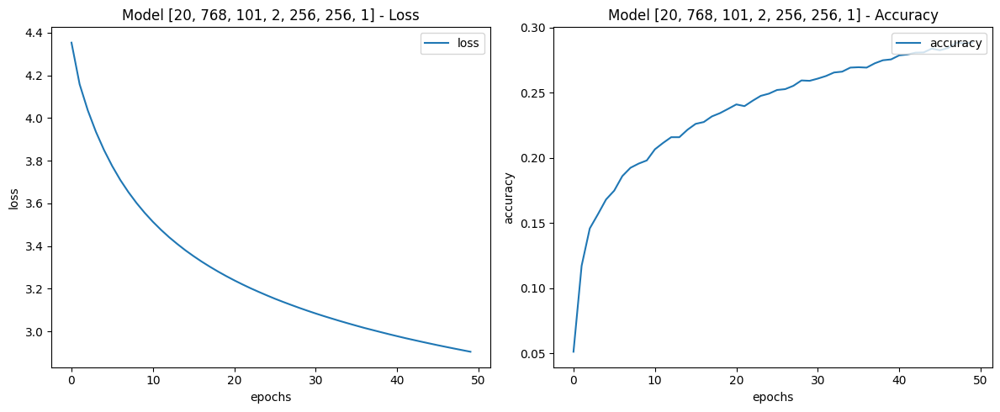

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3269 - loss: 2.8565
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
Testing Transformer_Dense_FeatureResnet Attention.....
args:  [20, 768, 101, 2, 256, 256, 2]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 101)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 101)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_50            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_layer_50[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_8    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_27 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_73 (Dense)          │ (None, 101)            │         25,957 │ dropout_27[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_51            │ (None, 101)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_8             │ (None, 202)            │              0 │ dense_73[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_51[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_74 (Dense)          │ (None, 101)            │         20,503 │ concatenate_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,635,708 (6.24 MB)

 Trainable params: 1,635,708 (6.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2660/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0316 - loss: 4.4447
Epoch 1: accuracy improved from -inf to 0.05068, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 27s 6ms/step - accuracy: 0.0316 - loss: 4.4445 - val_accuracy: 0.0364 - val_loss: 4.2240
Epoch 2/50
2657/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1019 - loss: 4.1880
Epoch 2: accuracy improved from 0.05068 to 0.10576, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 101, 2, 256, 256, 2].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 14s 5ms/step - accuracy: 0.1019 - loss: 4.1879 - val_accuracy: 0.1483 - val_loss: 4.0747
Epoch 3/50
2661/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1359 - loss: 4.0659
Epoch 3: accuracy improved from 0.10576 to 0.14161, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attent

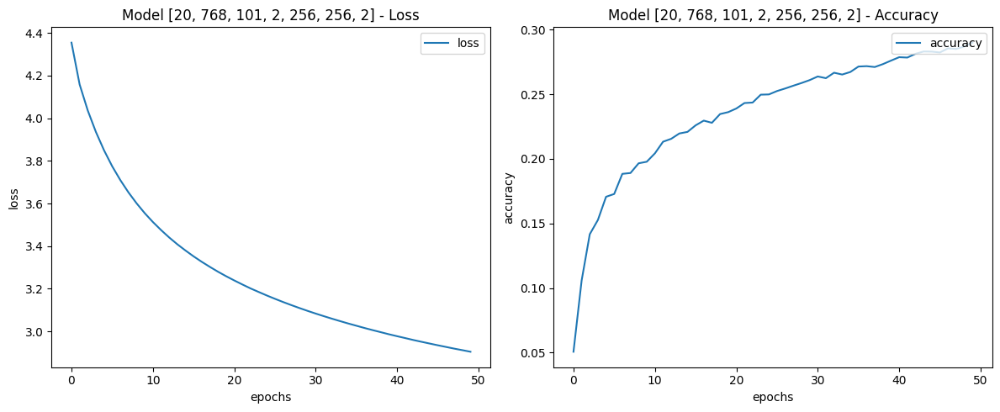

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3288 - loss: 2.8551
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
Testing Transformer_Dense_FeatureResnet Attention.....
args:  [20, 768, 101, 2, 256, 256, 4]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
feat_train2 (10656, 101)
lab_train (10656, 101)
lab_train2 (10656, 101)
feat_test (2664, 20, 768)
feat_test2 (2664, 101)
lab_test (2664, 101)
lab_test2 (2664, 101)


Model: "Transformer_Dense_FeatureResnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_56            │ (None, 20, 768)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │      1,385,984 │ input_layer_56[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │      1,254,912 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_9    │ (None, 256)            │              0 │ transformer2[0][0]     │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_30 (Dropout)      │ (None, 256)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_81 (Dense)          │ (None, 101)            │         25,957 │ dropout_30[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_57            │ (None, 101)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_9             │ (None, 202)            │              0 │ dense_81[0][0],        │
│ (Concatenate)             │                        │                │ input_layer_57[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_82 (Dense)          │ (None, 101)            │         20,503 │ concatenate_9[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,687,356 (10.25 MB)

 Trainable params: 2,687,356 (10.25 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2663/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0298 - loss: 4.4544
Epoch 1: accuracy improved from -inf to 0.04392, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 101, 2, 256, 256, 4].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 27s 6ms/step - accuracy: 0.0298 - loss: 4.4543 - val_accuracy: 0.1002 - val_loss: 4.2100
Epoch 2/50
2656/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1110 - loss: 4.1935
Epoch 2: accuracy improved from 0.04392 to 0.11730, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attention_[20, 768, 101, 2, 256, 256, 4].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 33s 5ms/step - accuracy: 0.1110 - loss: 4.1934 - val_accuracy: 0.1269 - val_loss: 4.0768
Epoch 3/50
2663/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1313 - loss: 4.0661
Epoch 3: accuracy improved from 0.11730 to 0.13814, saving model to /content/drive/MyDrive/all_model/Transformer_Dense_FeatureResnet_Attent

In [ ]:
import os
import time
import json
import psutil
import numpy as np

MODELS = {'Transformer_Dense_FeatureResnet': Transformer_Dense_FeatureResnet
          }

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test_2feat(features, features2, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel2(features, features2, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'/content/drive/MyDrive/model_save2/{model_test}')
        np.save(f'/content/drive/MyDrive/np_save2/{model_test}', predictions)

    del predictions

    return history

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features9']))
features2 = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features11'])) #2 hoặc 4

labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels3']))
(_,sequence_length, image_size) = features.shape

print(f"Features: {features.shape}")

for model_type in config['Tests4']: # ban đầu là 'Tests3'
    for test in config['Tests4'][model_type]: # ban đầu là 'Tests3'
        for val in config['Tests4'][model_type][test]: # ban đầu là 'Tests3'
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            store_val = defaults[test]
            defaults[test] = val
            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories3']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print('args: ', args)

            model = MODELS[model_type](*args)

            history = run_test_2feat(features, features2, labels, model, model_type, test, val, model_type, test, arg = args) #evaluate
            defaults[test] = store_val
            del model


# **Test Model ViT-LSTM**

Features: (13320, 20, 768)
Testing LSTM Layers.....
dong1 {'Layers': 1, 'Units': 128}
dong2 1
dong3 1
[20, 768, 101, 1, 128]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 128)                 │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 101)                 │          13,029 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 472,293 (1.80 MB)

 Trainable params: 472,293 (1.80 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0723 - loss: 4.1739
Epoch 1: accuracy improved from -inf to 0.10661, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 101, 1, 128].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 19s 5ms/step - accuracy: 0.0724 - loss: 4.1738 - val_accuracy: 0.2132 - val_loss: 3.2771
Epoch 2/50
2658/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2039 - loss: 3.3260
Epoch 2: accuracy improved from 0.10661 to 0.22382, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 101, 1, 128].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 17s 5ms/step - accuracy: 0.2039 - loss: 3.3257 - val_accuracy: 0.3363 - val_loss: 2.7455
Epoch 3/50
2654/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2979 - loss: 2.8391
Epoch 3: accuracy improved from 0.22382 to 0.31710, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 101, 1, 128].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.2980 - loss: 2.

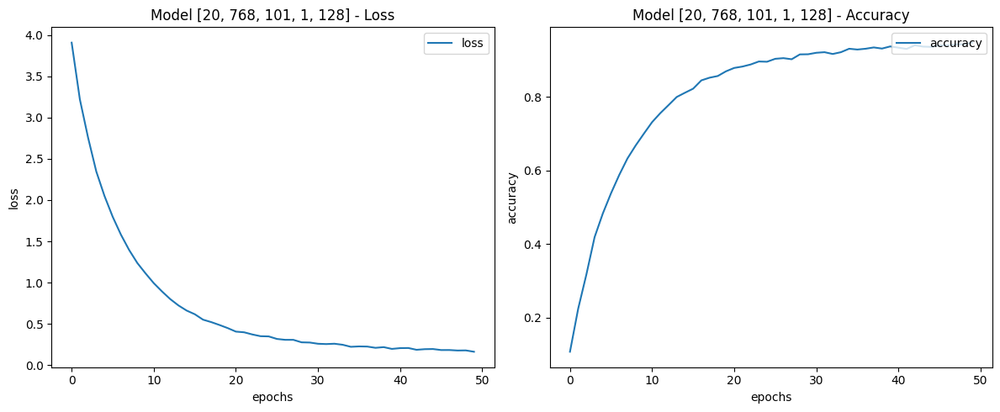

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9903 - loss: 0.0363
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Testing LSTM Layers.....
dong1 {'Layers': 1, 'Units': 128}
dong2 1
dong3 2
[20, 768, 101, 2, 128]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 20, 128)             │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 20, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 128)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 101)                 │          13,029 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 603,877 (2.30 MB)

 Trainable params: 603,877 (2.30 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2658/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0525 - loss: 4.2012
Epoch 1: accuracy improved from -inf to 0.07958, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 101, 2, 128].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 23s 8ms/step - accuracy: 0.0526 - loss: 4.2006 - val_accuracy: 0.2001 - val_loss: 3.3580
Epoch 2/50
2656/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1472 - loss: 3.5166
Epoch 2: accuracy improved from 0.07958 to 0.15419, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 101, 2, 128].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - accuracy: 0.1472 - loss: 3.5164 - val_accuracy: 0.2046 - val_loss: 2.9954
Epoch 3/50
2656/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.2147 - loss: 3.1084
Epoch 3: accuracy improved from 0.15419 to 0.22269, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 101, 2, 128].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - accuracy: 0.2147 - loss: 3.

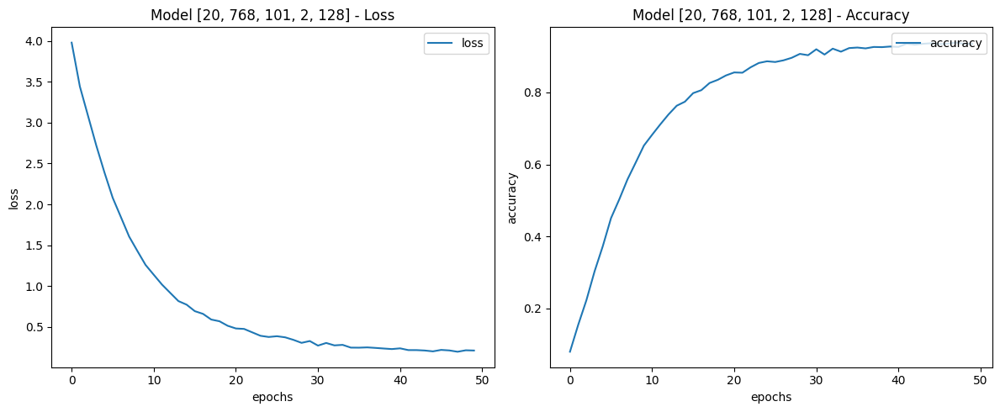

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9759 - loss: 0.0811
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
Testing LSTM Layers.....
dong1 {'Layers': 1, 'Units': 128}
dong2 1
dong3 4
[20, 768, 101, 4, 128]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 20, 128)             │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 20, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 20, 128)             │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 20, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 20, 128)             │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 20, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_6 (LSTM)                        │ (None, 128)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 101)                 │          13,029 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 867,045 (3.31 MB)

 Trainable params: 867,045 (3.31 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2662/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.0223 - loss: 4.3971
Epoch 1: accuracy improved from -inf to 0.02449, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 101, 4, 128].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 36s 12ms/step - accuracy: 0.0223 - loss: 4.3970 - val_accuracy: 0.0282 - val_loss: 4.0165
Epoch 2/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.0398 - loss: 4.1420
Epoch 2: accuracy improved from 0.02449 to 0.04458, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 101, 4, 128].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 31s 12ms/step - accuracy: 0.0398 - loss: 4.1418 - val_accuracy: 0.0623 - val_loss: 3.8794
Epoch 3/50
2663/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.0660 - loss: 3.8981
Epoch 3: accuracy improved from 0.04458 to 0.07404, saving model to /content/drive/MyDrive/all_model/LSTM_Layers_[20, 768, 101, 4, 128].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 31s 12ms/step - accuracy: 0.0660 - lo

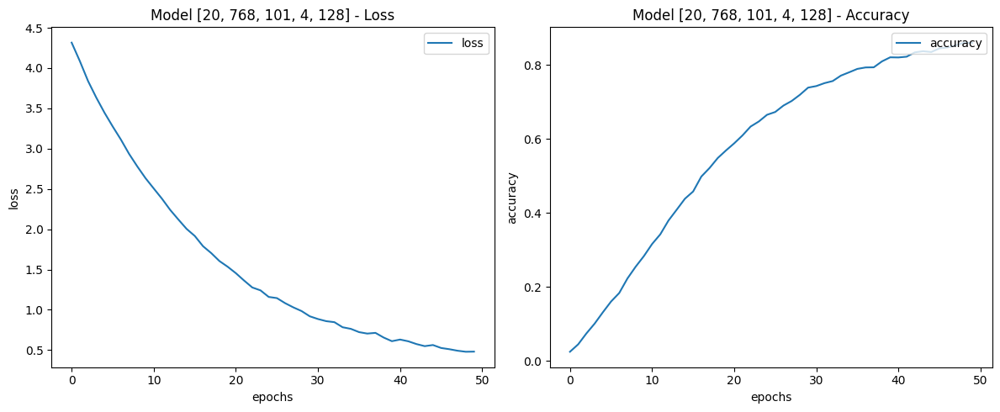

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9226 - loss: 0.2646
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
Testing LSTM Units.....
dong1 {'Layers': 1, 'Units': 128}
dong2 128
dong3 128
[20, 768, 101, 1, 128]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 128)                 │         459,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 101)                 │          13,029 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 472,293 (1.80 MB)

 Trainable params: 472,293 (1.80 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2652/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0781 - loss: 4.1563
Epoch 1: accuracy improved from -inf to 0.11177, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 101, 1, 128].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - accuracy: 0.0782 - loss: 4.1549 - val_accuracy: 0.2342 - val_loss: 3.1955
Epoch 2/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2074 - loss: 3.2747
Epoch 2: accuracy improved from 0.11177 to 0.22504, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 101, 1, 128].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 14s 5ms/step - accuracy: 0.2074 - loss: 3.2745 - val_accuracy: 0.3667 - val_loss: 2.6212
Epoch 3/50
2660/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3148 - loss: 2.7791
Epoch 3: accuracy improved from 0.22504 to 0.32020, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 101, 1, 128].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.3148 - loss: 2.779

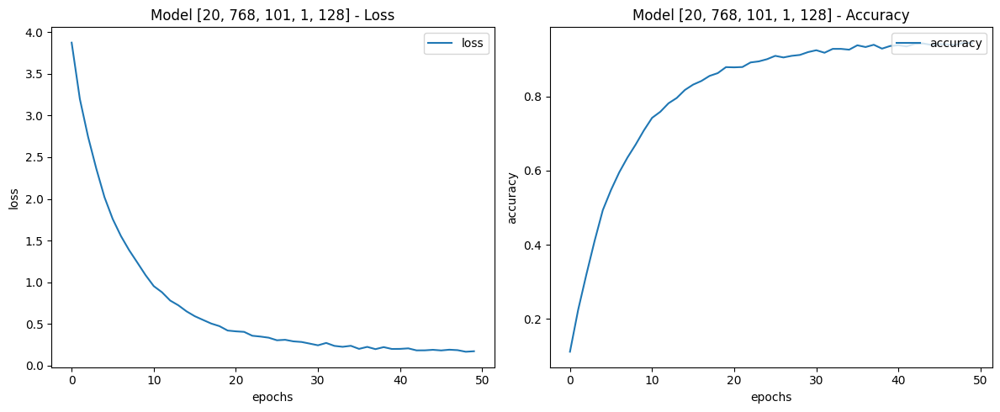

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9900 - loss: 0.0400
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Testing LSTM Units.....
dong1 {'Layers': 1, 'Units': 128}
dong2 128
dong3 256
[20, 768, 101, 1, 256]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_8 (LSTM)                        │ (None, 256)                 │       1,049,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 101)                 │          25,957 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,075,557 (4.10 MB)

 Trainable params: 1,075,557 (4.10 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2656/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0829 - loss: 4.0715
Epoch 1: accuracy improved from -inf to 0.12444, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 101, 1, 256].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - accuracy: 0.0830 - loss: 4.0704 - val_accuracy: 0.2462 - val_loss: 3.0993
Epoch 2/50
2662/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2467 - loss: 3.0571
Epoch 2: accuracy improved from 0.12444 to 0.26483, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 101, 1, 256].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - accuracy: 0.2468 - loss: 3.0570 - val_accuracy: 0.4047 - val_loss: 2.4700
Epoch 3/50
2660/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3914 - loss: 2.4428
Epoch 3: accuracy improved from 0.26483 to 0.39733, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 101, 1, 256].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.3914 - loss: 2.442

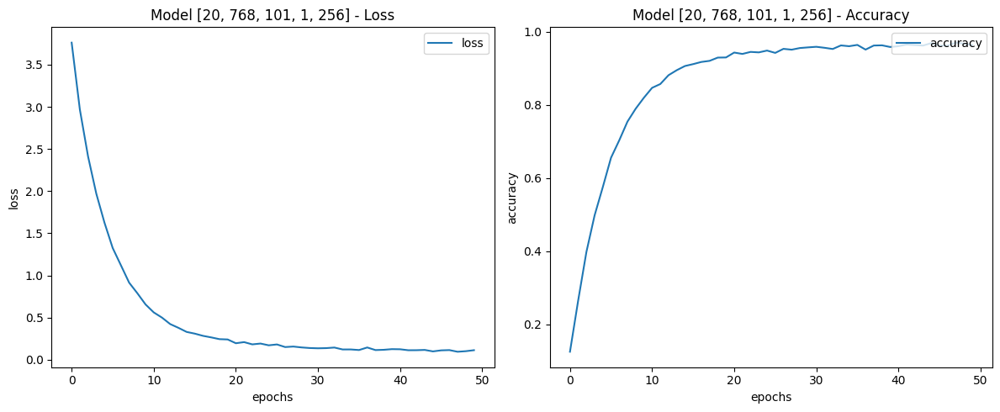

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9992 - loss: 0.0085
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Testing LSTM Units.....
dong1 {'Layers': 1, 'Units': 128}
dong2 128
dong3 512
[20, 768, 101, 1, 512]
all_video 13320
count_test 2664
count_train 10656
feat_train (10656, 20, 768)
lab_train (10656, 101)
feat_test (2664, 20, 768)
lab_test (2664, 101)


Model: "LSTM_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 20, 768)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_9 (LSTM)                        │ (None, 512)                 │       2,623,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 101)                 │          51,813 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,675,301 (10.21 MB)

 Trainable params: 2,675,301 (10.21 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
2659/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0835 - loss: 4.0791
Epoch 1: accuracy improved from -inf to 0.12613, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 101, 1, 512].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - accuracy: 0.0836 - loss: 4.0784 - val_accuracy: 0.2669 - val_loss: 3.0645
Epoch 2/50
2661/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.2639 - loss: 2.9696
Epoch 2: accuracy improved from 0.12613 to 0.29598, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 101, 1, 512].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.2640 - loss: 2.9694 - val_accuracy: 0.4437 - val_loss: 2.2410
Epoch 3/50
2660/2664 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4448 - loss: 2.2131
Epoch 3: accuracy improved from 0.29598 to 0.45711, saving model to /content/drive/MyDrive/all_model/LSTM_Units_[20, 768, 101, 1, 512].keras
2664/2664 ━━━━━━━━━━━━━━━━━━━━ 42s 8ms/step - accuracy: 0.4449 - loss: 2.213

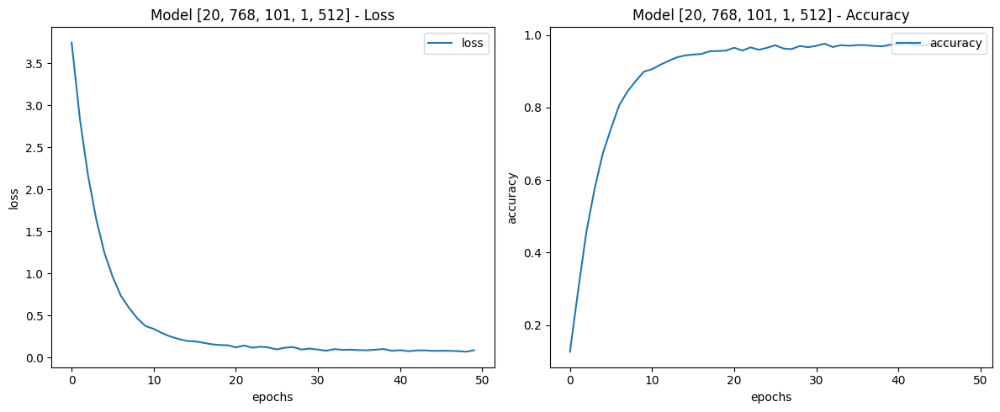

__________________________________________________
Evaluate
666/666 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9963 - loss: 0.0157
__________
666/666 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


In [ ]:
import os
import time
import json
import psutil
import numpy as np

MODELS = {'LSTM': LSTM_Model}
GET_MEM = psutil.Process(os.getpid()).memory_info

with open('tests.json') as json_file:
    data = json.load(json_file)

config = json.loads(data)

def ensure_dir(file_path):
    """
    Đảm bảo rằng thư mục cho đường dẫn tệp tồn tại.
    Nếu không, tạo nó.
    """
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def run_test(features, labels, model, model_name, model_test, val, model_type, test, arg):
    plot_model_str = f"/content/drive/MyDrive/Model_Tests/{model_name}/{model_test}/Models_Graphs/{val}_{model_test}.png"
    ensure_dir(plot_model_str)  # Đảm bảo thư mục tồn tại
    (model, predictions), history = FitModel(features, labels, model, plot_model_str, model_type, test, arg, batch_size=config['Setup']['Batch'], epochs=config['Setup']['Epochs'])

    if config['Setup']['Save'] == True:
        model.save(f'Models/{model_test}')
        np.save(f'Predictions/{model_test}', predictions)

    del predictions
    return history #, end_time, mem,

data = ['Start', 'None', 'Data', time.time(), GET_MEM().rss, 0, 0, config['Setup']['Batch'], config['Setup']['Epochs']]

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features9']))
labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels3']))
(_,sequence_length, image_size) = features.shape
print(f"Features: {features.shape}")

best_loss = 100
best_val = -1

for model_type in config['Tests1']:
    for test in config['Tests1'][model_type]:
        for val in config['Tests1'][model_type][test]:
            os.system('clear')
            print(f"Testing {model_type} {test}.....")

            defaults = config['Defaults'][model_type]
            print('dong1', defaults)

            store_val = defaults[test]
            print('dong2', store_val)

            defaults[test] = val
            print('dong3', defaults[test])

            args = list(defaults.values())
            args = [sequence_length, image_size, config['Setup']['Categories3']] + args #giải thích vì sao model Transfomer 6 tham số còn config 4 tham số vẫn chạy
            print(args)

            model = MODELS[model_type](*args)

            history = run_test(features, labels, model, model_type, test, val, model_type, test, args) #end_time, mem,
            defaults[test] = store_val

            # data = [test, model_type, val, evaluate[0], evaluate[1], config['Setup']['Batch'], config['Setup']['Epochs']] #end_time, mem,

            # if evaluate[0] < best_loss:
            #     best_loss = evaluate[0]
            #     best_val = val

            # del OutputData
            del model

        # config['Defaults'][model_type][test] = best_val if best_val != -1 else config['Defaults'][model_type][test]

        # best_loss = 100
        # best_val = -1

# **Feature map**

# **ViT attention map**

Model: "vit-b16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 embedding (Conv2D)          (None, 2, 2, 768)         590592    
                                                                 
 reshape_8 (Reshape)         (None, 4, 768)            0         
                                                                 
 class_token (ClassToken)    (None, 5, 768)            768       
                                                                 
 Transformer/posembed_input  (None, 5, 768)            3840      
  (AddPositionEmbs)                                              
                                                                 
 Transformer/encoderblock_0  ((None, 5, 768),          7087872   
  (TransformerBlock)          (None, 12, None, None)       

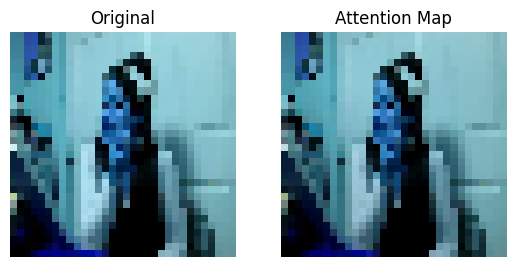

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from vit_keras import vit, utils, visualize
import cv2
import os

# Load a model
image_size = 32
classes = utils.get_imagenet_classes()
model = vit.vit_b16(
    image_size=image_size,
    activation='sigmoid',
    pretrained=True,
    include_top=False,
    pretrained_top=False
)
model.summary()

# Load the image and compute the attention map
features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features100']))
image = features[0][0]  # Use the image array directly
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
if image.shape != (image_size, image_size, 3):
    image = cv2.resize(image, (image_size, image_size))  # Resize if necessary

# Compute attention map
attention_map = visualize.attention_map(model=model, image=image)

# Prediction
preprocessed_image = vit.preprocess_inputs(image)[np.newaxis]
predicted_class_index = model.predict(preprocessed_image)[0].argmax()
predicted_class = classes[predicted_class_index]
print('Prediction:', predicted_class)  # Prediction: Eskimo dog, husky (example)

# Plot results
fig, (ax1, ax2) = plt.subplots(ncols=2)
ax1.axis('off')
ax2.axis('off')
ax1.set_title('Original')
ax2.set_title('Attention Map')
_ = ax1.imshow(image)
_ = ax2.imshow(attention_map)


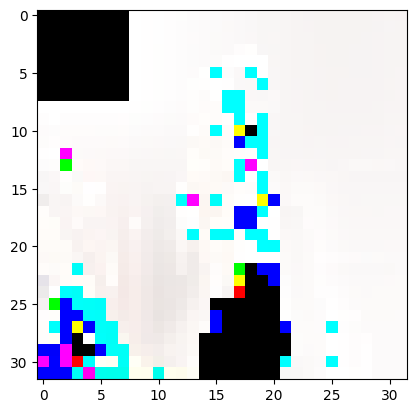

In [ ]:
dif = abs(attention_map - image)
plt.imshow(dif)
# print(dif)

# **ResNet feature map**

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input

inputs = Input(shape=(32, 32, 3))
base_model = ResNet50(include_top=False, weights='imagenet', input_tensor=inputs)

model = Model(inputs=base_model.input, outputs=base_model.get_layer("conv5_block3_out").output)
model.summary()
print(model.output.shape)



94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 32, 32, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 38, 38, 3)      │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 16, 16, 64)     │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 16, 16, 64)     │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 16, 16, 64)     │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 18, 18, 64)     │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 8, 8, 64)       │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 8, 8, 64)       │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 8, 8, 64)       │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 8, 8, 64)       │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 8, 8, 64)       │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 8, 8, 64)       │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 8, 8, 64)       │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 8, 8, 256)      │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 8, 8, 256)      │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

(None, 1, 1, 2048)


In [ ]:
import numpy as np
from tensorflow.keras.preprocessing import image
import os

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features100']))

img = features[0][0]
img = np.resize(img, (32, 32, 3))
img_tensor = np.expand_dims(img, axis=0)
print(img.shape)


(32, 32, 3)


In [ ]:
# Tính toán các đặc trưng (feature maps)
feature_maps = model.predict(img_tensor)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


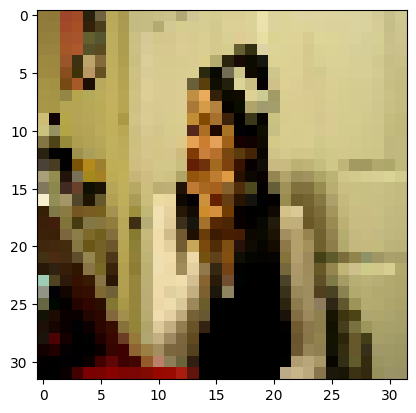

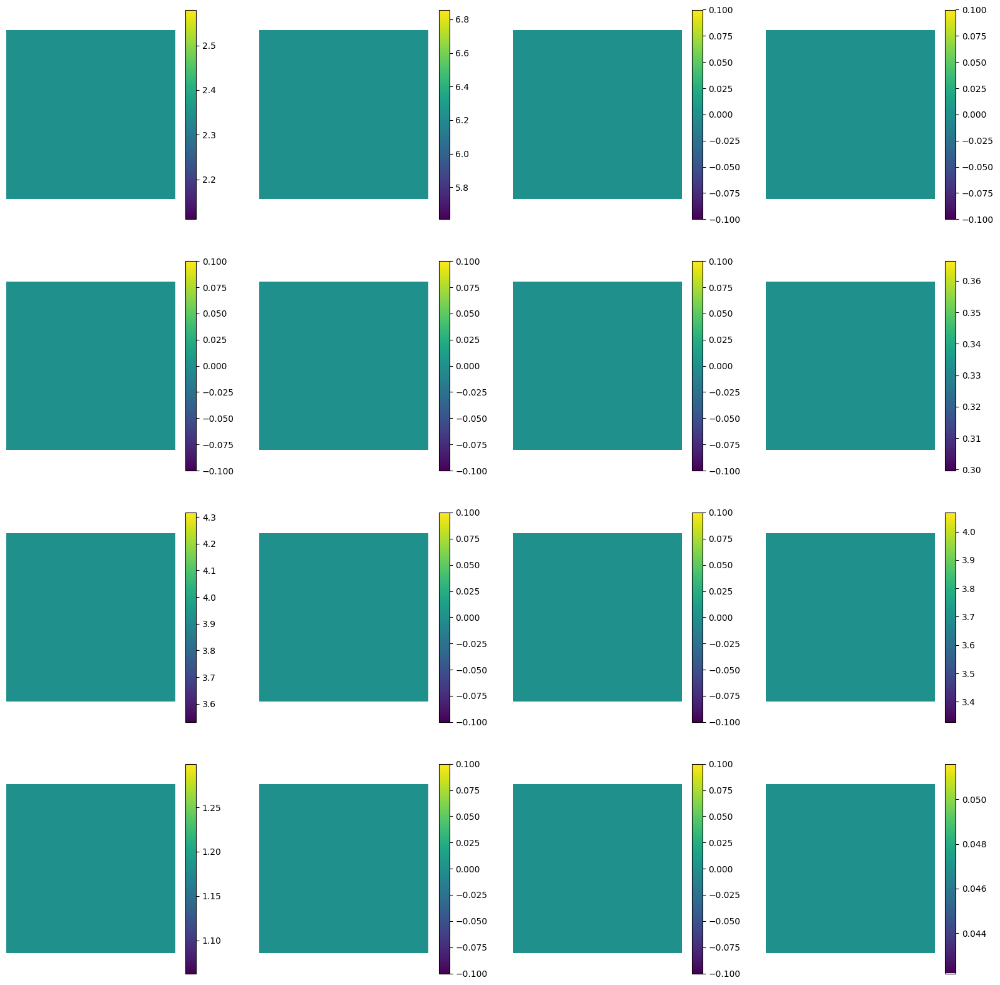

(1, 1, 1, 2048)


In [ ]:
import matplotlib.pyplot as plt
import cv2

# Số lượng kênh ở lớp tích chập cuối cùng
num_channels = feature_maps.shape[-1]

# Hiển thị một số lượng nhỏ các bản đồ đặc trưng (ví dụ: 16 bản đồ đầu tiên)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.figure(figsize=(20, 20))
for i in range(16):  # Hiển thị 16 kênh đầu tiên
    plt.subplot(4, 4, i + 1)
    plt.imshow(feature_maps[0, :, :, i], cmap='viridis',interpolation='nearest')
    plt.axis('off')
    plt.colorbar()

plt.show()
print(feature_maps.shape)

In [ ]:
# max_value = np.max(feature_maps)
# print("Giá trị lớn nhất trong ma trận là:", max_value)
feature_maps

array([[[[2.3453941, 6.233898 , 0.       , ..., 0.       , 0.       ,
          0.       ]]]], dtype=float32)

# **Features map sau khi trích xuất 2D**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features5']))

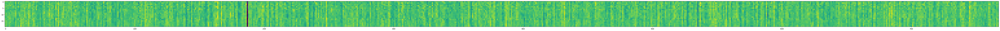

In [ ]:
plt.figure(figsize=(100, 50))  # You can change (10, 10) to your desired width and height

# Display the image
plt.imshow(features[0])
plt.show()

# **Load**

In [ ]:
tf.keras.utils.get_custom_objects().clear()

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

class PositionalEncoding(layers.Layer):
    def __init__(self, sequence_length, projection_dim, **kwargs):
        super(PositionalEncoding, self).__init__(**kwargs)
        self.position_embeddings = layers.Embedding(input_dim=sequence_length, output_dim=projection_dim)
        self.projection = layers.Dense(units=projection_dim)
        self.sequence_length = sequence_length
        self.projection_dim = projection_dim

    def build(self, input_shape):
        pass

    def call(self, inputs):
        positions = tf.range(start=0, limit=self.sequence_length, delta=1)
        encoded_positions = self.position_embeddings(positions)
        projection = self.projection(inputs)
        encoding = projection + encoded_positions
        return encoding

    def get_config(self):
        config = super(PositionalEncoding, self).get_config()
        config.update({
            "sequence_length": self.sequence_length,
            "projection_dim": self.projection_dim
        })
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)

class Encoder(layers.Layer):
    def __init__(self, embed_dim, dense_dim, num_heads, activation='relu', **kwargs):
        super(Encoder, self).__init__(**kwargs)
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim, dropout=0.25)
        self.dense_proj = keras.Sequential([
            layers.Dense(dense_dim, activation=activation),
            layers.Dense(embed_dim),
        ])
        self.layernorm = layers.LayerNormalization()
        self.embed_dim = embed_dim
        self.dense_dim = dense_dim
        self.num_heads = num_heads

    def build(self, input_shape):
        pass

    def call(self, inputs):
        attention_matrix = self.attention(inputs, inputs)
        normalized_attention_output = self.layernorm(inputs + attention_matrix)
        projection = self.dense_proj(normalized_attention_output)
        normalized_projection = self.layernorm(normalized_attention_output + projection)
        return normalized_projection

    def get_config(self):
        config = super(Encoder, self).get_config()
        config.update({
            "embed_dim": self.embed_dim,
            "dense_dim": self.dense_dim,
            "num_heads": self.num_heads
        })
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)


In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Embedding, Dense, LayerNormalization # Import necessary layers


custom_objects = {
    "PositionalEncoding": PositionalEncoding,
    "Encoder": Encoder,
    # "Embedding": Embedding,  # Add Embedding to custom objects
    # "Dense": Dense,          # Add Dense to custom objects
    # "LayerNormalization": LayerNormalization  # Add LayerNormalization
}

with keras.utils.custom_object_scope(custom_objects):
    reconstructed_model = keras.models.load_model("/content/drive/MyDrive/all_model/Transformer_FeatureResnet_Dense_Attention_[20, 768, 50, 2, 256, 256, 2].keras")

In [ ]:
import numpy as np
import os

features = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features1']))
features2 = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Features2']))
labels = np.load(os.path.join(config['Setup']['Dir'], config['Setup']['Labels']))


In [ ]:
from tensorflow.keras.utils import to_categorical
labels_one_hot = to_categorical(labels, num_classes=50)

In [ ]:
print(features.shape)
print(features2.shape)
print(labels.shape)

(6681, 20, 768)
(6681, 20, 2048)
(6681,)


In [ ]:
# tf.config.run_functions_eagerly(True)

# feature_maps = reconstructed_model.evaluate([features, features2], labels_one_hot)

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


212/212 ━━━━━━━━━━━━━━━━━━━━ 42s 194ms/step - accuracy: 0.9671 - loss: 4.4461


In [ ]:
print(reconstructed_model.summary())


Model: "Transformer_FeatureResnet_Dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_67 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_8             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_67[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_8    │ (None, 512)            │              0 │ concatenate_8[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_25 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_74 (Dense)          │ (None, 50)             │         25,650 │ dropout_25[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 6,418,328 (24.48 MB)

 Trainable params: 2,139,442 (8.16 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,278,886 (16.32 MB)

None


In [ ]:
for i in reconstructed_model.layers:
    print(i.name)

input_vit
transformer
input_resnet
transformer2
dense_67
concatenate_8
global_max_pooling1d_8
dropout_25
dense_74


In [ ]:
from tensorflow.keras.models import Model
layer_name = 'dense_74'  # Thay thế bằng tên lớp của bạn
intermediate_layer_model = Model(inputs=reconstructed_model.input,
                                 outputs=reconstructed_model.get_layer(layer_name).output)

In [ ]:
intermediate_layer_model.summary()

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_vit (InputLayer)    │ (None, 20, 768)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer (Functional)  │ (None, 20, 256)        │        860,160 │ input_vit[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_resnet (InputLayer) │ (None, 20, 2048)       │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer2 (Functional) │ (None, 20, 256)        │        729,088 │ transformer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_67 (Dense)          │ (None, 20, 256)        │        524,544 │ input_resnet[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_8             │ (None, 20, 512)        │              0 │ transformer2[0][0],    │
│ (Concatenate)             │                        │                │ dense_67[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling1d_8    │ (None, 512)            │              0 │ concatenate_8[0][0]    │
│ (GlobalMaxPooling1D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_25 (Dropout)      │ (None, 512)            │              0 │ global_max_pooling1d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_74 (Dense)          │ (None, 50)             │         25,650 │ dropout_25[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,139,442 (8.16 MB)

 Trainable params: 2,139,442 (8.16 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
feature_maps = intermediate_layer_model.predict([features, features2])

209/209 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step


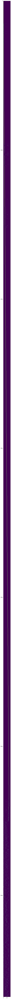

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(100, 200))  # You can change (10, 10) to your desired width and height

# Display the image
plt.imshow(feature_maps)
plt.show()


**sau lớp concatenate**

# **Load model kiểm chứng**